# Coffee Futures Price & Quality Analysis
<p>Done by: Ng Chuen Siong, Nelson<p/>

## Problem Statement

<p> We are a group of friends who are interested in venturing into the business of selling premium coffee (arabica), because of the growing global demand for coffee consumption despite the rising coffee prices <a href=https://www.bloomberg.com/news/articles/2021-11-12/coffee-hits-seven-year-high-as-global-supply-threats-worsen#xj4y7vzkg?sref=AZokV7G6> [1]</a>.

## Business Research Questions

<ol>
    <li>Is the mean coffee total quality score similar among countries?</li>
    <li>Is the mean coffee price (USD) similar among coffee total quality score?</li>
    <li>What is the ideal price to purchase coffee?</li>
    <li>Is it a good time to enter the business of selling premium coffee?</li>
</ol>

## Project Objectives

### Project Phase 1

<ul>
    <li>Check whether coffee total quality score is systematically higher or different in some countries than in others.</li>
</ul>

### Project Phase 2

<ul>
    <li>Check whether coffee price (USD) is systematically higher or different in some total quality score classification than in others.</li>
</ul>

### Project Phase 3

<ul>
    <li>Check whether sample coffee price (USD) mean  is equal, larger, or smaller than the population coffee price (USD) mean.</li>
</ul>

### Project Phase 4

<ul>
    <li>Evaluate the feasibility of selling premium coffee in the current environment.</li>
</ul>

<p>Datasets: Kaggle's Coffee Quality database from CQI<a href=https://www.kaggle.com/volpatto/coffee-quality-database-from-cqi> [2]</a>, Macrotrends's Coffee Prices - 45 Year Historical Chart<a href=https://www.macrotrends.net/2535/coffee-prices-historical-chart-data> [3]</a>.</p>

## Problem Solving Steps

### Project Phase 1

<ol>
    <li>Ensure that the sample is normally distributed.
        <ul>
            <li>If the sample is not normally distributed, test for normal distribution after performing data transformation (box-cox, yeo-johnson, log-normal, and square root) on it. </li>
        </ul>
    </li>
    <li>If sample is still not normally distributed after performing data transformation. Kruskal–Wallis H test and Mann-Whitney U Test (non-parametric tests) are used instead of ANOVA and Turkey's Test (parametric tests).</li>
</ol>

Note: The sample data is based on coffee total quality score from 30 April, 2010 to 19 January, 2018.

### Project Phase 2

<ol>
    <li>Ensure that the sample is normally distributed.
        <ul>
            <li>If the sample is not normally distributed, test for normal distribution after performing data transformation (box-cox, yeo-johnson, log-normal, and square root) on it. </li>
        </ul>
    </li>
    <li>If sample is still not normally distributed after performing data transformation. Kruskal–Wallis H test and Mann-Whitney U Test (non-parametric tests) are used instead of ANOVA and Turkey's Test (parametric tests).</li>
</ol>

Note: The sample data is based on coffee price (USD) from 30 April, 2010 to 19 January, 2018.

### Project Phase 3

<ol>
    <li>Ensure that the population is normally distributed.
        <ul>
            <li>If the population is not normally distributed, perform box-cox transformation on population. To create a new population, select a start date from one of the earliest date with the highest p-value (p-value > 0.05). p-value is obtained using D'Agostino-Pearson test.</li>
        </ul>
    </li>
    <li>Perform 1 sample Z test on the box-cox transformed versions of the previous sample and new population to test whether the sample mean is equal, greater, or smaller than the new population mean.</li>
    <li>Perform inverse box-cox transform to find the new population mean and sample mean.</li>
</ol>

Note: The sample data is based on coffee price (USD) from 30 April, 2010 to 19 January, 2018, and the population data is based on coffee price (USD) from 20 August, 1973 to 13 October, 2021.

### Project Phase 4

<ol>
    <li>Create boxplots of Coffee Price (USD) to check where the current Coffee Price (USD) lies.</li>
</ol>   
Note: The population data is based on coffee price (USD) from July 1, 1974 to 13 October, 2021.

## Import Libraries & Packages

### Import Libraries

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats as stats
import seaborn as sns 
import warnings
warnings.filterwarnings('ignore')

from scipy.stats import anderson
from scipy.stats import boxcox 
from scipy.stats import chi2_contingency
from scipy.stats import normaltest 
from scipy.stats import shapiro 
from scipy.stats import skew 
from scipy.stats import yeojohnson 
from statsmodels.graphics.gofplots import qqplot

### Import Packages

In [2]:
# Import my packages. 
import my_Functions_cf_clean as myfcf_cle
import my_Functions_cf_wrangle as myfcf_wra
import my_Functions_cf_graph as myfcf_gra
import my_Functions_cf_stats as myfcf_sta

## Data Preparation

### Import Data

#### Coffee Price

In [3]:
# Import coffee_price.csv into a pandas dataframe.  
cfp_df = pd.read_csv('./Data/coffee_price.csv')

# Rename columns of cfp_df.
cfp_df.rename(columns={'date': 'Date', 'value': 'Coffee Price (USD)'}, inplace=True)

# Display the head of cfp_df.
cfp_df.head()

,Date,Coffee Price (USD)
0,20/8/73,0.6735
1,21/8/73,0.6710
2,22/8/73,0.6580
3,23/8/73,0.6675
4,24/8/73,0.6660


#### Coffee Quality

In [4]:
# Import coffee_quality.csv into a pandas dataframe.  
cfq_df = pd.read_csv('./Data/coffee_quality.csv')

# Select the relevant columns. 
cfq_df = cfq_df[['Species', 'Country.of.Origin', 'Grading.Date', 'Total.Cup.Points']]

# Rename the columns. 
cfq_df.rename(columns={'Country.of.Origin': 'Origin', 
                       'Grading.Date':'Date', 
                       'Total.Cup.Points':'Total Quality Score'}, inplace=True)

### Check Data Types

#### Coffee Price

In [5]:
# Display datatypes for cfp_df. 
cfp_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12075 entries, 0 to 12074
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Date                12075 non-null  object 
 1   Coffee Price (USD)  12075 non-null  float64
dtypes: float64(1), object(1)
memory usage: 188.8+ KB


In [6]:
# Convert column 'Date' of cfp_df to datetime format. 
cfp_df['Date'] = pd.to_datetime(cfp_df['Date'])

In [7]:
# Display datatypes for cfp_df. 
cfp_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12075 entries, 0 to 12074
Data columns (total 2 columns):
 #   Column              Non-Null Count  Dtype         
---  ------              --------------  -----         
 0   Date                12075 non-null  datetime64[ns]
 1   Coffee Price (USD)  12075 non-null  float64       
dtypes: datetime64[ns](1), float64(1)
memory usage: 188.8 KB


#### Coffee Quality

In [8]:
# Display datatypes for cfq_df. 
cfq_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1339 entries, 0 to 1338
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Species              1339 non-null   object 
 1   Origin               1338 non-null   object 
 2   Date                 1339 non-null   object 
 3   Total Quality Score  1339 non-null   float64
dtypes: float64(1), object(3)
memory usage: 42.0+ KB


In [9]:
# Convert column 'Date' of cfq_df to datetime format. 
cfq_df['Date'] = pd.to_datetime(cfq_df['Date'])

# Sort 'Date' column.
cfq_df.sort_values(by='Date', inplace=True)

In [10]:
# Convert columns 'Species' and 'Origin' to category format.
cfq_df['Species'] = cfq_df['Species'].astype('category')
cfq_df['Origin'] = cfq_df['Origin'].astype('category')

In [11]:
# Display datatypes for cfq_df. 
cfq_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1339 entries, 1164 to 895
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Species              1339 non-null   category      
 1   Origin               1338 non-null   category      
 2   Date                 1339 non-null   datetime64[ns]
 3   Total Quality Score  1339 non-null   float64       
dtypes: category(2), datetime64[ns](1), float64(1)
memory usage: 35.4 KB


### Check for Null Values

#### Coffee Price

##### Overview

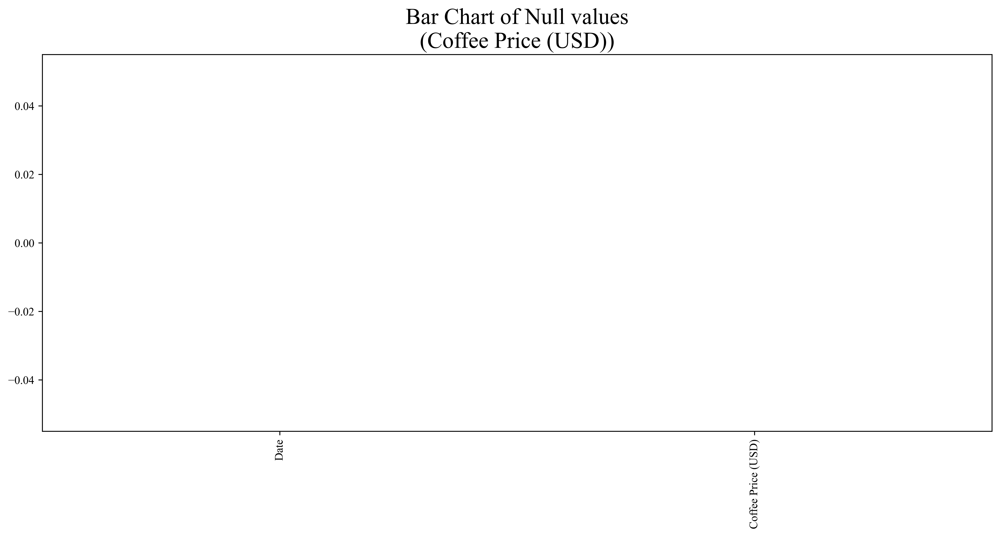

In [12]:
# Check for any null values in cfp_df. 
#Input for null_barchart func.  
df = cfp_df
category = 'Coffee Price (USD)'

# Run null_barchart func. 
myfcf_cle.null_barchart(df, category) 

In [13]:
# Print the number of null values within the columns of cfp_df.
# Input for print_null_col func.  
df = cfp_df

# Run print_null_col func. 
myfcf_cle.print_null_col(df)

Column              No. of Null Values
Date                  0
Coffee Price (USD)    0
dtype: int64


#### Coffee Quality

##### Overview

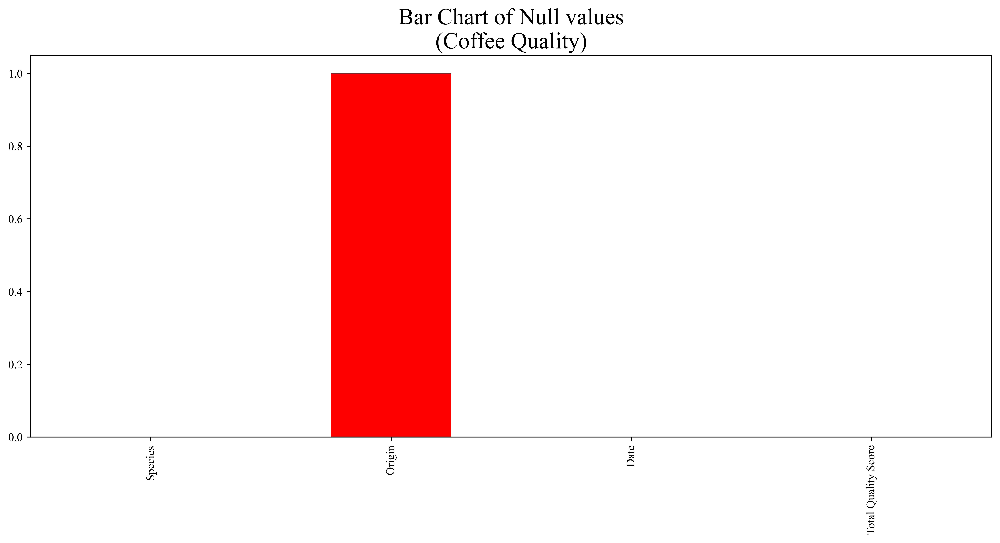

In [14]:
# Check for any null values in cfq_df. 
#Input for null_barchart func.  
df = cfq_df
category = 'Coffee Quality'

# Run null_barchart func. 
myfcf_cle.null_barchart(df, category) 

In [15]:
# Print the number of null values within the columns of cfq_df.
# Input for print_null_col func. 
df = cfq_df

# Run print_null_col func. 
myfcf_cle.print_null_col(df)

Column              No. of Null Values
Species                0
Origin                 1
Date                   0
Total Quality Score    0
dtype: int64


In [16]:
# Missingno of non-null and null values of bitcoin_tweets_df. 
# Inputs for null_msno func. 
df = cfq_df 
title_size = 30 

# Run null_msno func. 
myfcf_cle.null_msno(df, title_size)

##### Remove null values

In [17]:
# Remove null values for column 'user_name'.
# Inputs for remove_null_row func. 
df = cfq_df
col = 'Origin'

# Run remove_null_row func. 
myfcf_cle.remove_null_row(df, col)

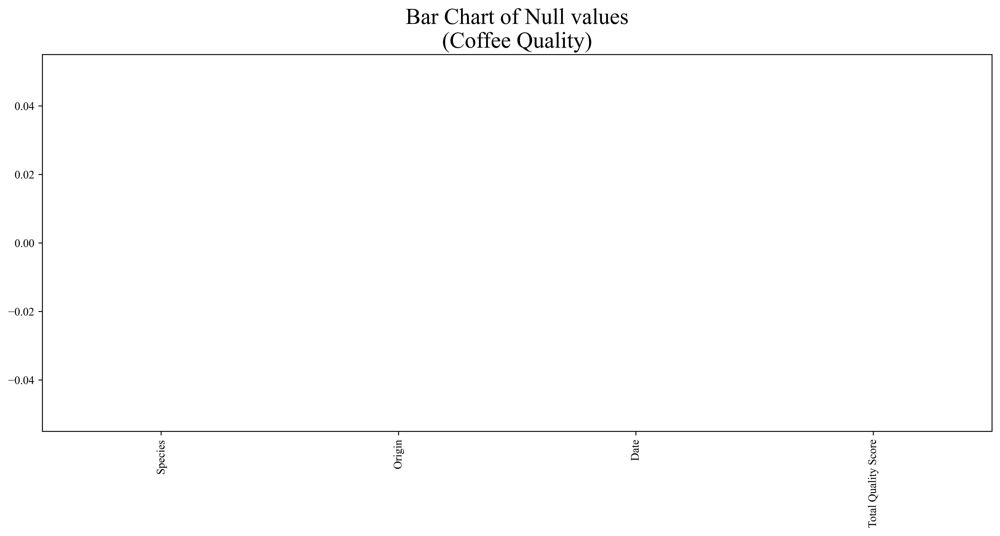

In [18]:
# Check for any null values in cfq_df. 
#Input for null_barchart func.  
df = cfq_df
category = 'Coffee Quality'

# Display null_barchart func. 
myfcf_cle.null_barchart(df, category) 

## Data Wrangling

### cfq_df

In [19]:
# Create column 'Grade' basing on column 'Quality Score'.
cfq_df = cfq_df.assign(Grade=pd.cut(cfq_df['Total Quality Score'], 
                                    bins=[-1, 80, 85, 90, 100], 
                                    labels=['Below Speciality',
                                            'Very Good',
                                            'Excellent',
                                            'Outstanding']))

# Rename column.
cfq_df.rename(columns={'Grade': 'Total Quality Score Classification'}, inplace=True)

# Display head of cfq_df. 
cfq_df.head() 

,Species,Origin,Date,Total Quality Score,Total Quality Score Classification
1164,Arabica,Thailand,2010-04-09,79.67,Below Speciality
1261,Arabica,Mexico,2010-04-09,76.75,Below Speciality
1191,Arabica,Mexico,2010-04-09,79.17,Below Speciality
558,Arabica,Thailand,2010-04-13,82.92,Very Good
532,Arabica,Thailand,2010-04-13,83.00,Very Good


### ori_gra_cfq_df

In [20]:
# Create a dataframe with by grouping grade and origin.  
ori_gra_cfq_df = cfq_df[['Total Quality Score Classification', 'Origin']]
ori_gra_cfq_df = ori_gra_cfq_df.groupby('Total Quality Score Classification').agg('count')

# Display ori_gra_cfq_df. 
ori_gra_cfq_df

,Origin
Total Quality Score Classification,
Below Speciality,194
Very Good,1048
Excellent,95
Outstanding,1


### cfpq_df

In [21]:
# Merge dataframes cfq_df and cfp_df into cfpq_df. 
cfpq_df = cfq_df.merge(cfp_df, on='Date', how='left') 

# Display head of cfpq_df.
cfpq_df.head()

,Species,Origin,Date,Total Quality Score,Total Quality Score Classification,Coffee Price (USD)
0,Arabica,Thailand,2010-04-09,79.67,Below Speciality,NaN
1,Arabica,Mexico,2010-04-09,76.75,Below Speciality,NaN
2,Arabica,Mexico,2010-04-09,79.17,Below Speciality,NaN
3,Arabica,Thailand,2010-04-13,82.92,Very Good,1.322
4,Arabica,Thailand,2010-04-13,83.00,Very Good,1.322


### cfpq_a30_df

In [22]:
# Filter for non-null values of column 'Coffee Price (USD)' of cfpq_df. 
# Identify null values in column 'Coffee Price (USD)' of cfpq_df. 
is_null = cfpq_df.isna()

# Filter for non-null values of column 'Coffee Price (USD)' of cfpq_df. 
cfpq_df = cfpq_df[is_null['Coffee Price (USD)'] == False]

In [23]:
# Filter for arabica coffee.
cfpq_df = cfpq_df[cfpq_df['Species'] == 'Arabica']  

In [24]:
# Identify countries with more than 30 data points except for ethopia. 
# Input for ctry_a30_lt func. 
df = cfpq_df

# Run ctry_a30_lt func. 
ctry_a30_lt = myfcf_wra.ctry_a30_lt(df) 

# Remove ethopia from the list, because there is not much coffee future contracts done in ethopia. 
ctry_a30_lt = [i for i in ctry_a30_lt if i != 'Ethiopia'] 

In [25]:
# Create a dataframe with countries with more than 30 data points except for ethopia. 
# Input for ctry_a30_df func. 
df = cfpq_df

# Run ctry_a30_df func. 
cfpq_a30_df = myfcf_wra.ctry_a30_df(df, ctry_a30_lt)

# Display head of cfpq_a30_df.
cfpq_a30_df.head()

,Species,Origin,Date,Total Quality Score,Total Quality Score Classification,Coffee Price (USD)
0,Arabica,Guatemala,2010-04-30,84.33,Very Good,1.3528
1,Arabica,United States (Hawaii),2010-05-17,85.08,Excellent,1.3255
2,Arabica,United States (Hawaii),2010-05-24,81.83,Very Good,1.3225
3,Arabica,United States (Hawaii),2010-05-24,81.42,Very Good,1.3225
4,Arabica,Mexico,2010-05-26,83.38,Very Good,1.3370


In [26]:
# Add column 'Year' into cfpq_a30_df. 
# Inputs for yr_lt func.
df = cfpq_a30_df
col = 'Date'

# Run yr_lt func.
cfpq_a30_df['Year'] = myfcf_wra.yr_lt(df, col)

# Display head of cfpq_a30_df.
cfpq_a30_df.head()

,Species,Origin,Date,Total Quality Score,Total Quality Score Classification,Coffee Price (USD),Year
0,Arabica,Guatemala,2010-04-30,84.33,Very Good,1.3528,2010
1,Arabica,United States (Hawaii),2010-05-17,85.08,Excellent,1.3255,2010
2,Arabica,United States (Hawaii),2010-05-24,81.83,Very Good,1.3225,2010
3,Arabica,United States (Hawaii),2010-05-24,81.42,Very Good,1.3225,2010
4,Arabica,Mexico,2010-05-26,83.38,Very Good,1.3370,2010


In [27]:
# Identify countries that have >= 30 data points except for ethopia. 
# Input for ctry_a30_lt func. 
df = cfpq_a30_df

# Run ctry_a30_lt func. 
ctry_a30_lt = myfcf_wra.ctry_a30_lt(df)

# Run print_ctry_a30 func. 
myfcf_wra.print_ctry_a30(ctry_a30_lt)

Countries that have >= 30 data points excluding Ethopia:
Brazil
Colombia
Costa Rica
Guatemala
Honduras
Mexico
Taiwan
Tanzania, United Republic Of
United States (Hawaii)


In [28]:
# Change format to obj.
cfpq_a30_df['Origin'] = cfpq_a30_df['Origin'].astype('str')

# Filter countries based on >= 30 data points except for ethopia. 
cfpq_a30_df = cfpq_a30_df[(cfpq_a30_df['Origin'] == 'Brazil') | 
                          (cfpq_a30_df['Origin'] == 'Colombia') |
                          (cfpq_a30_df['Origin'] == 'Costa Rica') |
                          (cfpq_a30_df['Origin'] == 'Guatemala') |
                          (cfpq_a30_df['Origin'] == 'Honduras') |
                          (cfpq_a30_df['Origin'] == 'Mexico') |
                          (cfpq_a30_df['Origin'] == 'Taiwan') |
                          (cfpq_a30_df['Origin'] == 'Tanzania, United Republic Of') |
                          (cfpq_a30_df['Origin'] == 'United States (Hawaii)')]

# Change format back to category.
cfpq_a30_df['Origin'] = cfpq_a30_df['Origin'].astype('category')

In [29]:
# Find the start and end dates of the cfpq_a30_df. 
# Inputs for start_end_dates_tp func. 
df = cfpq_a30_df 

# Run start_end_dates_tp func. 
start_date, end_date = myfcf_wra.start_end_dates_tp(df)

# Print start and end dates of cfq_df. 
print('Start Date: ' + start_date)
print('End Date: ' + end_date)  

Start Date: 2010-04-30
End Date: 2018-01-19


#### Identify extreme outliers

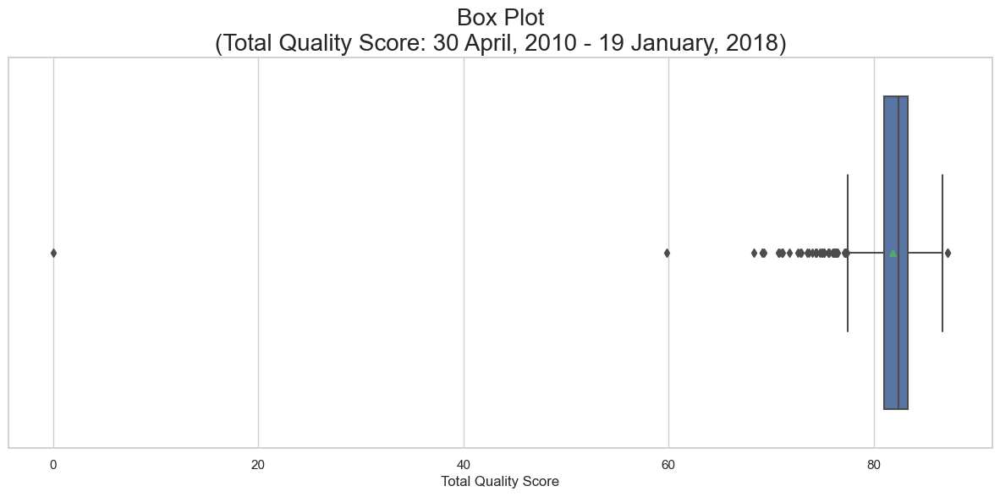

In [30]:
# Create a boxplot for total quality score before dropping outliers.
# Inputs for h_boxplot func. 
df = cfpq_a30_df
col = 'Total Quality Score'

# Run h_boxplot func. 
myfcf_sta.h_boxplot(df, col, start_date, end_date)

#### Remove extreme outliers

In [31]:
# Create a  tuple of inliner index, outlier index, number of inliners, and number of outliers. 
# Inputs for thold_inliner_outlier_tp func.
df = cfpq_a30_df
col = 'Total Quality Score'
thold = 3 # 3 means 3 standard deviations 

# Run thold_inliner_outlier_tp func.
in_ind, out_ind, in_no, out_no = myfcf_wra.thold_inliner_outlier_tp(df, col, thold)

In [32]:
# Drop rows of extreme outliers. 
cfpq_a30_df = cfpq_a30_df.drop(index=out_ind[0])

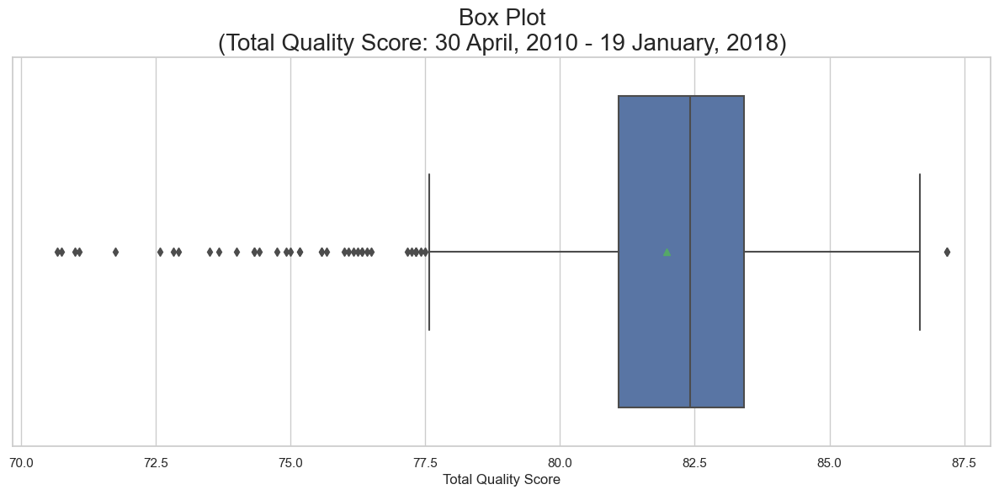

In [33]:
# Create a boxplot for total quality score after dropping outliers.
# Inputs for h_boxplot func. 
df = cfpq_a30_df
col = 'Total Quality Score'

# Run h_boxplot func. 
myfcf_sta.h_boxplot(df, col, start_date, end_date)

### cfpq_a30_mt_df

In [34]:
# Perform melt function and sort based on 'Origin' on cfpq_a30_mt_df.
cfpq_a30_mt_df = pd.melt(cfpq_a30_df, id_vars=['Origin'], value_vars=['Total Quality Score']).sort_values(by='Origin', ascending=True)

# Display head of cfpq_a30_mt_df. 
cfpq_a30_mt_df.head()

,Origin,variable,value
659,Brazil,Total Quality Score,82.42
663,Brazil,Total Quality Score,82.33
664,Brazil,Total Quality Score,81.25
665,Brazil,Total Quality Score,82.25
666,Brazil,Total Quality Score,83.33


### bra_df, co_df, cr_df, gt_df, hond_df, mx_df, tw_df, urt_df, hi_df

In [35]:
# Create dataframe for brazil. 
bra_df = cfpq_a30_df[cfpq_a30_df['Origin'] == 'Brazil']

# Create dataframe for colombia. 
co_df = cfpq_a30_df[cfpq_a30_df['Origin'] == 'Colombia']

# Create dataframe for costa rica. 
cr_df = cfpq_a30_df[cfpq_a30_df['Origin'] == 'Costa Rica']

# Create dataframe for guatemala. 
gt_df = cfpq_a30_df[cfpq_a30_df['Origin'] == 'Guatemala']

# Create dataframe for honduras. 
hond_df = cfpq_a30_df[cfpq_a30_df['Origin'] == 'Honduras']

# Create dataframe for mexico. 
mx_df = cfpq_a30_df[cfpq_a30_df['Origin'] == 'Mexico']

# Create dataframe for taiwan. 
tw_df = cfpq_a30_df[cfpq_a30_df['Origin'] == 'Taiwan']

# Create dataframe for tanzania, united republic of. 
urt_df = cfpq_a30_df[cfpq_a30_df['Origin'] == 'Tanzania, United Republic Of']

# Create dataframe for united states (hawaii). 
hi_df = cfpq_a30_df[cfpq_a30_df['Origin'] == 'United States (Hawaii)'] 

### out_df, exc_df, vg_df, bs_df

In [36]:
# Create dataframe for outstanding.
out_df = cfpq_a30_df[cfpq_a30_df['Total Quality Score Classification'] == 'Outstanding']

# Create dataframe for excellent.
exc_df = cfpq_a30_df[cfpq_a30_df['Total Quality Score Classification'] == 'Excellent'] 

# Create dataframe for very good.
vg_df = cfpq_a30_df[cfpq_a30_df['Total Quality Score Classification'] == 'Very Good'] 

# Create dataframe for below speciality.
bs_df = cfpq_a30_df[cfpq_a30_df['Total Quality Score Classification'] == 'Below Speciality'] 

## Descriptive Statistics

In [37]:
# Descriptive statistics of coffee price.
cfp_df.describe()

,Coffee Price (USD)
count,12075.000000
mean,1.261351
std,0.474009
min,0.425000
25%,0.945250
50%,1.234500
75%,1.464000
max,3.356300


In [38]:
# Descriptive statistics of total quality score. 
cfpq_a30_df[['Total Quality Score']].describe()

,Total Quality Score
count,857.000000
mean,81.978075
std,2.281264
min,70.670000
25%,81.080000
50%,82.420000
75%,83.420000
max,87.170000


# Break Start

## EDA

### Coffee Price

In [39]:
# Find the start and end dates of the cfp_df. 
# Inputs for start_end_dates_tp func. 
df = cfp_df

# Run start_end_dates_tp func. 
start_date, end_date = myfcf_wra.start_end_dates_tp(df)

# Print start and end dates of cfp_df. 
print('Start Date: ' + start_date)
print('End Date: ' + end_date) 

Start Date: 1973-08-20
End Date: 2021-10-13


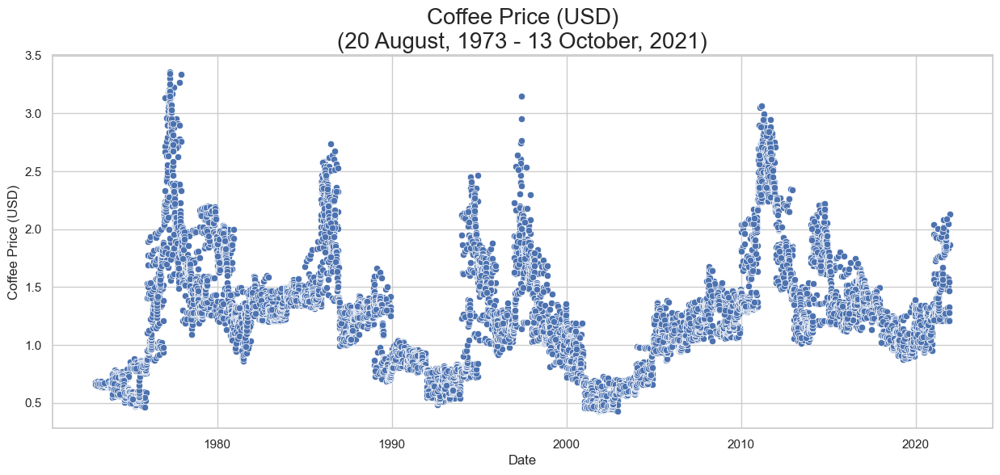

In [40]:
# Plot a scatterplot for coffee price. 
# Inputs for scatterplot func. 
df = cfp_df
x = 'Date'
y = 'Coffee Price (USD)' 

# Display scatterplot func. 
myfcf_gra.scatterplot(df, x, y, start_date, end_date)

### Coffee Quality

In [41]:
# Find the start and end dates of the cfq_df. 
# Inputs for start_end_dates_tp func. 
df = cfq_df

# Run start_end_dates_tp func. 
start_date, end_date = myfcf_wra.start_end_dates_tp(df)

# Print start and end dates of cfq_df. 
print('Start Date: ' + start_date)
print('End Date: ' + end_date)  

Start Date: 2010-04-09
End Date: 2018-01-19


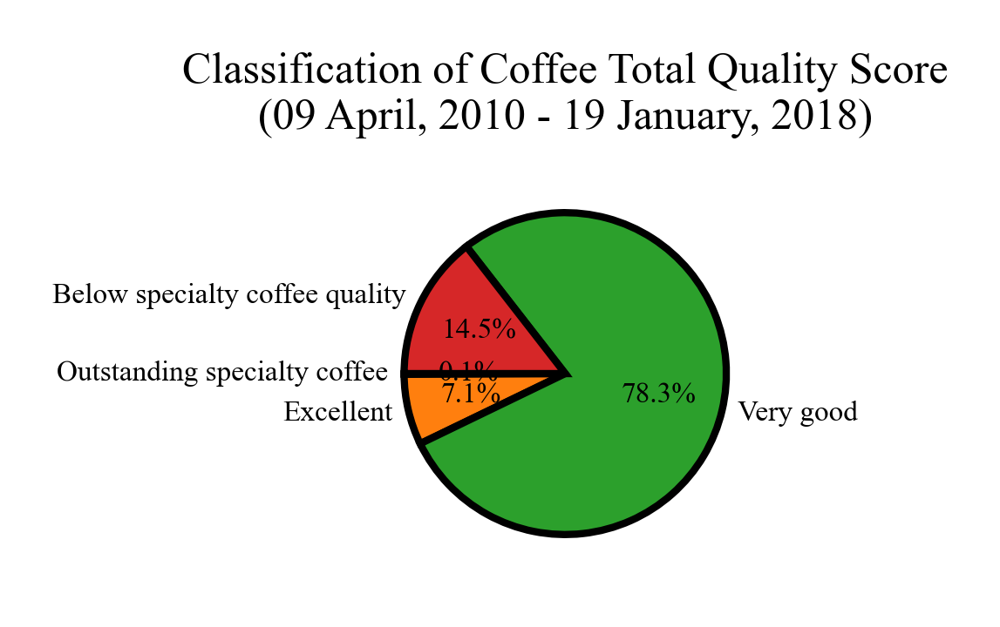

In [42]:
# Plot pie chart for coffee grade score. 
# Input for cfg_piechart.
df = ori_gra_cfq_df 

# Run cfg_piechart. 
myfcf_gra.cfg_piechart(df, start_date, end_date) 

Origin (Origin)


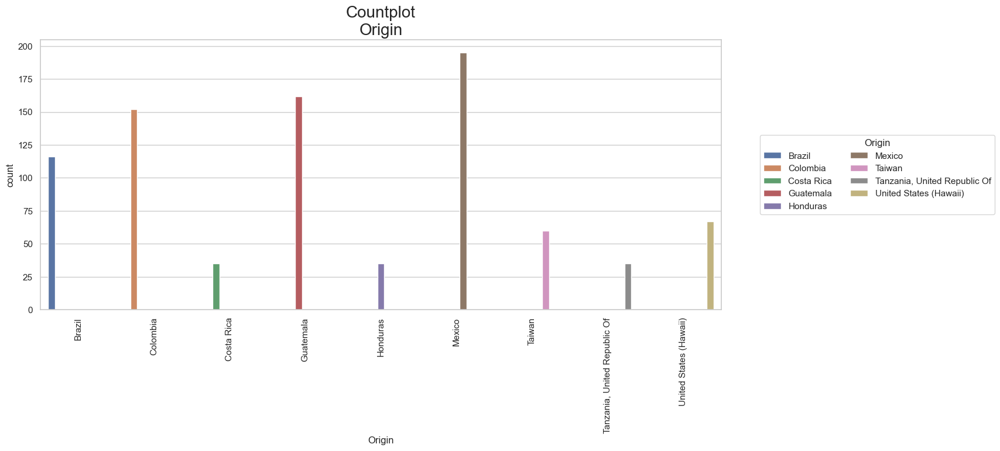

Origin (Year)


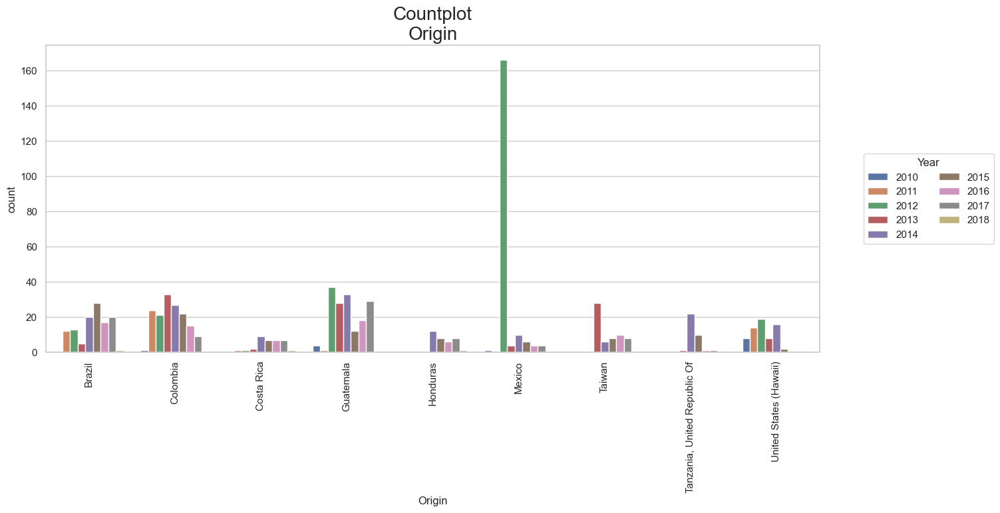

Origin (Total Quality Score Classification)


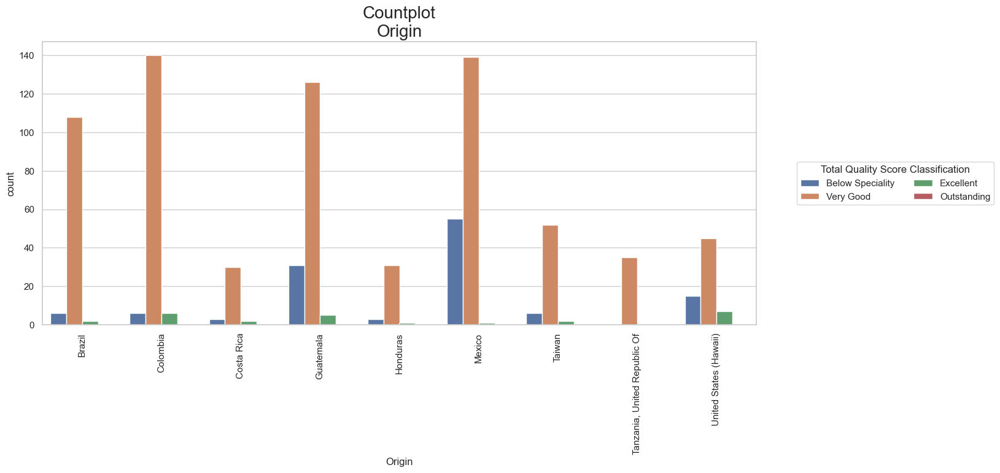

Year (Origin)


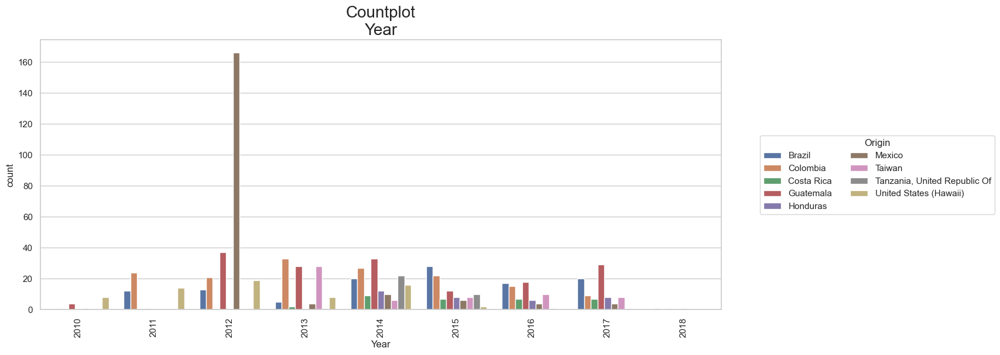

Year (Year)


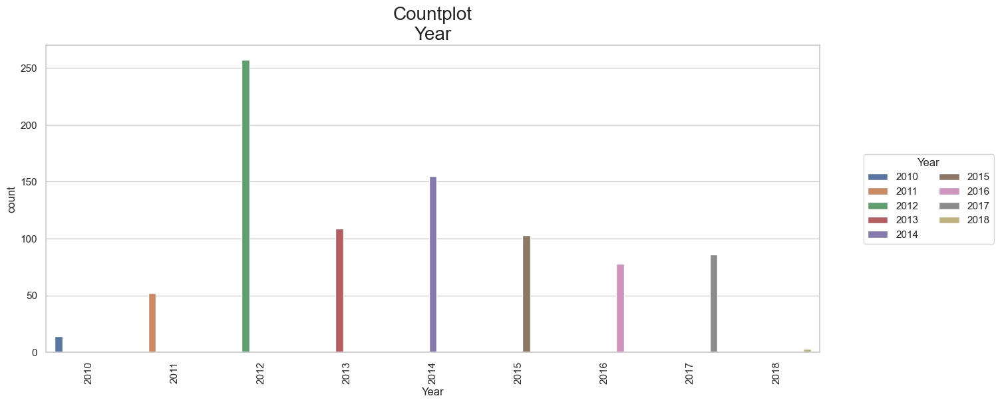

Year (Total Quality Score Classification)


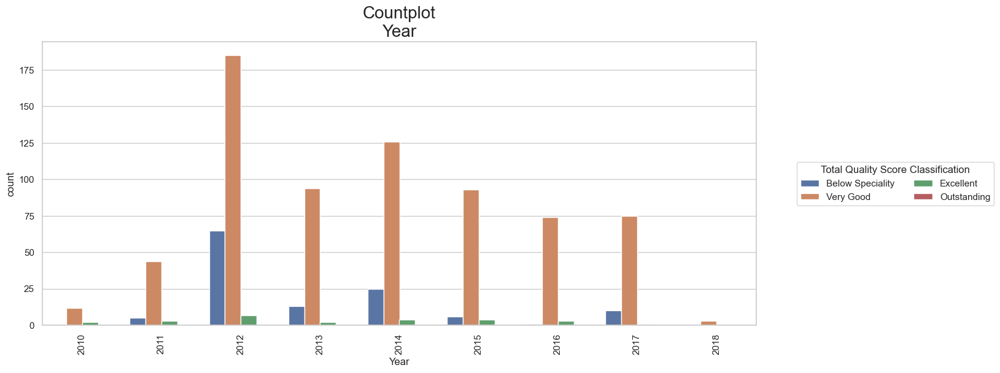

Total Quality Score Classification (Origin)


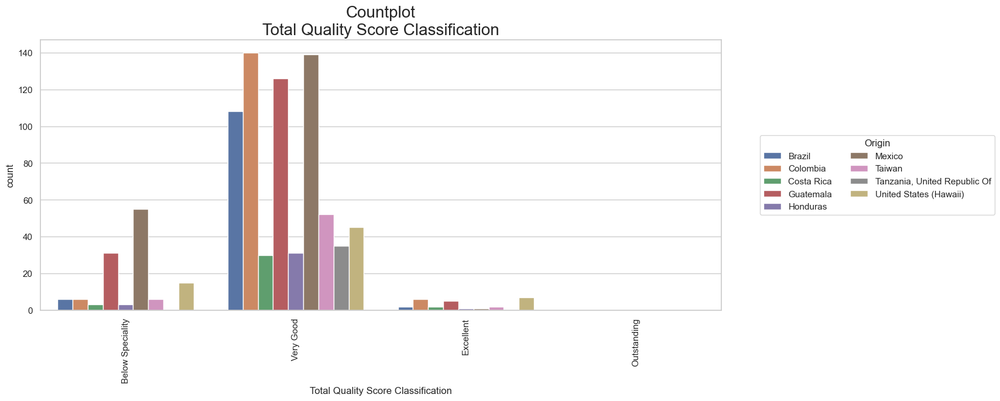

Total Quality Score Classification (Year)


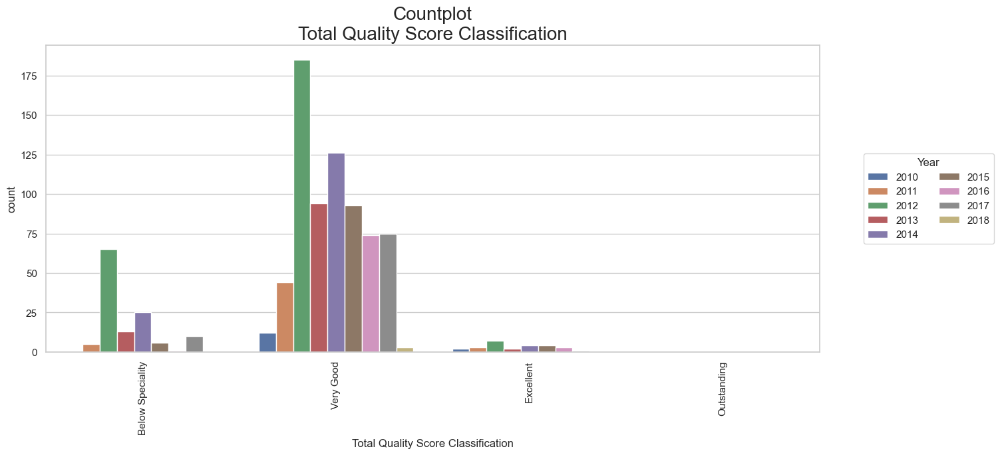

Total Quality Score Classification (Total Quality Score Classification)


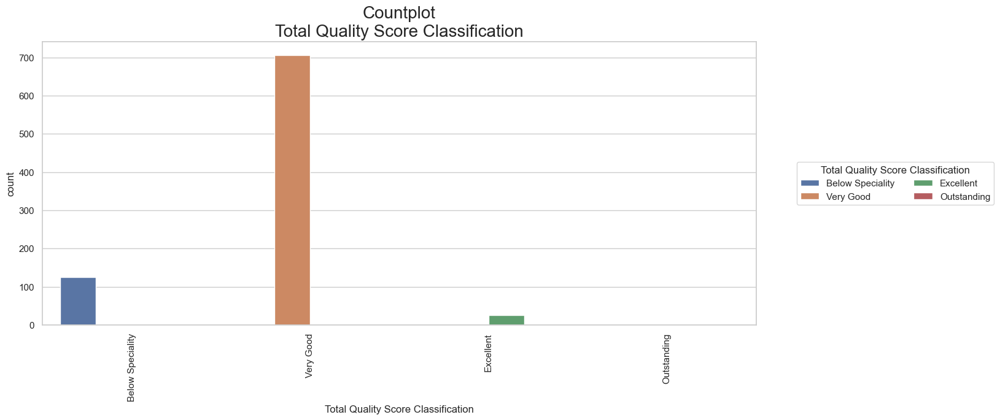

In [43]:
# Inputs for print_mult_countplot func. 
df = cfpq_a30_df
x_lt = ['Origin', 'Year', 'Total Quality Score Classification']  
hue_lt = ['Origin', 'Year', 'Total Quality Score Classification']

# Run print_mult_countplot func. 
myfcf_gra.print_mult_countplot(df, x_lt, hue_lt)

Total Quality Score VS Origin (Origin)


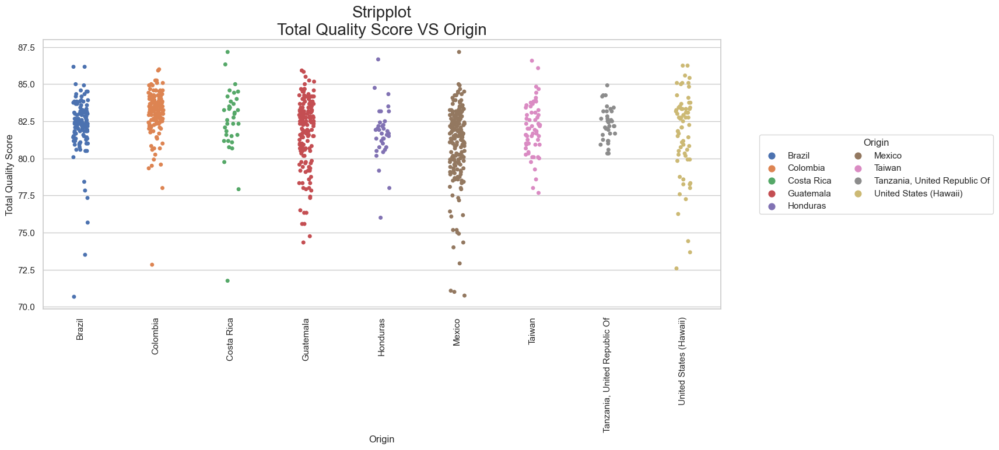

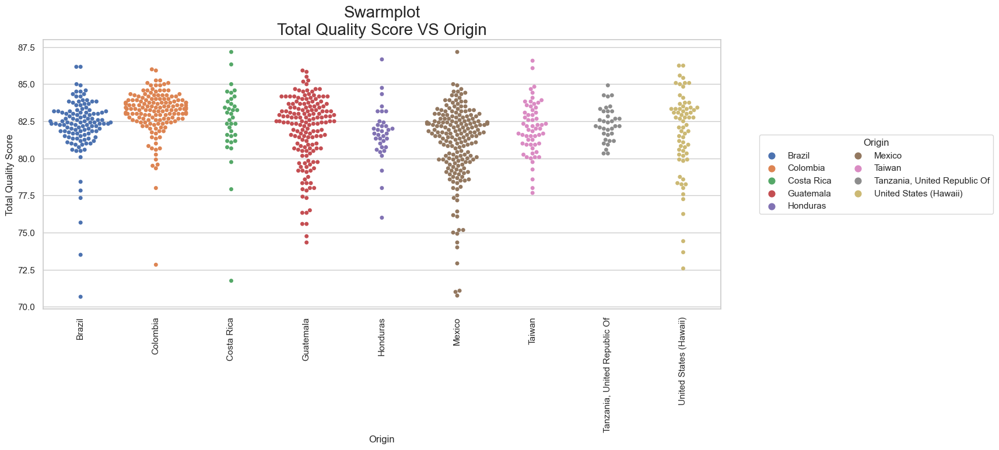

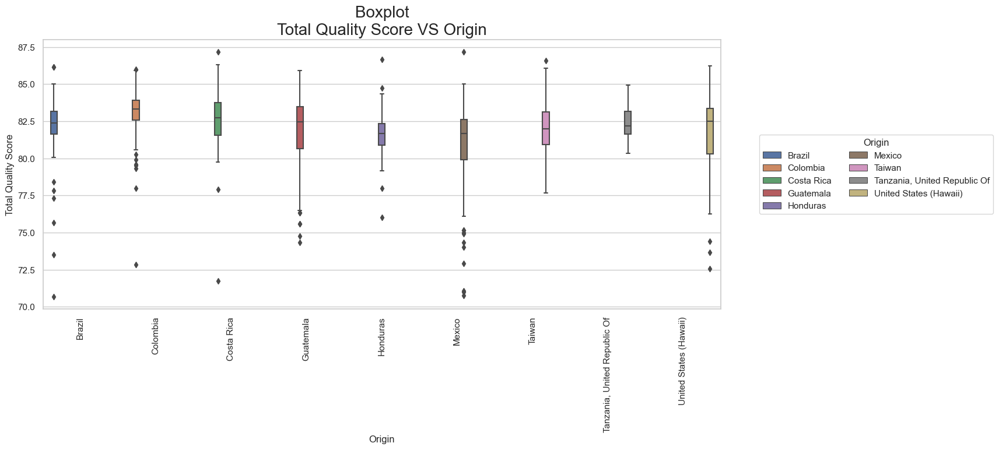

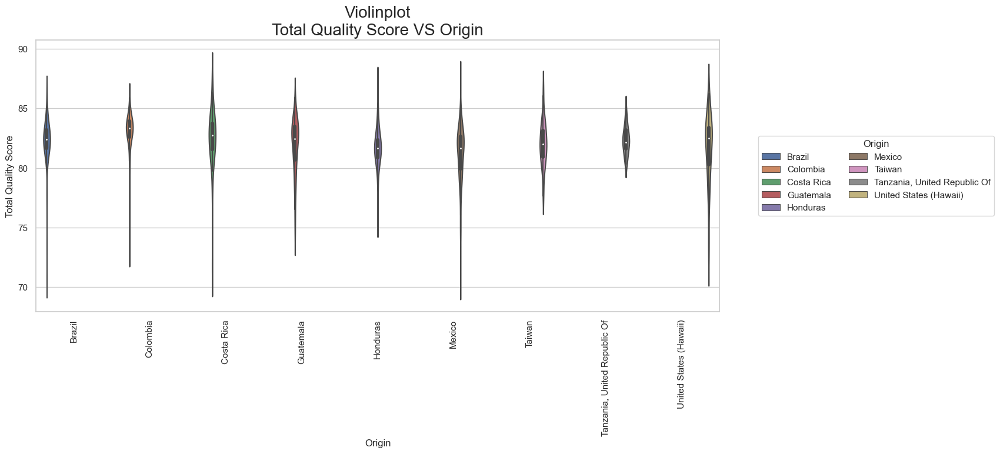

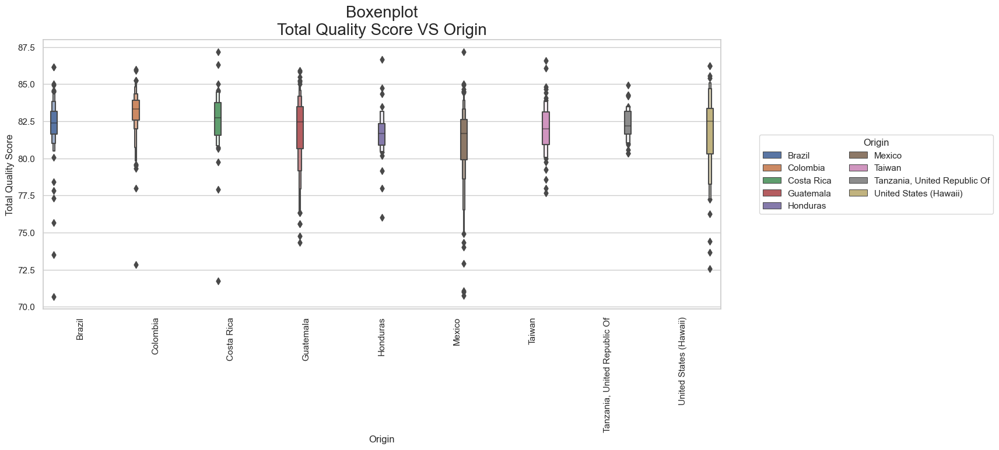

Total Quality Score VS Origin (Year)


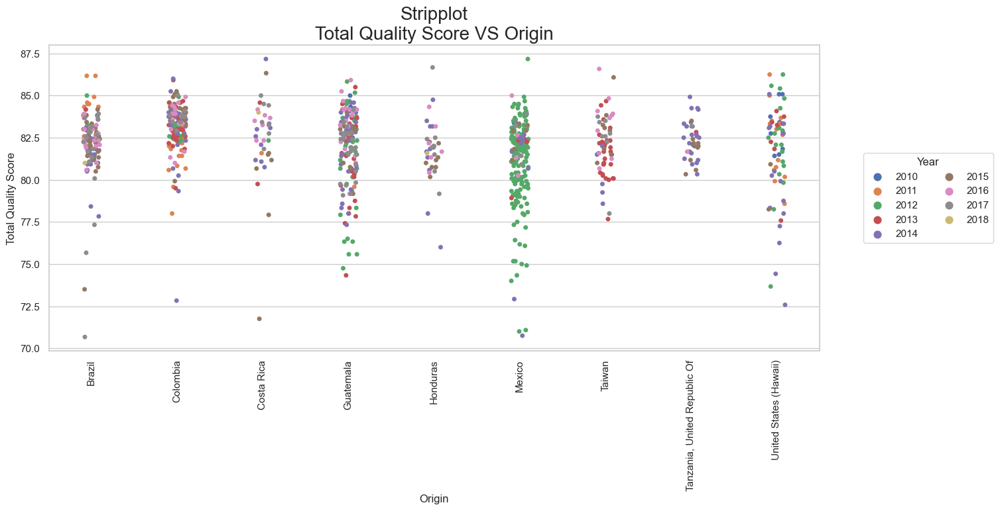

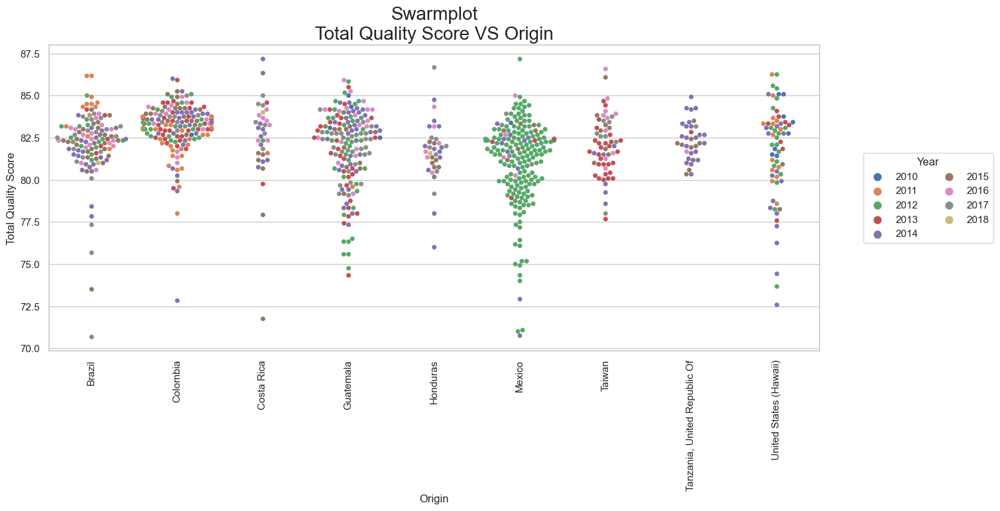

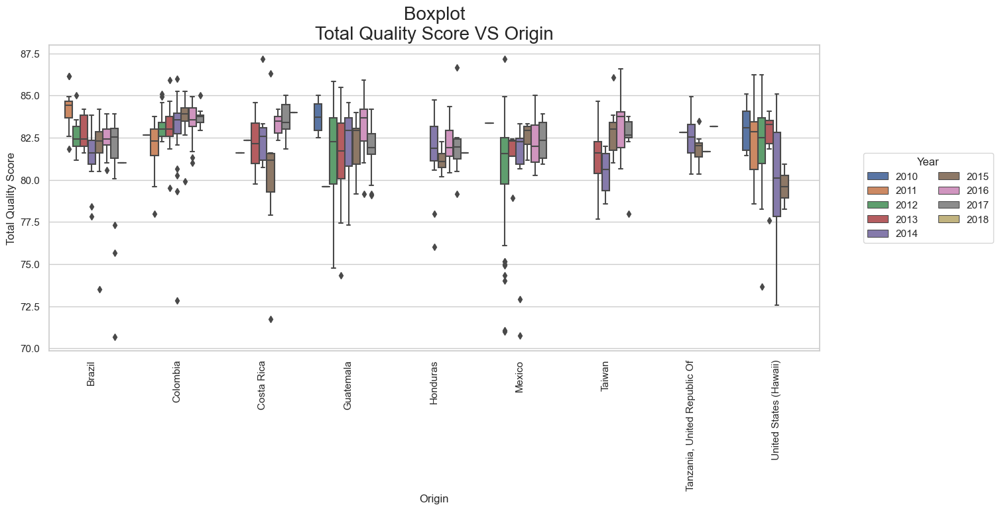

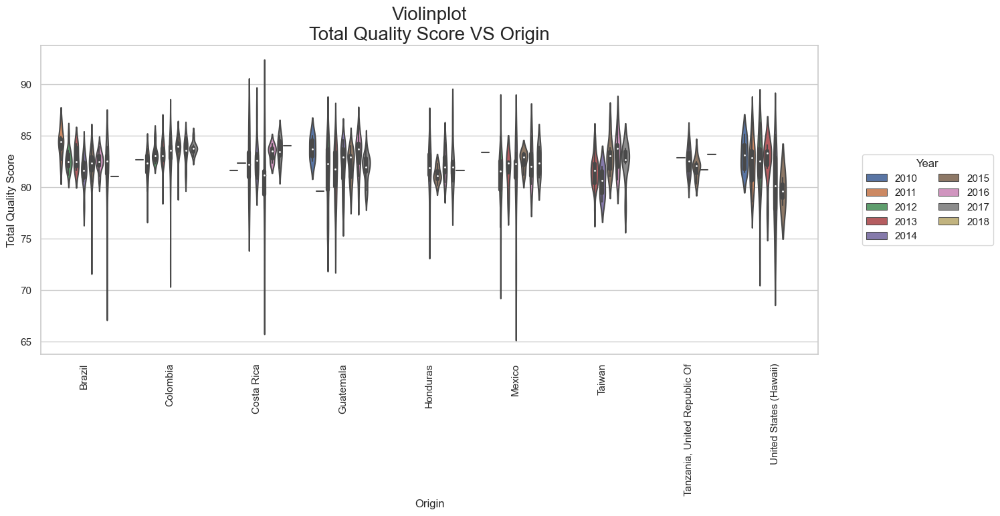

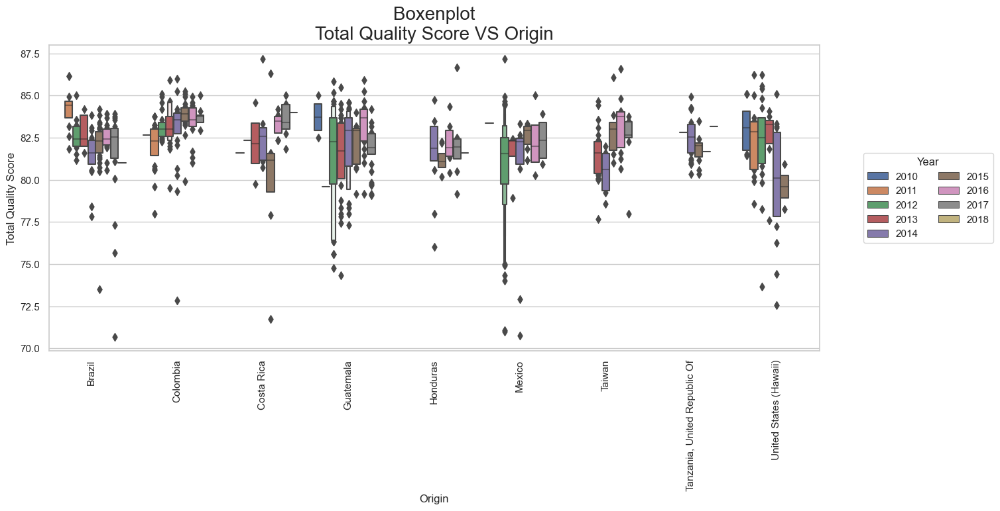

Total Quality Score VS Origin (Total Quality Score Classification)


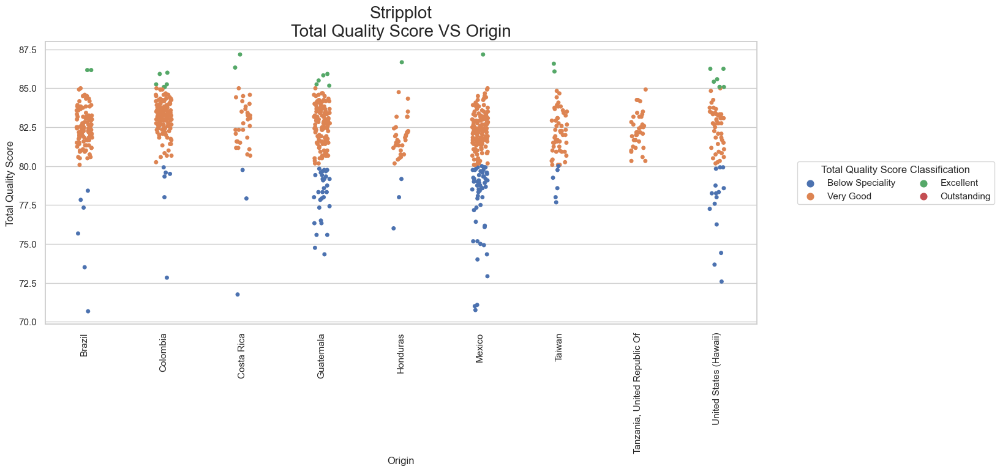

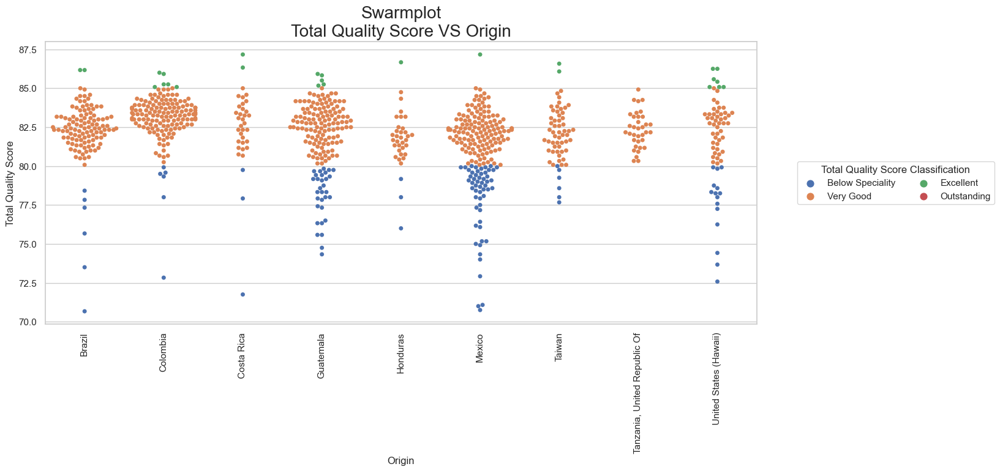

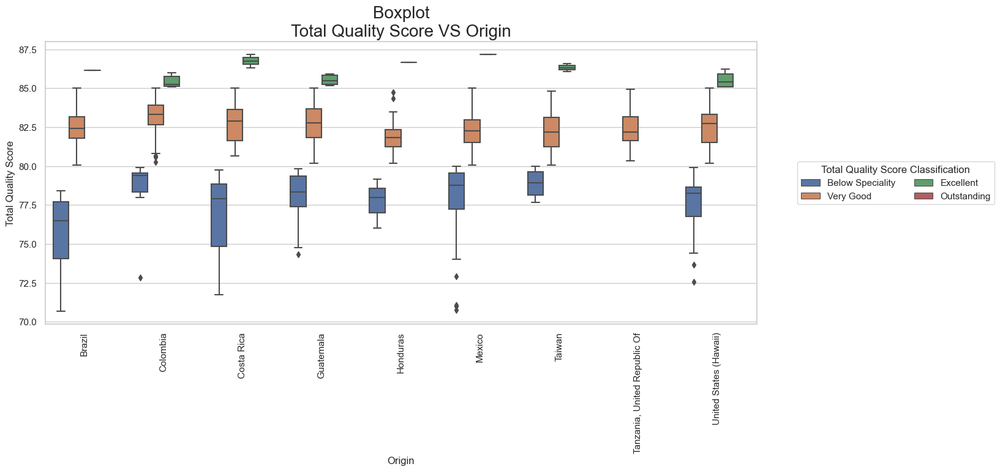

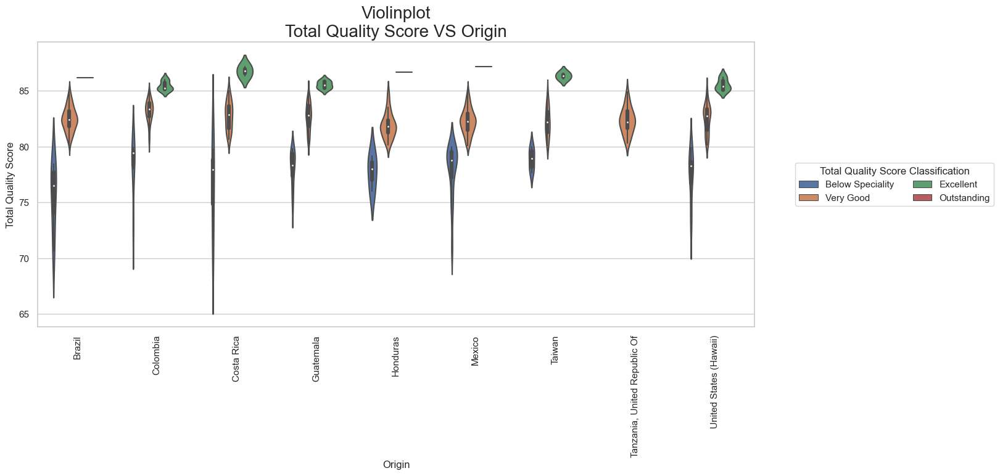

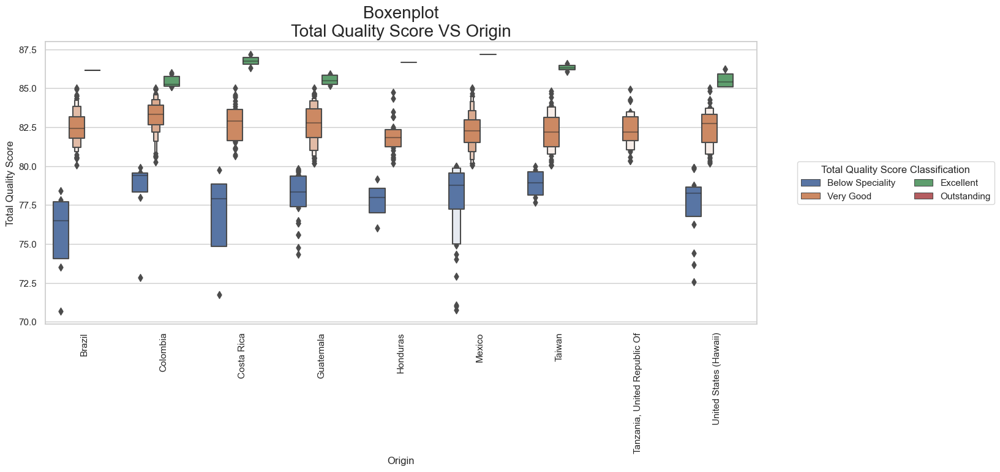

Total Quality Score VS Year (Origin)


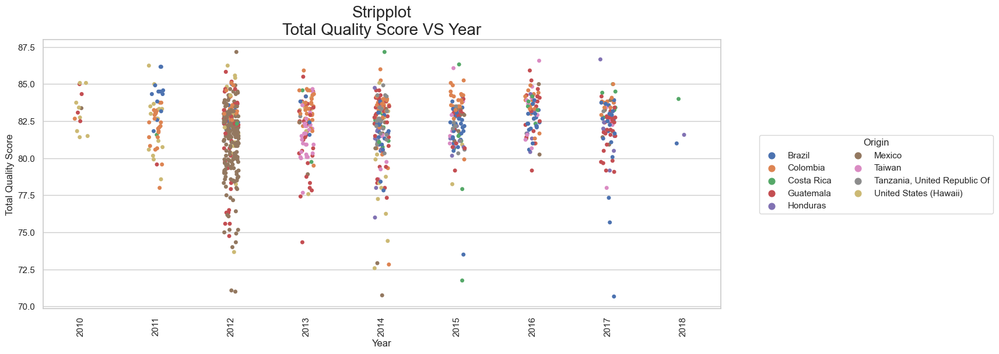

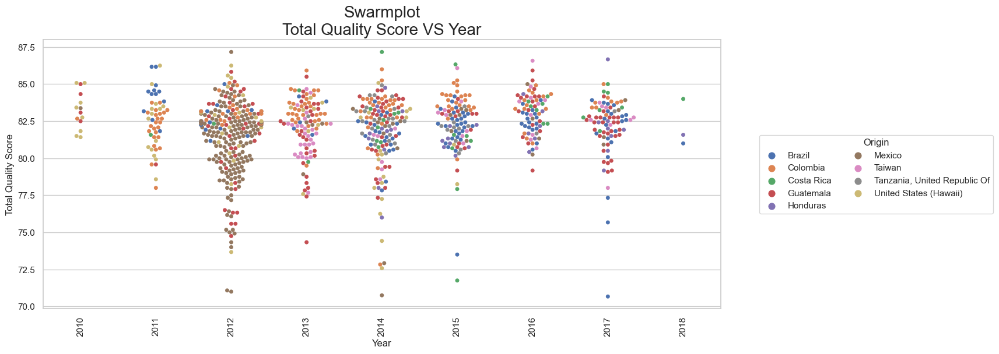

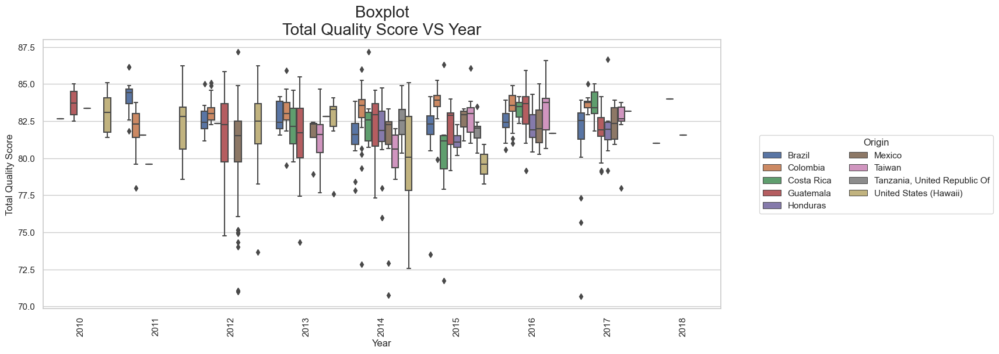

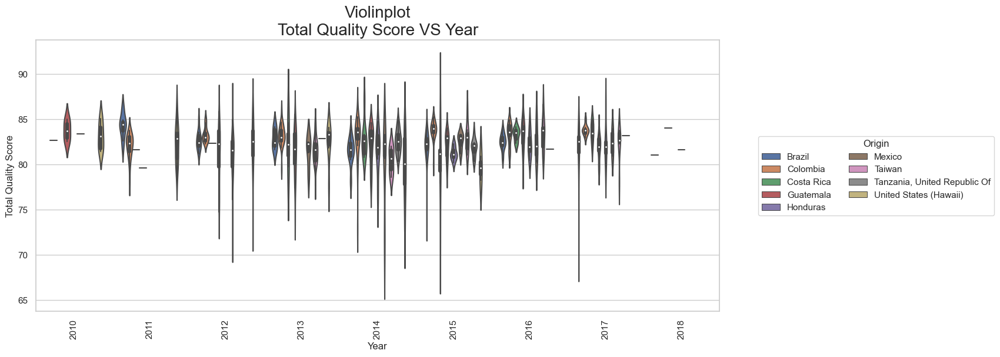

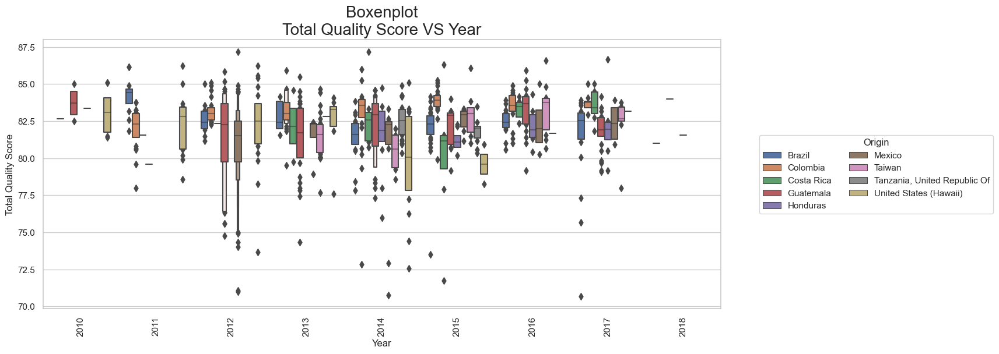

Total Quality Score VS Year (Year)


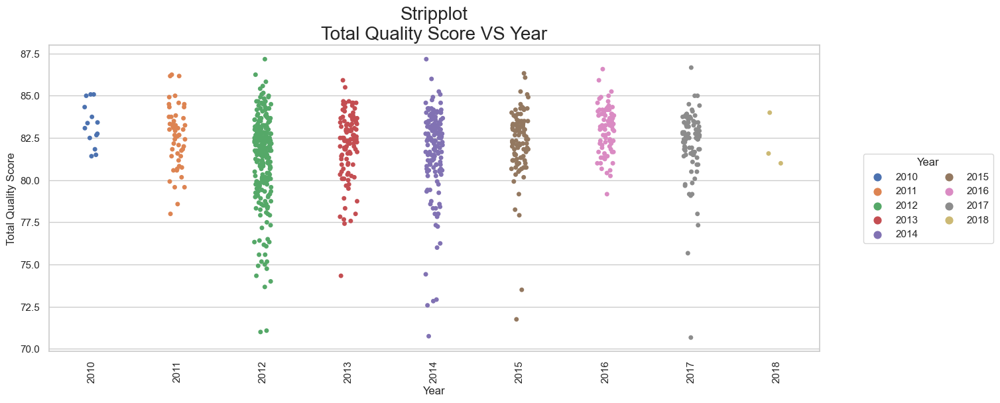

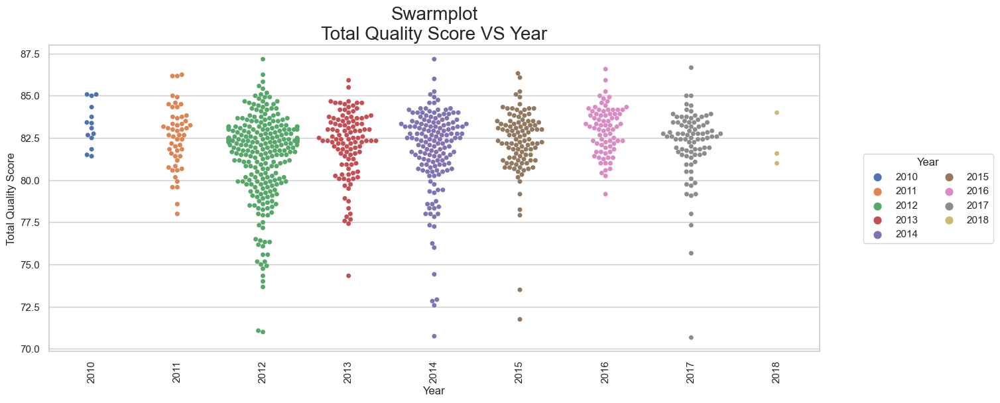

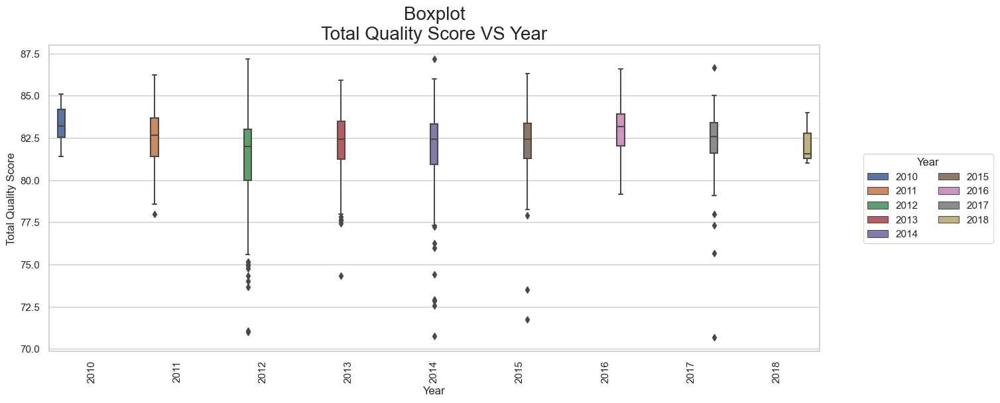

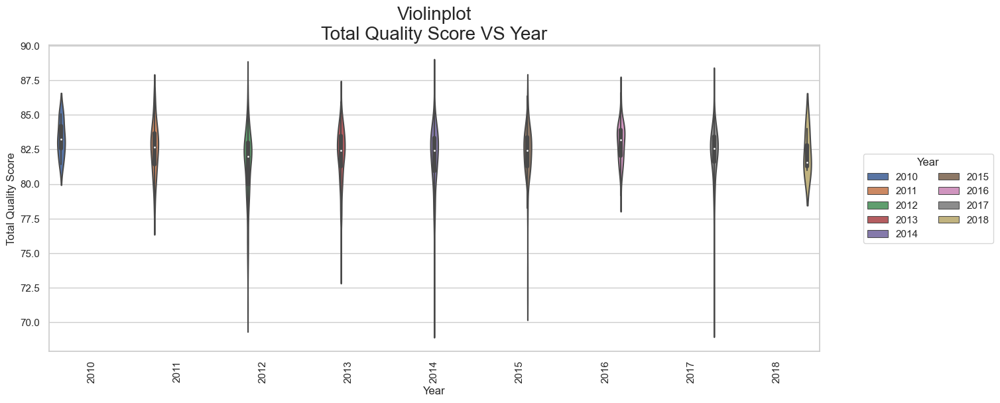

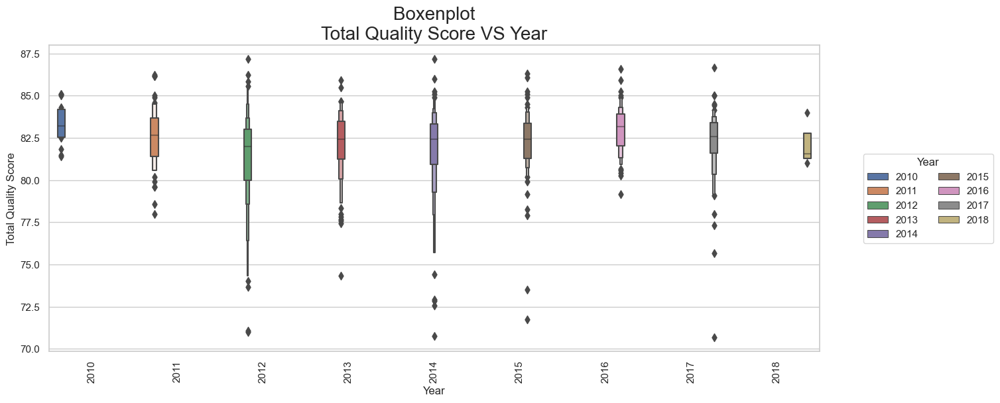

Total Quality Score VS Year (Total Quality Score Classification)


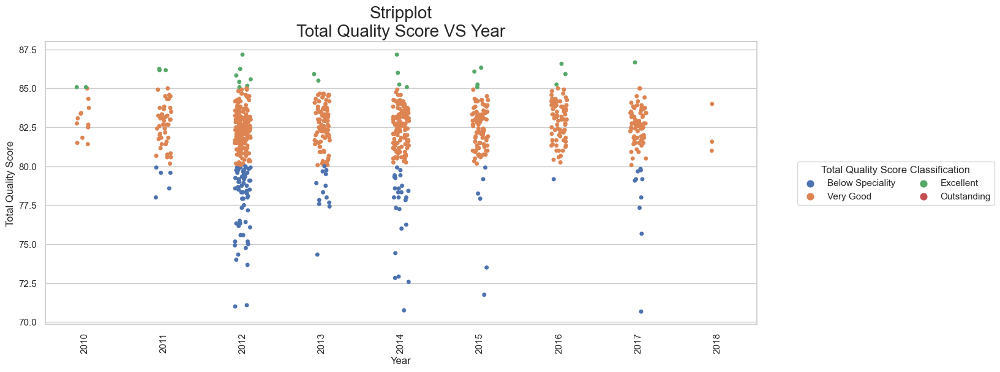

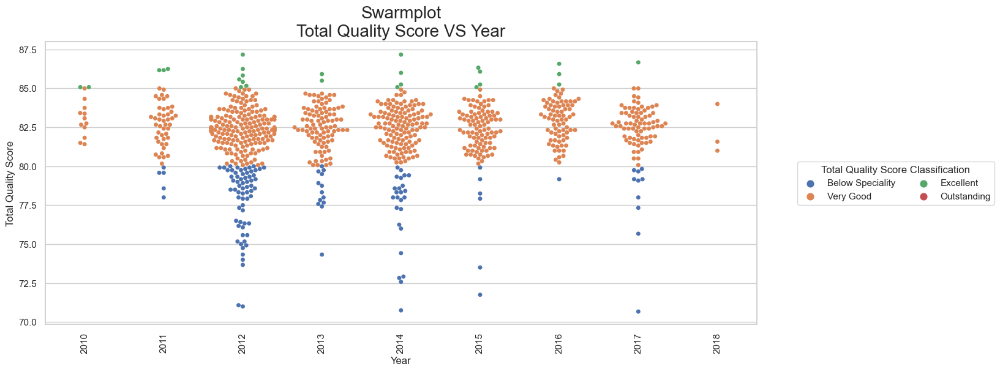

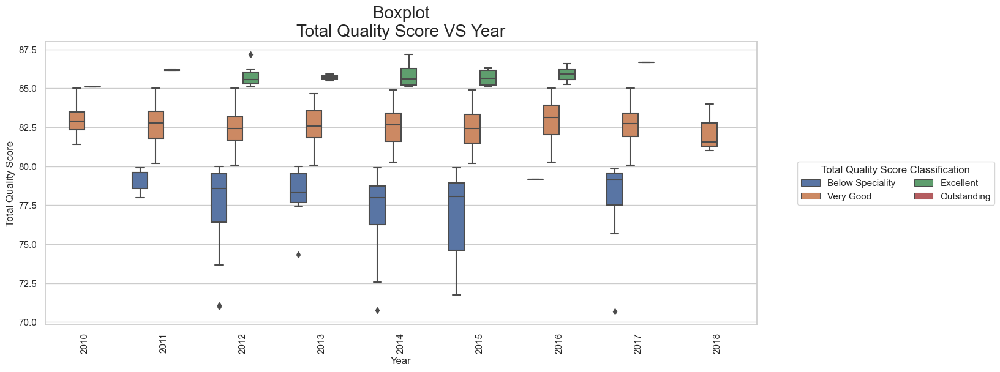

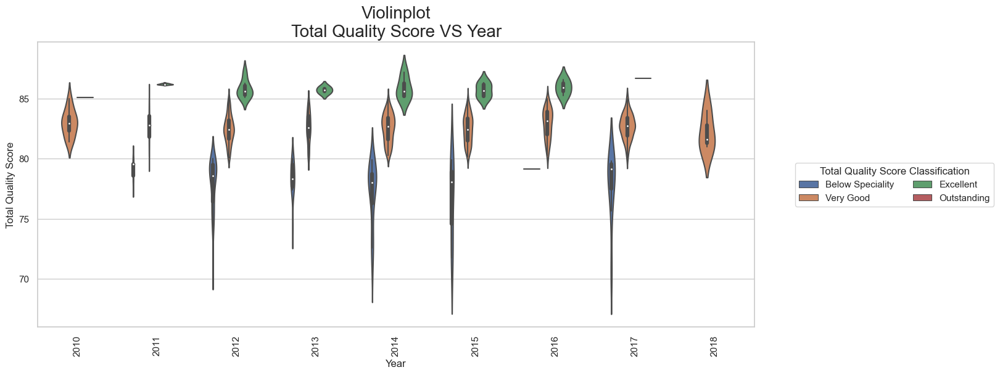

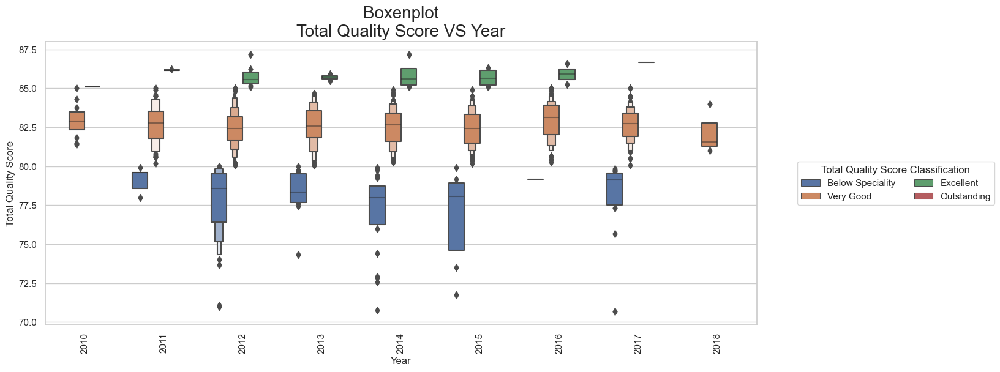

Total Quality Score VS Total Quality Score Classification (Origin)


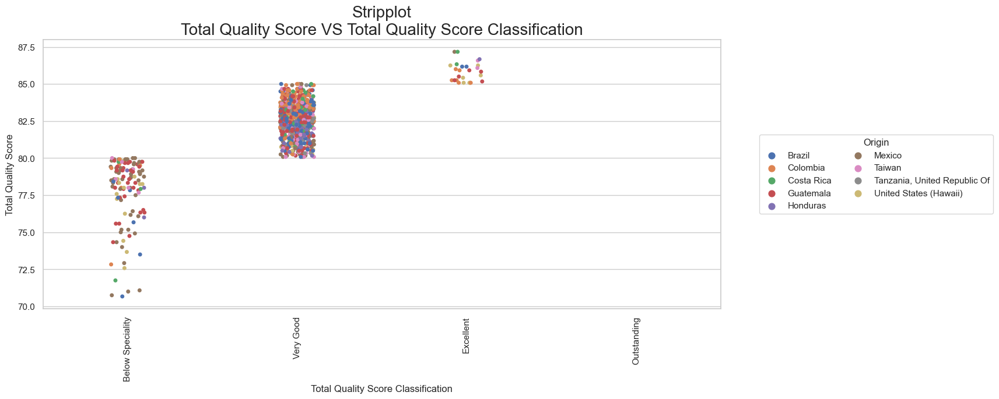

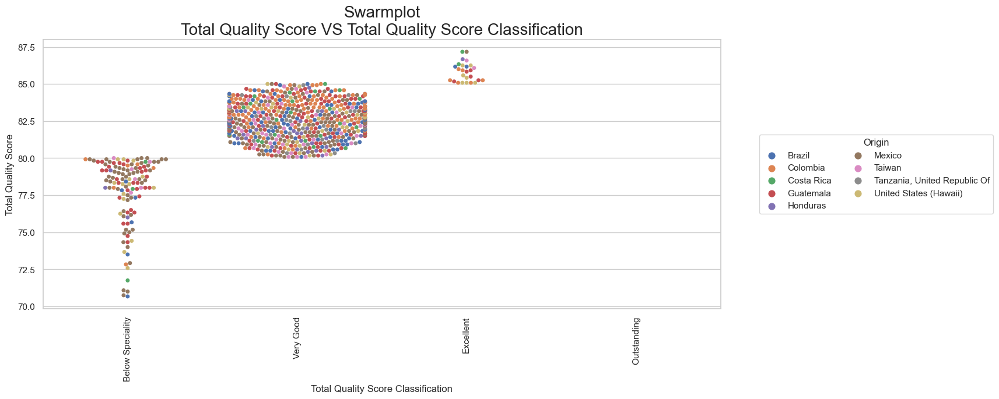

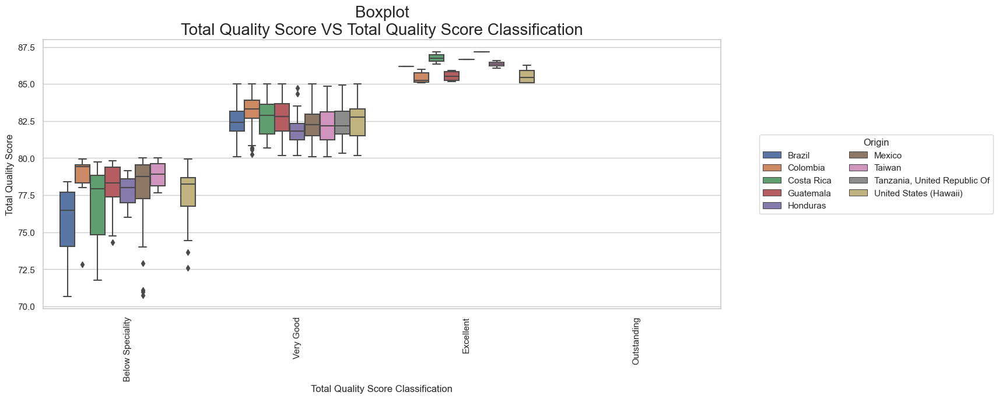

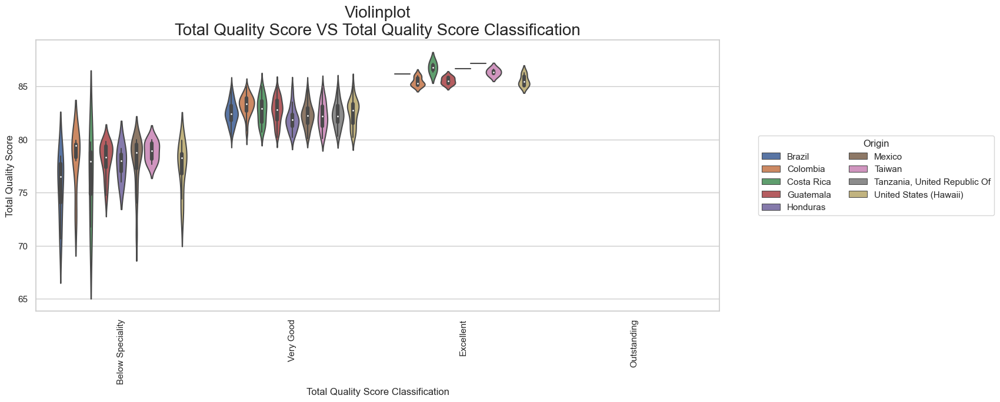

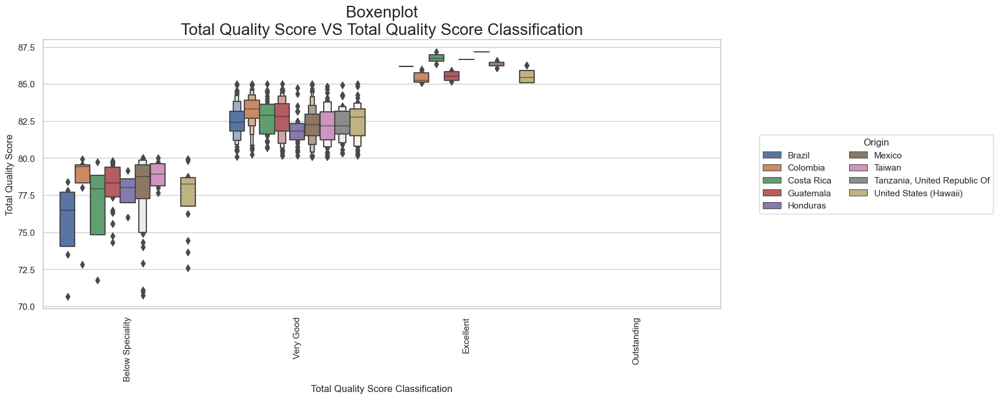

Total Quality Score VS Total Quality Score Classification (Year)


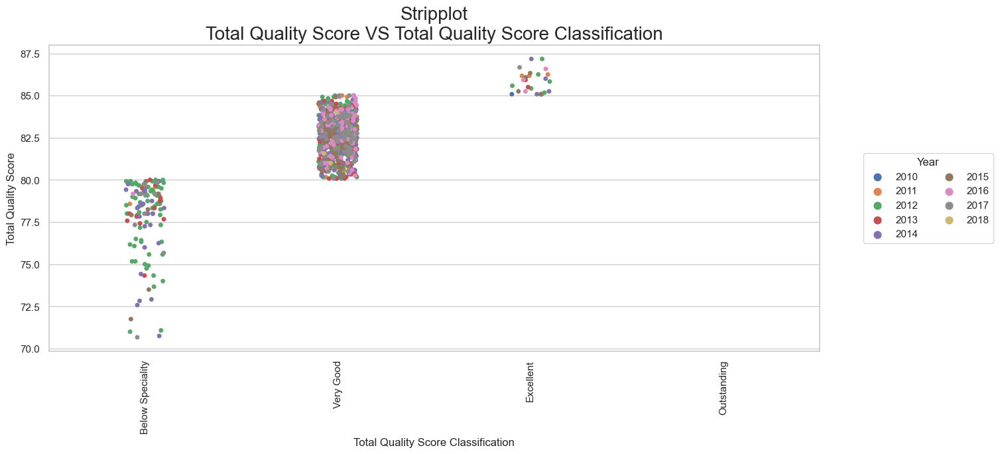

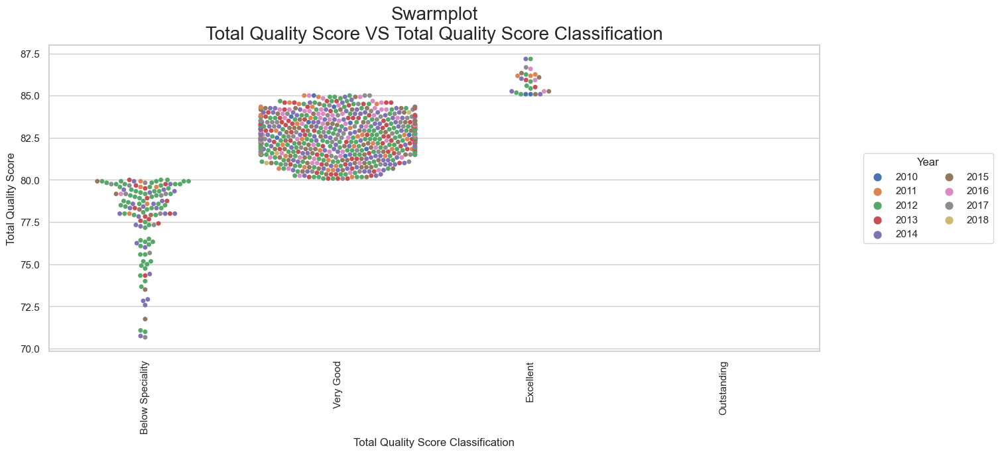

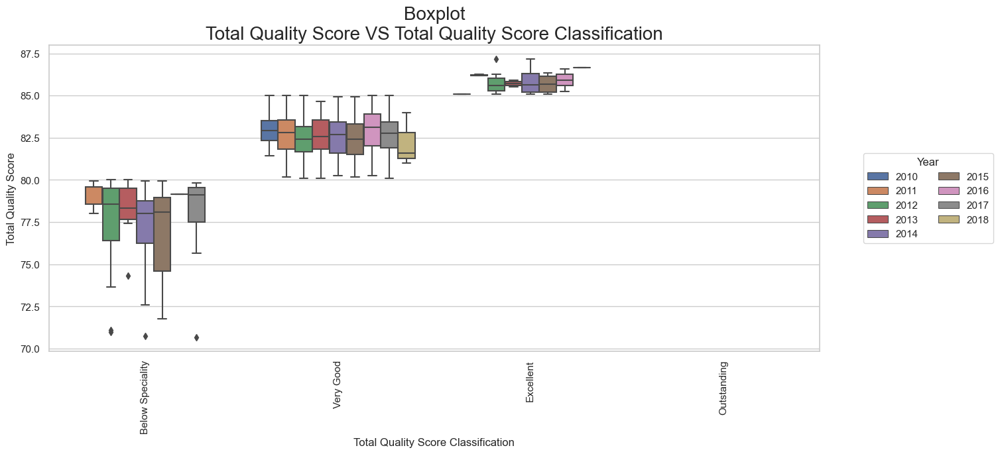

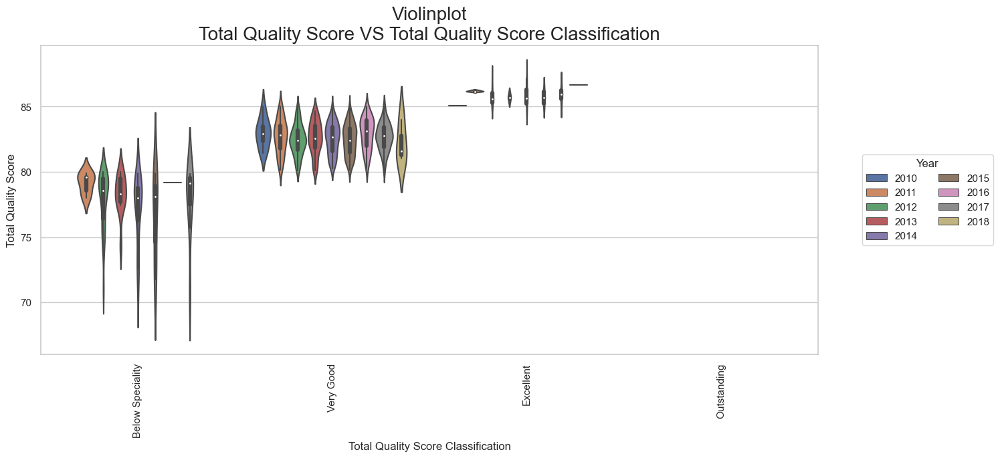

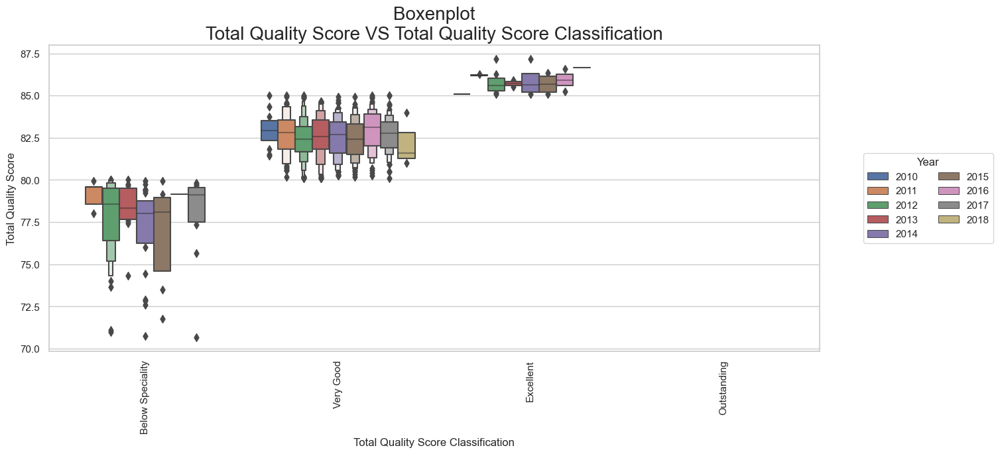

Total Quality Score VS Total Quality Score Classification (Total Quality Score Classification)


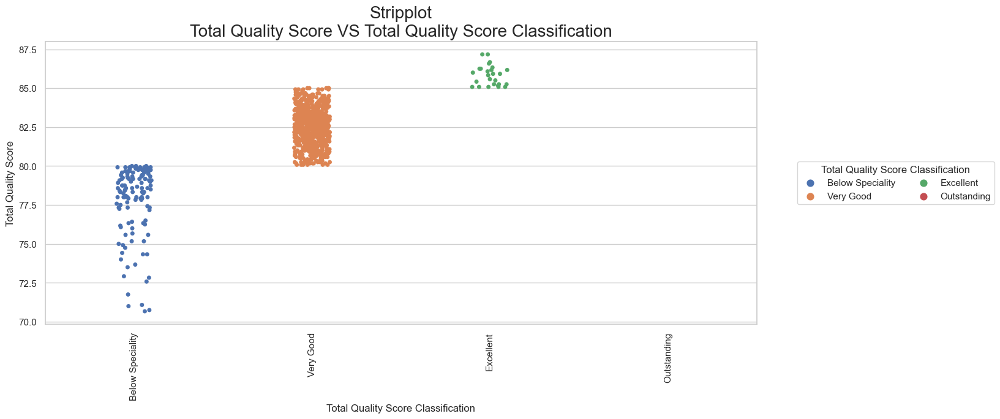

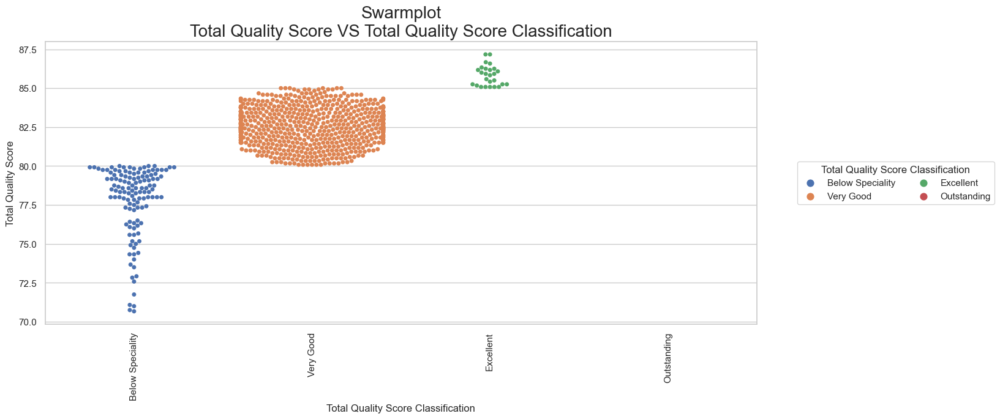

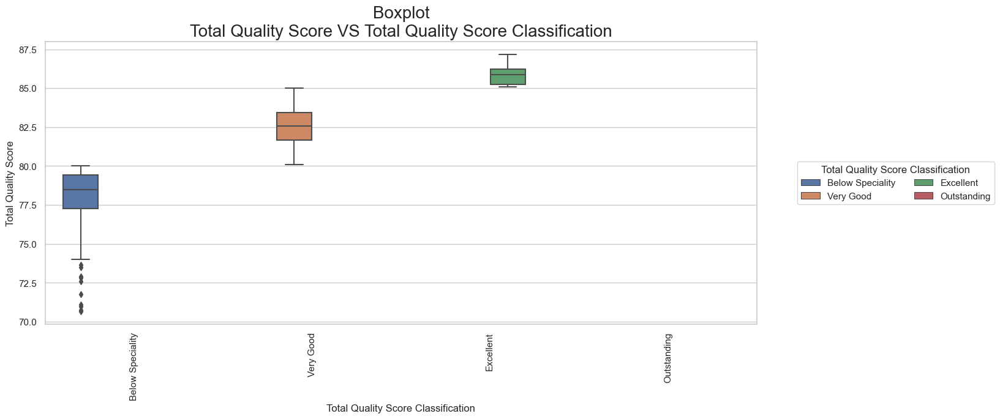

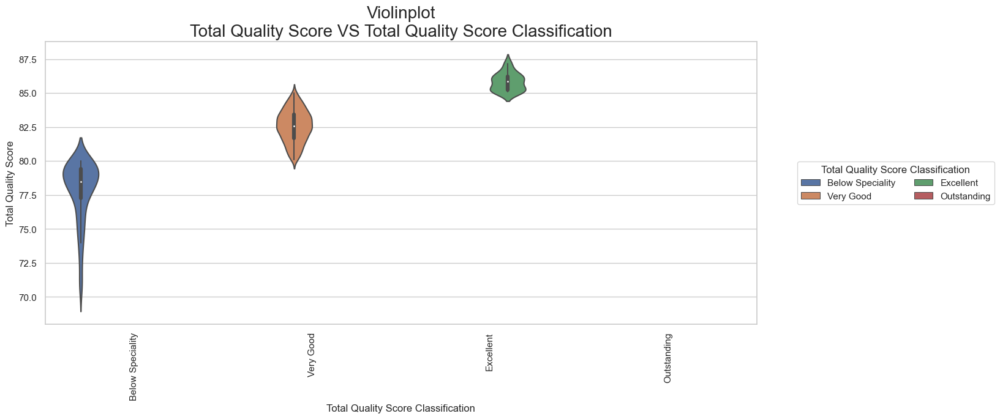

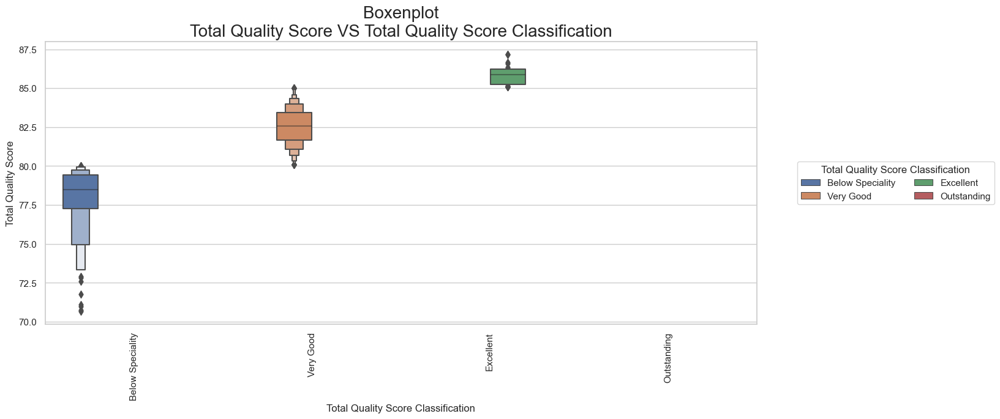

In [44]:
# Inputs for print_mult_catplots func. 
df = cfpq_a30_df
x_lt = ['Origin', 'Year', 'Total Quality Score Classification'] 
y_lt = ['Total Quality Score'] 
hue_lt = x_lt 

# Run print_mult_catplots func. 
myfcf_gra.print_mult_catplots(df, x_lt, y_lt, hue_lt)

## Project Phase 1

### Project Objective

Check whether coffee total quality score is systematically higher or different in some countries than in others. <br>

Note: The sample data is based on coffee total quality score from 30 April, 2010 to 19 January, 2018. <br>

### Problem Solving Steps

<ol>
    <li>Ensure that the sample is normally distributed.
        <ul>
            <li>If the sample is not normally distributed, test for normal distribution after performing data transformation (box-cox, yeo-johnson, log-normal, and square root) on it. </li>
        </ul>
    </li>
    <li>If sample is still not normally distributed after performing data transformation. Kruskal–Wallis H test and Mann-Whitney U Test (non-parametric tests) are used instead of ANOVA and Turkey's Test (parametric tests).</li>
</ol>

### Normality Check

#### Overview

In [45]:
# Inputs for normality check.
df = cfpq_a30_df 
col = 'Total Quality Score'

#### Normality Test

To test $H_0$: Distribution is normal
<br>Against $H_1$: Distribution is not normal

##### Shapiro–Wilk Test 

In [46]:
# Check if p-value is greater than the alpha level. 
# Input alpha for print_mult_shap_wilk_test func.
alpha_lt = [0.05, 0.025, 0.01]

# Run print_mult_shap_wilk_test func. 
myfcf_sta.print_mult_shap_wilk_test(df, col, alpha_lt, start_date, end_date)

Shapiro–Wilk Test at 5.0% level of significance,
Shapiro–Wilk Test for Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=0.89, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 2.5% level of significance,
Shapiro–Wilk Test for Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=0.89, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 1.0% level of significance,
Shapiro–Wilk Test for Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=0.89, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




##### D'Agostino-Pearson Test

In [47]:
# Run print_mult_normal_test func. 
myfcf_sta.print_mult_normal_test(df, col, alpha_lt, start_date, end_date) 

D'Agostino-Pearson Test at 5.0% level of significance,
D'Agostino-Pearson Test for Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=282.08, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 2.5% level of significance,
D'Agostino-Pearson Test for Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=282.08, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 1.0% level of significance,
D'Agostino-Pearson Test for Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=282.08, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




#### Probability Plot

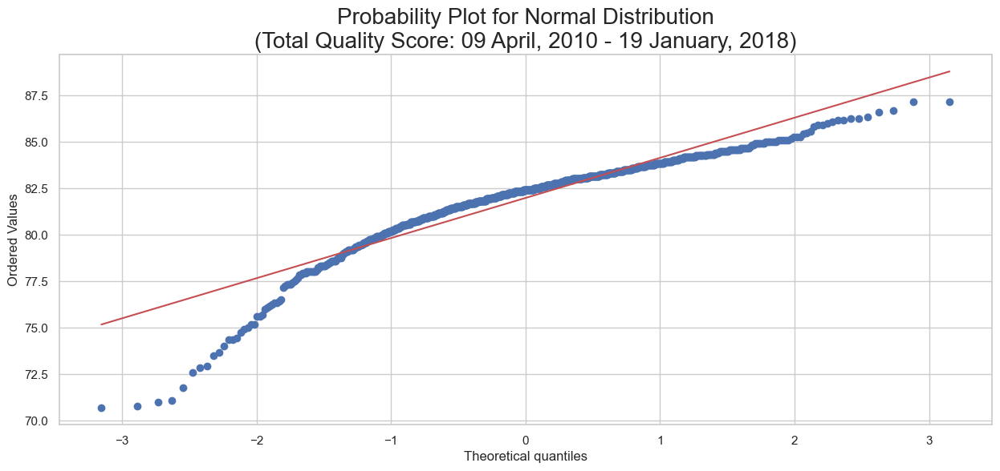

In [48]:
# Check if data points lay on the red color straight line. 
myfcf_sta.prob_plot(df, col, start_date, end_date)

#### Histogram 

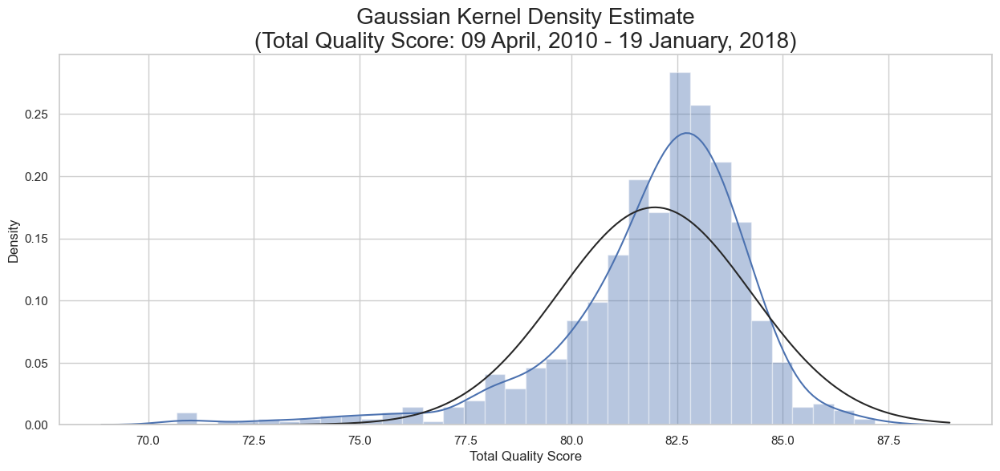

In [49]:
# Check the distribution based on skewness. 
myfcf_sta.kde_norm_distplot(df, col, start_date, end_date)

### Transformations

#### After Box-Cox Transformation

##### Overview

In [50]:
# Select transformation category. 
trans_cat = 'Box-Cox' 

# Add a box-cox transformation of total quality score column in new_cfpq_a30_df. 
new_cfpq_a30_df = cfpq_a30_df

# Compute the values after box-cox transformation. 
box_cox, best_Lambda_maxlog = boxcox(new_cfpq_a30_df['Total Quality Score'])

# Create a box-cox transformation of total quality score column in new_cfpq_a30_df. 
new_cfpq_a30_df['Box-Cox Transformation of Total Quality Score'] = box_cox 

# Display head of new_cfpq_a30_df. 
new_cfpq_a30_df.head()

,Species,Origin,Date,Total Quality Score,Total Quality Score Classification,Coffee Price (USD),Year,Box-Cox Transformation of Total Quality Score
0,Arabica,Guatemala,2010-04-30,84.33,Very Good,1.3528,2010,1.004028e+26
1,Arabica,United States (Hawaii),2010-05-17,85.08,Excellent,1.3255,2010,1.137509e+26
2,Arabica,United States (Hawaii),2010-05-24,81.83,Very Good,1.3225,2010,6.569047e+25
3,Arabica,United States (Hawaii),2010-05-24,81.42,Very Good,1.3225,2010,6.119981e+25
4,Arabica,Mexico,2010-05-26,83.38,Very Good,1.3370,2010,8.558249e+25


##### Normality Test

To test $H_0$: Distribution is normal
<br>Against $H_1$: Distribution is not normal

###### Shapiro–Wilk Test

In [51]:
# Check if p-value is greater than the alpha level. 
# Input alpha for print_mult_shap_wilk_test func.
df = new_cfpq_a30_df
col = 'Box-Cox Transformation of Total Quality Score'
alpha_lt = [0.05, 0.025, 0.01]

# Run print_mult_shap_wilk_test func. 
myfcf_sta.print_mult_shap_wilk_test(df, col, alpha_lt, start_date, end_date)

Shapiro–Wilk Test at 5.0% level of significance,
Shapiro–Wilk Test for Box-Cox Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=0.99, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 2.5% level of significance,
Shapiro–Wilk Test for Box-Cox Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=0.99, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 1.0% level of significance,
Shapiro–Wilk Test for Box-Cox Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=0.99, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




###### D'Agostino-Pearson Test 

In [52]:
# Run print_mult_normal_test func. 
myfcf_sta.print_mult_normal_test(df, col, alpha_lt, start_date, end_date)

D'Agostino-Pearson Test at 5.0% level of significance,
D'Agostino-Pearson Test for Box-Cox Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=11.96, p=0.003
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 2.5% level of significance,
D'Agostino-Pearson Test for Box-Cox Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=11.96, p=0.003
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 1.0% level of significance,
D'Agostino-Pearson Test for Box-Cox Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=11.96, p=0.003
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




##### Probability Plot

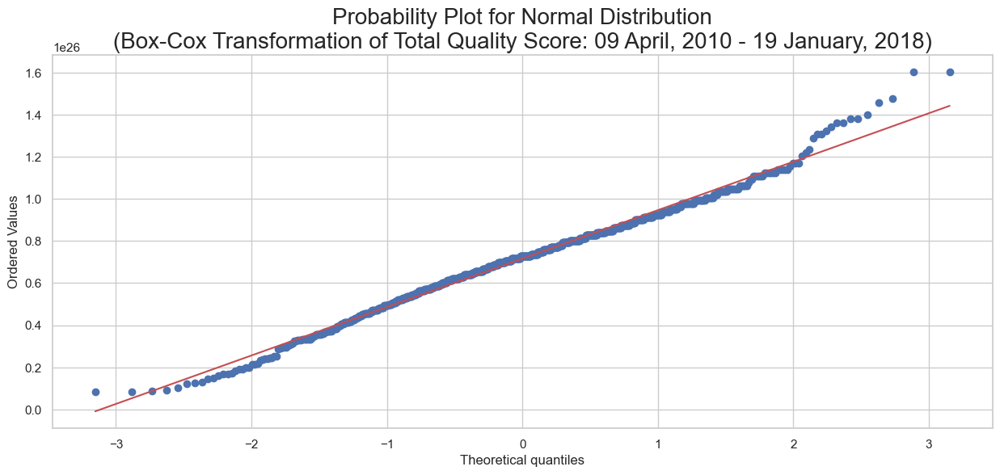

In [53]:
# Check if data points lay on the red color straight line. 
myfcf_sta.prob_plot(df, col, start_date, end_date)

##### Histogram 

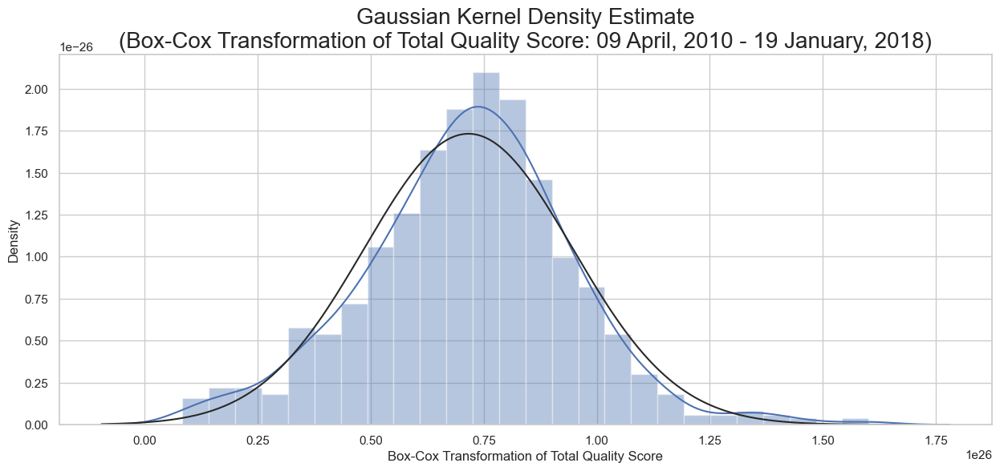

In [54]:
# Check the distribution based on skewness. 
myfcf_sta.kde_norm_distplot(df, col, start_date, end_date)

Hence, box-cox transformed sample is not normally distributed. 

#### After Yeo-Johnson Transformation

##### Overview

In [55]:
# Select transformation category. 
trans_cat = 'Yeo-John'

# Add a yeo-johnson transformation of total quality score column in new_cfpq_a30_df. 
new_cfpq_a30_df = cfpq_a30_df

# Compute the values after yeo-johnson transformation. 
yeo_john, best_Lambda_Yeo_John = yeojohnson(new_cfpq_a30_df['Total Quality Score']) 

# Create a box-cox transformation of total quality score column in new_cfpq_a30_df. 
new_cfpq_a30_df['Yeo-Johnson Transformation of Total Quality Score'] = box_cox 

# Display head of new_cfpq_a30_df. 
new_cfpq_a30_df.head()

,Species,Origin,Date,Total Quality Score,Total Quality Score Classification,Coffee Price (USD),Year,Box-Cox Transformation of Total Quality Score,Yeo-Johnson Transformation of Total Quality Score
0,Arabica,Guatemala,2010-04-30,84.33,Very Good,1.3528,2010,1.004028e+26,1.004028e+26
1,Arabica,United States (Hawaii),2010-05-17,85.08,Excellent,1.3255,2010,1.137509e+26,1.137509e+26
2,Arabica,United States (Hawaii),2010-05-24,81.83,Very Good,1.3225,2010,6.569047e+25,6.569047e+25
3,Arabica,United States (Hawaii),2010-05-24,81.42,Very Good,1.3225,2010,6.119981e+25,6.119981e+25
4,Arabica,Mexico,2010-05-26,83.38,Very Good,1.3370,2010,8.558249e+25,8.558249e+25


##### Normality Test

To test $H_0$: Distribution is normal
<br>Against $H_1$: Distribution is not normal

###### Shapiro–Wilk Test

In [56]:
# Check if p-value is greater than the alpha level. 
# Input alpha for print_mult_shap_wilk_test func.
df = new_cfpq_a30_df
col = 'Yeo-Johnson Transformation of Total Quality Score'
alpha_lt = [0.05, 0.025, 0.01]

# Run print_mult_shap_wilk_test func. 
myfcf_sta.print_mult_shap_wilk_test(df, col, alpha_lt, start_date, end_date)

Shapiro–Wilk Test at 5.0% level of significance,
Shapiro–Wilk Test for Yeo-Johnson Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=0.99, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 2.5% level of significance,
Shapiro–Wilk Test for Yeo-Johnson Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=0.99, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 1.0% level of significance,
Shapiro–Wilk Test for Yeo-Johnson Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=0.99, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




###### D'Agostino-Pearson Test

In [57]:
# Run print_mult_normal_test func. 
myfcf_sta.print_mult_normal_test(df, col, alpha_lt, start_date, end_date)

D'Agostino-Pearson Test at 5.0% level of significance,
D'Agostino-Pearson Test for Yeo-Johnson Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=11.96, p=0.003
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 2.5% level of significance,
D'Agostino-Pearson Test for Yeo-Johnson Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=11.96, p=0.003
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 1.0% level of significance,
D'Agostino-Pearson Test for Yeo-Johnson Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=11.96, p=0.003
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




##### Probability Plot

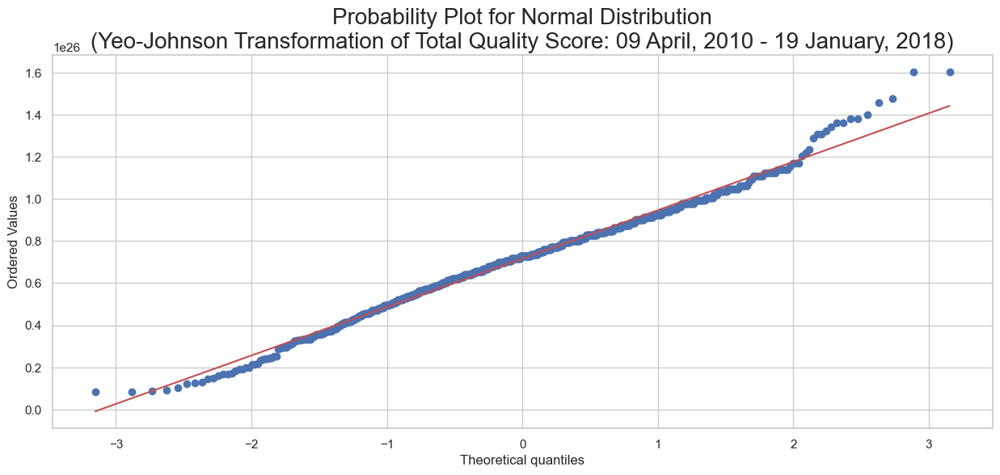

In [58]:
# Check if data points lay on the red color straight line. 
myfcf_sta.prob_plot(df, col, start_date, end_date)

##### Histogram

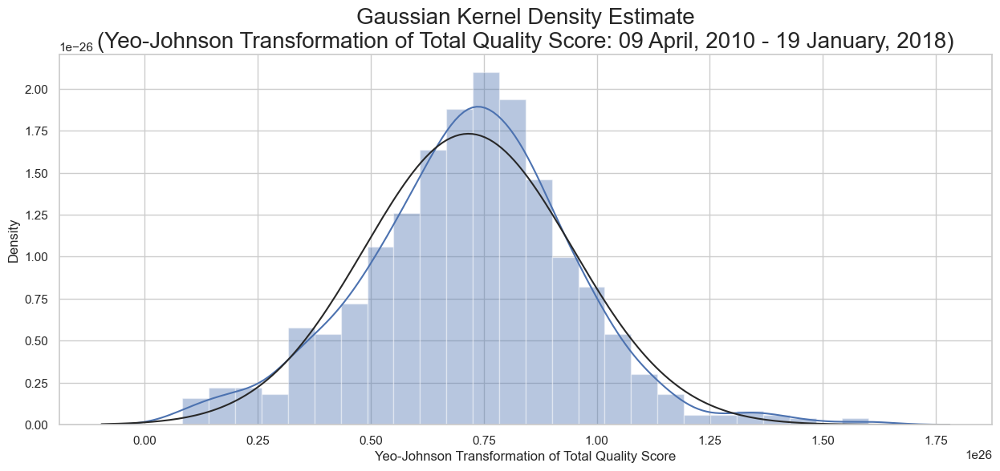

In [59]:
# Check the distribution based on skewness. 
myfcf_sta.kde_norm_distplot(df, col, start_date, end_date)

Hence, yeo-johnson transformed sample is not normally distributed. 

#### After Log-Normal Transformation

##### Overview

In [60]:
# Select transformation category. 
trans_cat = 'Log-Normal'

# Add a log-normal transformation of total quality score column in new_cfpq_a30_df. 
new_cfpq_a30_df = cfpq_a30_df 

# Compute the values after log-normal transformation. 
log_cfq = -np.log10(new_cfpq_a30_df['Total Quality Score']) 

# Create a log-normal transformation of total quality score column in new_cfpq_a30_df. 
new_cfpq_a30_df['Log-Normal Transformation of Total Quality Score'] = log_cfq 

# Display head of new_cfpq_a30_df. 
new_cfpq_a30_df.head()

,Species,Origin,Date,Total Quality Score,Total Quality Score Classification,Coffee Price (USD),Year,Box-Cox Transformation of Total Quality Score,Yeo-Johnson Transformation of Total Quality Score,Log-Normal Transformation of Total Quality Score
0,Arabica,Guatemala,2010-04-30,84.33,Very Good,1.3528,2010,1.004028e+26,1.004028e+26,-1.925982
1,Arabica,United States (Hawaii),2010-05-17,85.08,Excellent,1.3255,2010,1.137509e+26,1.137509e+26,-1.929827
2,Arabica,United States (Hawaii),2010-05-24,81.83,Very Good,1.3225,2010,6.569047e+25,6.569047e+25,-1.912913
3,Arabica,United States (Hawaii),2010-05-24,81.42,Very Good,1.3225,2010,6.119981e+25,6.119981e+25,-1.910731
4,Arabica,Mexico,2010-05-26,83.38,Very Good,1.3370,2010,8.558249e+25,8.558249e+25,-1.921062


##### Normality Test

To test $H_0$: Distribution is normal
<br>Against $H_1$: Distribution is not normal

###### Shapiro–Wilk Test

In [61]:
# Check if p-value is greater than the alpha level. 
# Input alpha for print_mult_shap_wilk_test func.
df = new_cfpq_a30_df
col = 'Log-Normal Transformation of Total Quality Score'
alpha_lt = [0.05, 0.025, 0.01]

# Run print_mult_shap_wilk_test func. 
myfcf_sta.print_mult_shap_wilk_test(df, col, alpha_lt, start_date, end_date)

Shapiro–Wilk Test at 5.0% level of significance,
Shapiro–Wilk Test for Log-Normal Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=0.88, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 2.5% level of significance,
Shapiro–Wilk Test for Log-Normal Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=0.88, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 1.0% level of significance,
Shapiro–Wilk Test for Log-Normal Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=0.88, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




###### D'Agostino-Pearson Test

In [62]:
# Run print_mult_normal_test func. 
myfcf_sta.print_mult_normal_test(df, col, alpha_lt, start_date, end_date)

D'Agostino-Pearson Test at 5.0% level of significance,
D'Agostino-Pearson Test for Log-Normal Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=321.26, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 2.5% level of significance,
D'Agostino-Pearson Test for Log-Normal Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=321.26, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 1.0% level of significance,
D'Agostino-Pearson Test for Log-Normal Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=321.26, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




##### Probability Plot

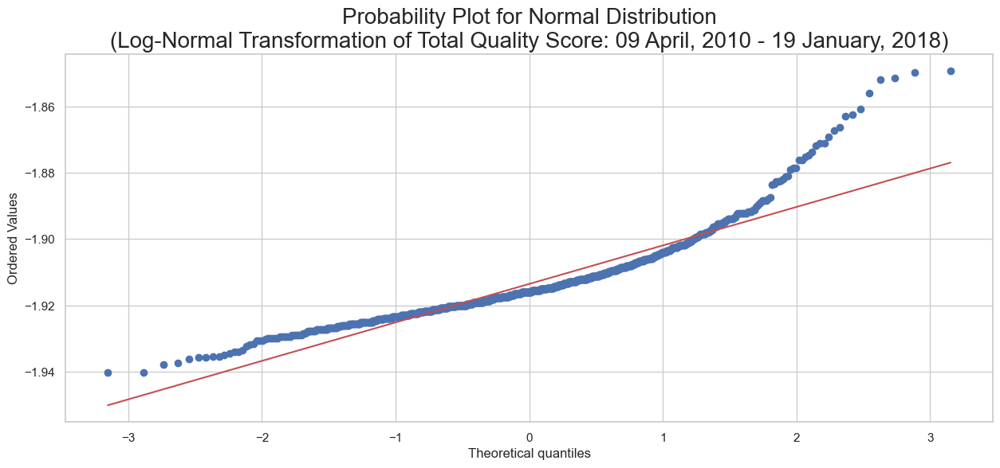

In [63]:
# Check if data points lay on the red color straight line. 
myfcf_sta.prob_plot(df, col, start_date, end_date)

##### Histogram

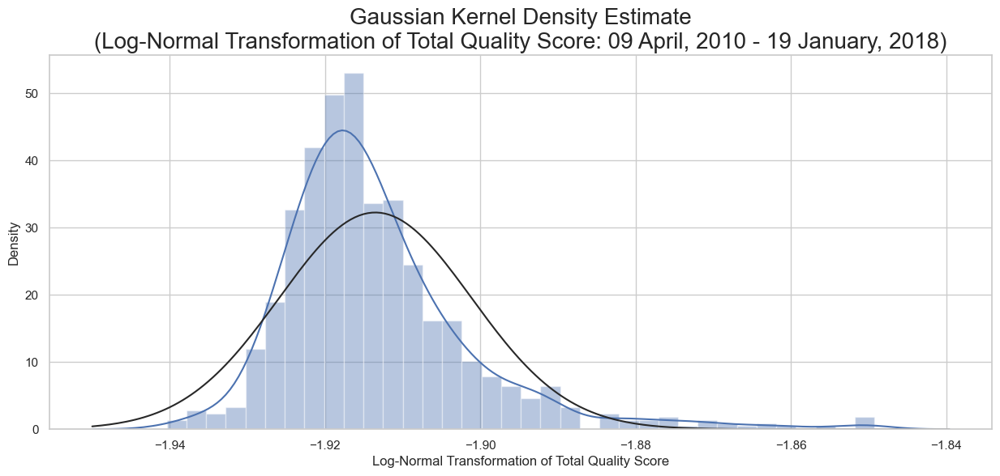

In [64]:
# Check the distribution based on skewness. 
myfcf_sta.kde_norm_distplot(df, col, start_date, end_date)

Hence, log-normal transformed sample is not normally distributed. 

#### After Square Root Transformation

##### Overview

In [65]:
# Select transformation category. 
trans_cat = 'Square Root'

# Add a square root transformation of total quality score column in new_cfpq_a30_df. 
new_cfpq_a30_df = cfpq_a30_df 

# Compute the values after square root transformation. 
sqrt_cfq = np.sqrt(87.17 - new_cfpq_a30_df['Total Quality Score']) 

# Create a square root transformation of total quality score column in new_cfpq_a30_df. 
new_cfpq_a30_df['Square Root Transformation of Total Quality Score'] = sqrt_cfq 

# Display head of new_cfpq_a30_df. 
new_cfpq_a30_df.head()

,Species,Origin,Date,Total Quality Score,Total Quality Score Classification,Coffee Price (USD),Year,Box-Cox Transformation of Total Quality Score,Yeo-Johnson Transformation of Total Quality Score,Log-Normal Transformation of Total Quality Score,Square Root Transformation of Total Quality Score
0,Arabica,Guatemala,2010-04-30,84.33,Very Good,1.3528,2010,1.004028e+26,1.004028e+26,-1.925982,1.685230
1,Arabica,United States (Hawaii),2010-05-17,85.08,Excellent,1.3255,2010,1.137509e+26,1.137509e+26,-1.929827,1.445683
2,Arabica,United States (Hawaii),2010-05-24,81.83,Very Good,1.3225,2010,6.569047e+25,6.569047e+25,-1.912913,2.310844
3,Arabica,United States (Hawaii),2010-05-24,81.42,Very Good,1.3225,2010,6.119981e+25,6.119981e+25,-1.910731,2.397916
4,Arabica,Mexico,2010-05-26,83.38,Very Good,1.3370,2010,8.558249e+25,8.558249e+25,-1.921062,1.946792


##### Normality Test

To test $H_0$: Distribution is normal
<br>Against $H_1$: Distribution is not normal

###### Shapiro–Wilk Test

In [66]:
# Check if p-value is greater than the alpha level. 
# Input alpha for print_mult_shap_wilk_test func.
df = new_cfpq_a30_df
col = 'Square Root Transformation of Total Quality Score'
alpha_lt = [0.05, 0.025, 0.01]

# Run print_mult_shap_wilk_test func. 
myfcf_sta.print_mult_shap_wilk_test(df, col, alpha_lt, start_date, end_date)

Shapiro–Wilk Test at 5.0% level of significance,
Shapiro–Wilk Test for Square Root Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=0.96, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 2.5% level of significance,
Shapiro–Wilk Test for Square Root Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=0.96, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 1.0% level of significance,
Shapiro–Wilk Test for Square Root Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=0.96, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




###### D'Agostino-Pearson Test

In [67]:
# Run print_mult_normal_test func. 
myfcf_sta.print_mult_normal_test(df, col, alpha_lt, start_date, end_date)

D'Agostino-Pearson Test at 5.0% level of significance,
D'Agostino-Pearson Test for Square Root Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=72.66, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 2.5% level of significance,
D'Agostino-Pearson Test for Square Root Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=72.66, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 1.0% level of significance,
D'Agostino-Pearson Test for Square Root Transformation of Total Quality Score (09 April, 2010 - 19 January, 2018)
stat=72.66, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




##### Probability Plot

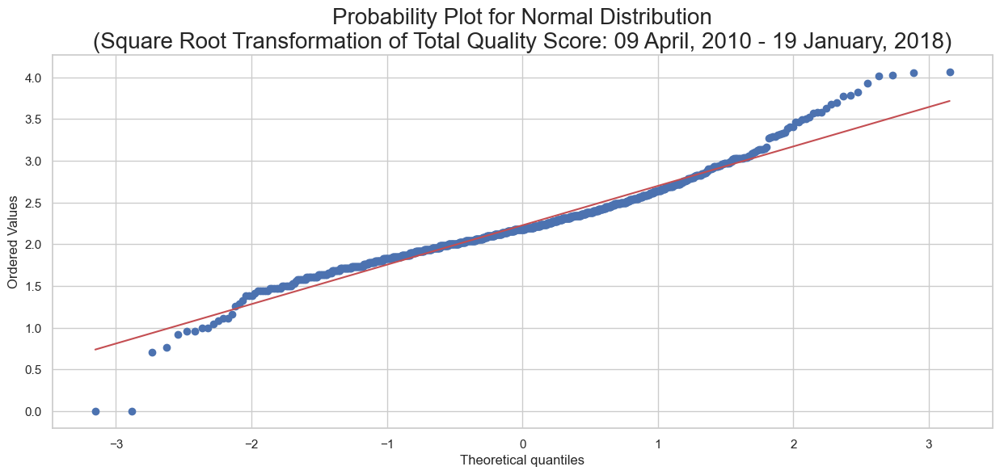

In [68]:
# Check if data points lay on the red color straight line. 
myfcf_sta.prob_plot(df, col, start_date, end_date)

##### Histogram

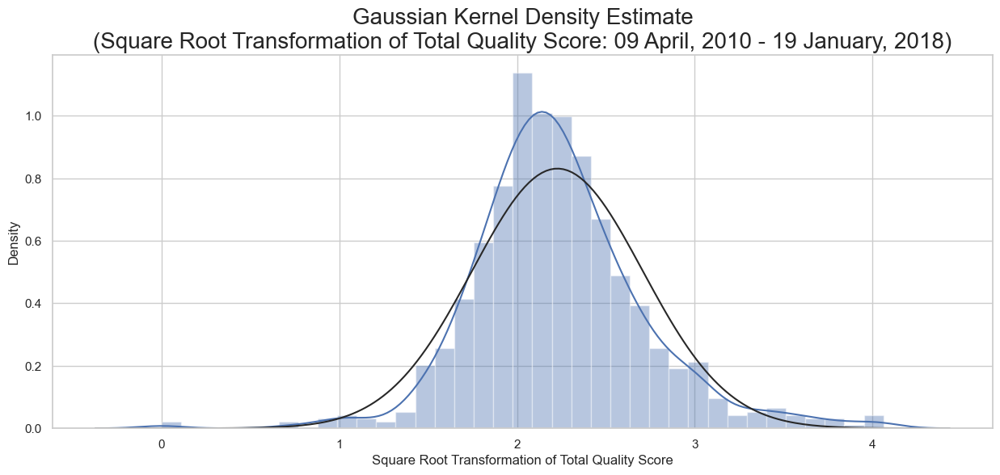

In [69]:
# Check the distribution based on skewness. 
myfcf_sta.kde_norm_distplot(df, col, start_date, end_date)

Hence, square root transformed sample is not normally distributed. 

### Data Visualizations

#### Boxplot

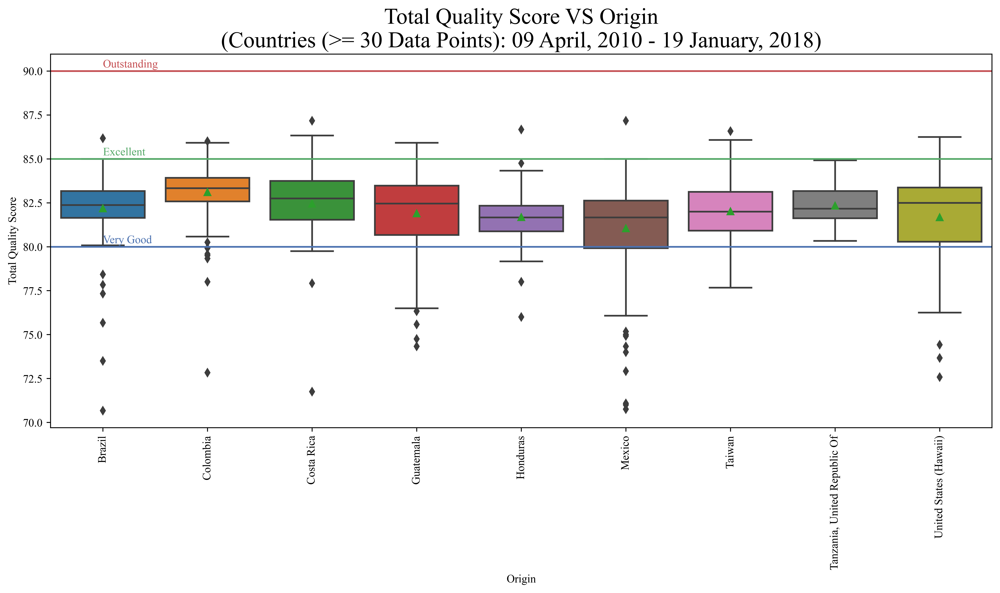

In [70]:
# Plot a boxplot for countries with >= 30 data points.
# Inputs for cfpq_boxplot func. 
df = cfpq_a30_df
x = 'Origin'
y = 'Total Quality Score' 
hue = None
curr_mean_cfp = None
pop_mean_cfp = None
samp_mean_cfp = None

# Run cfpq_boxplot func. 
myfcf_gra.cfpq_boxplot(df, x, y, hue, curr_mean_cfp, pop_mean_cfp, samp_mean_cfp, start_date, end_date)

#### Histogram

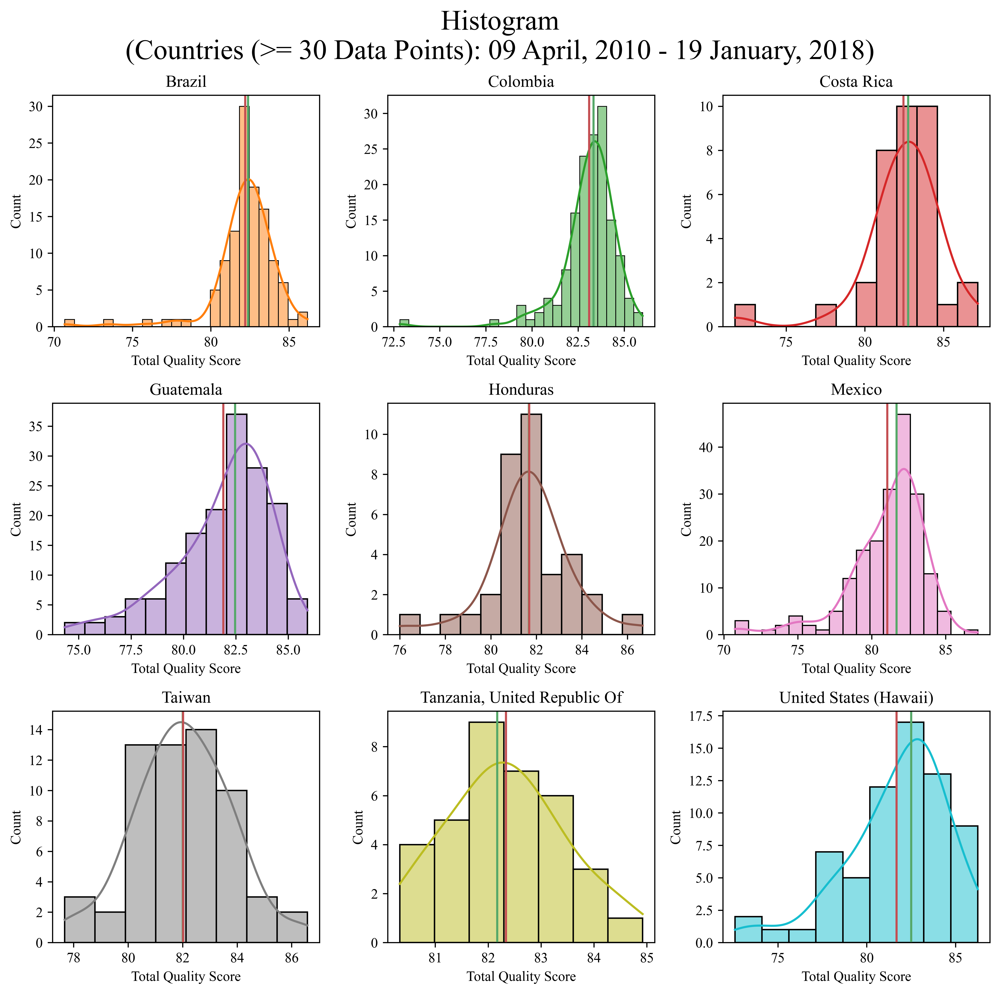

Note: Green line: Median; Red line: Mean


In [71]:
# Plot a histrogram for countries with >= 30 data points.
# Inputs for ctry_a30_histplot_9df func. 
df1 = bra_df
df2 = co_df
df3 = cr_df
df4 = gt_df 
df5 = hond_df 
df6 = mx_df 
df7 = tw_df 
df8 = urt_df 
df9 = hi_df 
y = 'Total Quality Score'
sub_ttl_lt = ctry_a30_lt

# Run ctry_a30_histplot_9df func. 
myfcf_gra.ctry_a30_histplot_9df(df1, df2, df3, df4, df5, df6, df7, df8, df9, y, sub_ttl_lt, start_date, end_date)

### Non-parametric Tests

#### Perform Kruskal–Wallis H test

To test $H_0$: $μ_1$ = $μ_2$ = $μ_3$ = $μ_4$ = $μ_5$ = $μ_6$ = $μ_7$ = $μ_8$ = $μ_9$
<br>Against $H_1$: $μ_1$ ≠ $μ_2$ = $μ_3$ = $μ_4$ = $μ_5$ = $μ_6$ = $μ_7$ = $μ_8$ = $μ_9$

In [72]:
# Perform kruskal-wallis test for countries with >= 30 data points.
# Inputs for print_mult_krus_wall_test_9df func.
df1 = bra_df
df2 = co_df
df3 = cr_df
df4 = gt_df 
df5 = hond_df 
df6 = mx_df 
df7 = tw_df 
df8 = urt_df 
df9 = hi_df 
x = 'Origin'
y = 'Total Quality Score' 
alpha_lt = [0.05, 0.025, 0.01]

# Run print_mult_krus_wall_test_9df func. 
myfcf_sta.print_mult_krus_wall_test_9df(df1, df2, df3, df4, df5, df6, df7, df8, df9, x, y, alpha_lt, start_date, end_date)

Kruskal-Wallis H Test at 5.0% level of significance,
Kruskal-Wallis H Test for Total Quality Score and Origin (09 April, 2010 - 19 January, 2018)
stat=856.00, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that total quality score is systematically higher or different in some countries than in others.


Kruskal-Wallis H Test at 2.5% level of significance,
Kruskal-Wallis H Test for Total Quality Score and Origin (09 April, 2010 - 19 January, 2018)
stat=856.00, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that total quality score is systematically higher or different in some countries than in others.


Kruskal-Wallis H Test at 1.0% level of significance,
Kruskal-Wallis H Test for Total Quality Score and Origin (09 April, 2010 - 19 January, 2018)
stat=856.00, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that total quality score is sys

Hence, based on the findings, there is significant evidence, at 1.0% to 5.0% level of significance, that total quality score is systematically higher or different in some countries than in others.

#### Perform Mann-Whitney U Test

To test $H_0$: $μ_1$ = $μ_2$ 
<br>Against $H_1$: $μ_1$ ≠ $μ_2$ 

In [73]:
# Print out mann-whitney u test results at various significant level. 
# Inputs for print_mult_mw_test func. 
df = cfpq_a30_df
x = 'Origin'
y = 'Total Quality Score' 
alpha_lt = [0.05, 0.025, 0.01] # alpha: level of significance. 

# Run print_mult_mw_test func. 
myfcf_sta.print_mult_mann_whit_test(df, x, y, alpha_lt, start_date, end_date)

Mann-Whitney U Test at 5.0% level of significance,
Mann-Whitney U Test for Total Quality Score and Origin (Guatemala and United States (Hawaii)) (09 April, 2010 - 19 January, 2018)
stat=5544.50, p=0.798
Do not reject Ho and conclude that there is no significant evidence, at 5.0% level of significance, that mean of Total Quality Score for Guatemala and mean of Total Quality Score for United States (Hawaii) is equal.
Mann-Whitney U Test for Total Quality Score and Origin (Guatemala and Mexico) (09 April, 2010 - 19 January, 2018)
stat=19399.00, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that mean of Total Quality Score for Guatemala and mean of Total Quality Score for Mexico is not equal.
Mann-Whitney U Test for Total Quality Score and Origin (Guatemala and Colombia) (09 April, 2010 - 19 January, 2018)
stat=8134.00, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that mean of Total Qua

Hence, based on the findings, there is significant evidence, at 1.0% to 5% level of significance, that mean of Total Quality Score for Colombia and mean of Total Quality Score for Brazil, Tanzania, United Republic Of, Taiwan, Honduras, Guatemala, United States (Hawaii), and Mexico are not equal, and that the mean of Total Quality Score of Colombian coffee is distinctly different from the rest.

## Project Phase 2

### Project Objective

Check whether coffee price (USD) is systematically higher or different in some total quality score classification than in others. <br>

Note: The sample data is based on coffee price (USD) from 30 April, 2010 to 19 January, 2018. <br>

### Problem Solving Steps

<ol>
    <li>Ensure that the sample is normally distributed.
        <ul>
            <li>If the sample is not normally distributed, test for normal distribution after performing data transformation (box-cox, yeo-johnson, log-normal, and square root) on it. </li>
        </ul>
    </li>
    <li>If sample is still not normally distributed after performing data transformation. Kruskal–Wallis H test and Mann-Whitney U Test (non-parametric tests) are used instead of ANOVA and Turkey's Test (parametric tests).</li>
</ol>

### Normality Check

#### Overview

In [74]:
# Inputs for normality check.
df = cfpq_a30_df 
col = 'Coffee Price (USD)' 

#### Normality Test

To test $H_0$: Distribution is normal
<br>Against $H_1$: Distribution is not normal

##### Shapiro–Wilk Test

In [75]:
# Check if p-value is greater than the alpha level. 
# Input alpha for print_mult_shap_wilk_test func.
alpha_lt = [0.05, 0.025, 0.01]

# Run print_mult_shap_wilk_test func. 
myfcf_sta.print_mult_shap_wilk_test(df, col, alpha_lt, start_date, end_date)

Shapiro–Wilk Test at 5.0% level of significance,
Shapiro–Wilk Test for Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=0.92, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 2.5% level of significance,
Shapiro–Wilk Test for Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=0.92, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 1.0% level of significance,
Shapiro–Wilk Test for Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=0.92, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




##### D'Agostino-Pearson Test

In [76]:
# Run print_mult_normal_test func. 
myfcf_sta.print_mult_normal_test(df, col, alpha_lt, start_date, end_date)

D'Agostino-Pearson Test at 5.0% level of significance,
D'Agostino-Pearson Test for Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=136.07, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 2.5% level of significance,
D'Agostino-Pearson Test for Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=136.07, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 1.0% level of significance,
D'Agostino-Pearson Test for Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=136.07, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




#### Probability Plot

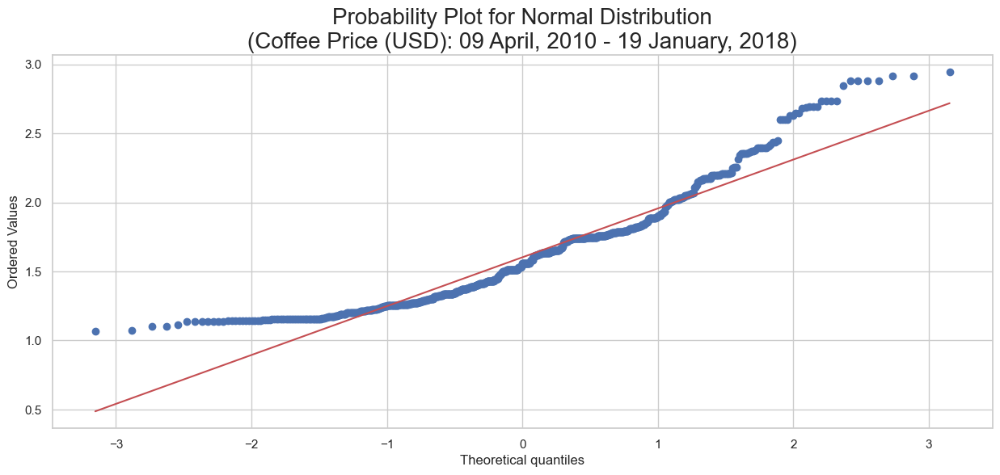

In [77]:
# Check if data points lay on the red color straight line. 
myfcf_sta.prob_plot(df, col, start_date, end_date)

#### Histogram 

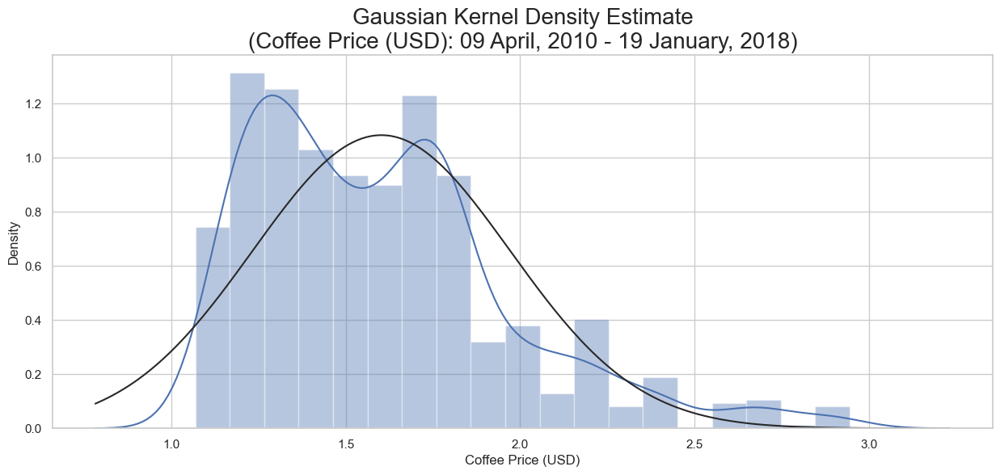

In [78]:
# Check the distribution based on skewness. 
myfcf_sta.kde_norm_distplot(df, col, start_date, end_date)

### Transformations

#### After Box-Cox Transformation

##### Overview

In [79]:
# Select transformation category. 
trans_cat = 'Box-Cox' 

# Add a box-cox transformation of coffee price (usd) column in new_cfpq_a30_df. 
new_cfpq_a30_df = cfpq_a30_df

# Compute the values after box-cox transformation. 
box_cox, best_Lambda_maxlog = boxcox(new_cfpq_a30_df['Coffee Price (USD)'])

# Create a box-cox transformation of coffee price (usd) column in new_cfpq_a30_df. 
new_cfpq_a30_df['Box-Cox Transformation of Coffee Price (USD)'] = box_cox 

# Display head of new_cfpq_a30_df. 
new_cfpq_a30_df.head()

,Species,Origin,Date,Total Quality Score,Total Quality Score Classification,Coffee Price (USD),Year,Box-Cox Transformation of Total Quality Score,Yeo-Johnson Transformation of Total Quality Score,Log-Normal Transformation of Total Quality Score,Square Root Transformation of Total Quality Score,Box-Cox Transformation of Coffee Price (USD)
0,Arabica,Guatemala,2010-04-30,84.33,Very Good,1.3528,2010,1.004028e+26,1.004028e+26,-1.925982,1.685230,0.257373
1,Arabica,United States (Hawaii),2010-05-17,85.08,Excellent,1.3255,2010,1.137509e+26,1.137509e+26,-1.929827,1.445683,0.242553
2,Arabica,United States (Hawaii),2010-05-24,81.83,Very Good,1.3225,2010,6.569047e+25,6.569047e+25,-1.912913,2.310844,0.240885
3,Arabica,United States (Hawaii),2010-05-24,81.42,Very Good,1.3225,2010,6.119981e+25,6.119981e+25,-1.910731,2.397916,0.240885
4,Arabica,Mexico,2010-05-26,83.38,Very Good,1.3370,2010,8.558249e+25,8.558249e+25,-1.921062,1.946792,0.248873


##### Normality Test

To test $H_0$: Distribution is normal
<br>Against $H_1$: Distribution is not normal

###### Shapiro–Wilk Test

In [80]:
# Check if p-value is greater than the alpha level. 
# Input alpha for print_mult_shap_wilk_test func.
df = new_cfpq_a30_df
col = 'Box-Cox Transformation of Coffee Price (USD)'
alpha_lt = [0.05, 0.025, 0.01]

# Run print_mult_shap_wilk_test func. 
myfcf_sta.print_mult_shap_wilk_test(df, col, alpha_lt, start_date, end_date)

Shapiro–Wilk Test at 5.0% level of significance,
Shapiro–Wilk Test for Box-Cox Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=0.97, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 2.5% level of significance,
Shapiro–Wilk Test for Box-Cox Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=0.97, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 1.0% level of significance,
Shapiro–Wilk Test for Box-Cox Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=0.97, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




###### D'Agostino-Pearson Test

In [81]:
# Run print_mult_normal_test func. 
myfcf_sta.print_mult_normal_test(df, col, alpha_lt, start_date, end_date)

D'Agostino-Pearson Test at 5.0% level of significance,
D'Agostino-Pearson Test for Box-Cox Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=89.36, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 2.5% level of significance,
D'Agostino-Pearson Test for Box-Cox Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=89.36, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 1.0% level of significance,
D'Agostino-Pearson Test for Box-Cox Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=89.36, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




##### Probability Plot

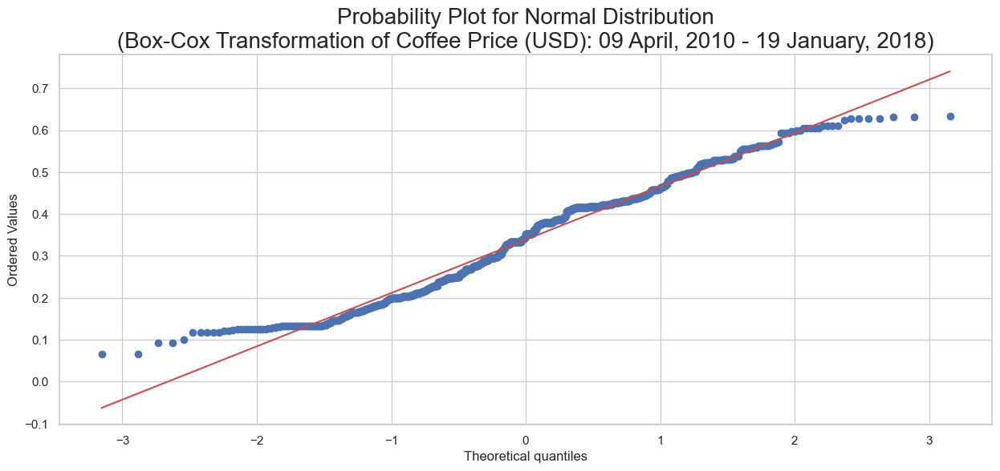

In [82]:
# Check if data points lay on the red color straight line. 
myfcf_sta.prob_plot(df, col, start_date, end_date)

##### Histogram 

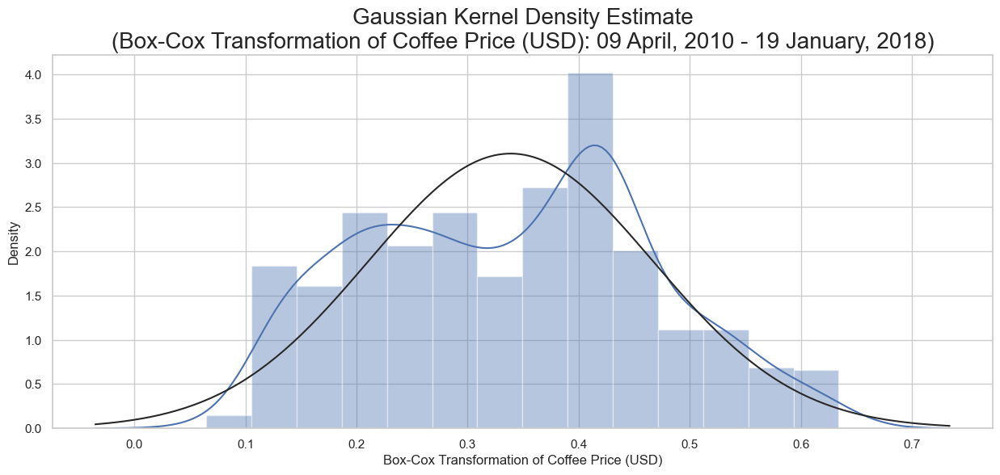

In [83]:
# Check the distribution based on skewness. 
myfcf_sta.kde_norm_distplot(df, col, start_date, end_date)

Hence, box-cox transformed sample is not normally distributed. 

#### After Yeo-Johnson Transformation

##### Overview

In [84]:
# Select transformation category. 
trans_cat = 'Yeo-John'

# Add a yeo-johnson transformation of coffee price (usd) column in new_cfpq_a30_df. 
new_cfpq_a30_df = cfpq_a30_df

# Compute the values after yeo-johnson transformation. 
yeo_john, best_Lambda_Yeo_John = yeojohnson(new_cfpq_a30_df['Coffee Price (USD)']) 

# Create a box-cox transformation of coffee price (usd) column in new_cfpq_a30_df. 
new_cfpq_a30_df['Yeo-Johnson Transformation of Coffee Price (USD)'] = box_cox 

# Display head of new_cfpq_a30_df. 
new_cfpq_a30_df.head()

,Species,Origin,Date,Total Quality Score,Total Quality Score Classification,Coffee Price (USD),Year,Box-Cox Transformation of Total Quality Score,Yeo-Johnson Transformation of Total Quality Score,Log-Normal Transformation of Total Quality Score,Square Root Transformation of Total Quality Score,Box-Cox Transformation of Coffee Price (USD),Yeo-Johnson Transformation of Coffee Price (USD)
0,Arabica,Guatemala,2010-04-30,84.33,Very Good,1.3528,2010,1.004028e+26,1.004028e+26,-1.925982,1.685230,0.257373,0.257373
1,Arabica,United States (Hawaii),2010-05-17,85.08,Excellent,1.3255,2010,1.137509e+26,1.137509e+26,-1.929827,1.445683,0.242553,0.242553
2,Arabica,United States (Hawaii),2010-05-24,81.83,Very Good,1.3225,2010,6.569047e+25,6.569047e+25,-1.912913,2.310844,0.240885,0.240885
3,Arabica,United States (Hawaii),2010-05-24,81.42,Very Good,1.3225,2010,6.119981e+25,6.119981e+25,-1.910731,2.397916,0.240885,0.240885
4,Arabica,Mexico,2010-05-26,83.38,Very Good,1.3370,2010,8.558249e+25,8.558249e+25,-1.921062,1.946792,0.248873,0.248873


##### Normality Test

To test $H_0$: Distribution is normal
<br>Against $H_1$: Distribution is not normal

###### Shapiro–Wilk Test

In [85]:
# Check if p-value is greater than the alpha level. 
# Input alpha for print_mult_shap_wilk_test func.
df = new_cfpq_a30_df
col = 'Yeo-Johnson Transformation of Coffee Price (USD)'
alpha_lt = [0.05, 0.025, 0.01]

# Run print_mult_shap_wilk_test func. 
myfcf_sta.print_mult_shap_wilk_test(df, col, alpha_lt, start_date, end_date)

Shapiro–Wilk Test at 5.0% level of significance,
Shapiro–Wilk Test for Yeo-Johnson Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=0.97, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 2.5% level of significance,
Shapiro–Wilk Test for Yeo-Johnson Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=0.97, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 1.0% level of significance,
Shapiro–Wilk Test for Yeo-Johnson Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=0.97, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




###### D'Agostino-Pearson Test

In [86]:
# Run print_mult_normal_test func. 
myfcf_sta.print_mult_normal_test(df, col, alpha_lt, start_date, end_date)

D'Agostino-Pearson Test at 5.0% level of significance,
D'Agostino-Pearson Test for Yeo-Johnson Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=89.36, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 2.5% level of significance,
D'Agostino-Pearson Test for Yeo-Johnson Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=89.36, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 1.0% level of significance,
D'Agostino-Pearson Test for Yeo-Johnson Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=89.36, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




##### Probability Plot

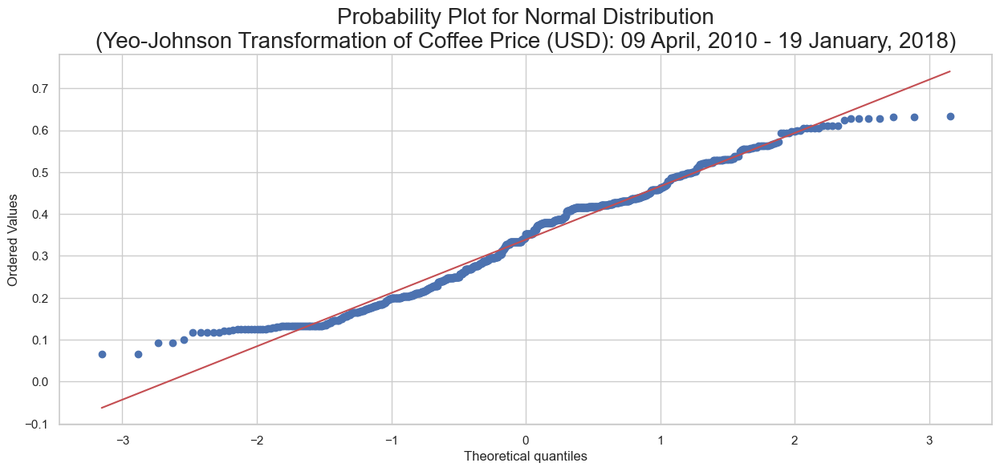

In [87]:
# Check if data points lay on the red color straight line. 
myfcf_sta.prob_plot(df, col, start_date, end_date)

##### Histogram

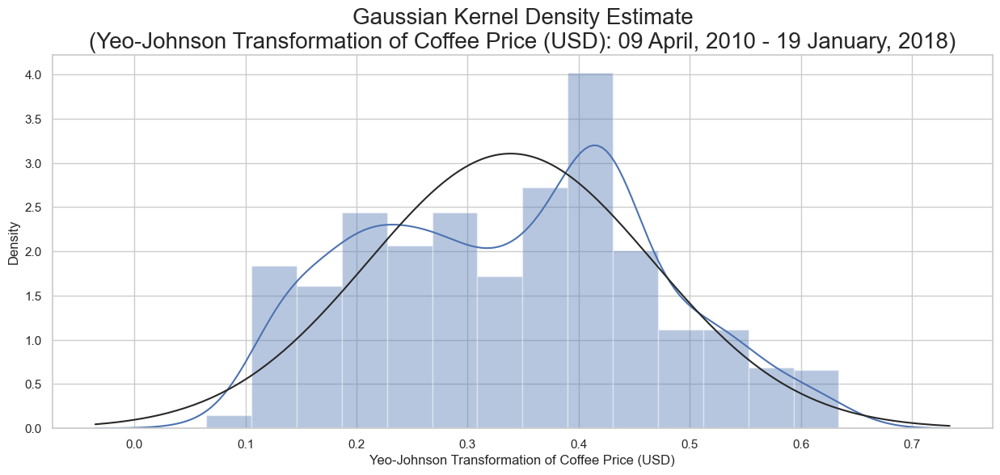

In [88]:
# Check the distribution based on skewness. 
myfcf_sta.kde_norm_distplot(df, col, start_date, end_date)

Hence, yeo-johnson tranformed sample is not normally distributed. 

#### After Log-Normal Transformation

##### Overview

In [89]:
# Select transformation category. 
trans_cat = 'Log-Normal'

# Add a log-normal transformation of coffee price (usd) column in new_cfpq_a30_df. 
new_cfpq_a30_df = cfpq_a30_df 

# Compute the values after log-normal transformation. 
log_cfq = np.log10(new_cfpq_a30_df['Coffee Price (USD)']) 

# Create a log-normal transformation of coffee price (usd) column in new_cfpq_a30_df. 
new_cfpq_a30_df['Log-Normal Transformation of Coffee Price (USD)'] = log_cfq 

# Display head of new_cfpq_a30_df. 
new_cfpq_a30_df.head()

,Species,Origin,Date,Total Quality Score,Total Quality Score Classification,Coffee Price (USD),Year,Box-Cox Transformation of Total Quality Score,Yeo-Johnson Transformation of Total Quality Score,Log-Normal Transformation of Total Quality Score,Square Root Transformation of Total Quality Score,Box-Cox Transformation of Coffee Price (USD),Yeo-Johnson Transformation of Coffee Price (USD),Log-Normal Transformation of Coffee Price (USD)
0,Arabica,Guatemala,2010-04-30,84.33,Very Good,1.3528,2010,1.004028e+26,1.004028e+26,-1.925982,1.685230,0.257373,0.257373,0.131234
1,Arabica,United States (Hawaii),2010-05-17,85.08,Excellent,1.3255,2010,1.137509e+26,1.137509e+26,-1.929827,1.445683,0.242553,0.242553,0.122380
2,Arabica,United States (Hawaii),2010-05-24,81.83,Very Good,1.3225,2010,6.569047e+25,6.569047e+25,-1.912913,2.310844,0.240885,0.240885,0.121396
3,Arabica,United States (Hawaii),2010-05-24,81.42,Very Good,1.3225,2010,6.119981e+25,6.119981e+25,-1.910731,2.397916,0.240885,0.240885,0.121396
4,Arabica,Mexico,2010-05-26,83.38,Very Good,1.3370,2010,8.558249e+25,8.558249e+25,-1.921062,1.946792,0.248873,0.248873,0.126131


##### Normality Test

To test $H_0$: Distribution is normal
<br>Against $H_1$: Distribution is not normal

###### Shapiro–Wilk Test

In [90]:
# Check if p-value is greater than the alpha level. 
# Input alpha for print_mult_shap_wilk_test func.
df = new_cfpq_a30_df
col = 'Log-Normal Transformation of Coffee Price (USD)'
alpha_lt = [0.05, 0.025, 0.01]

# Run print_mult_shap_wilk_test func. 
myfcf_sta.print_mult_shap_wilk_test(df, col, alpha_lt, start_date, end_date)

Shapiro–Wilk Test at 5.0% level of significance,
Shapiro–Wilk Test for Log-Normal Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=0.96, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 2.5% level of significance,
Shapiro–Wilk Test for Log-Normal Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=0.96, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 1.0% level of significance,
Shapiro–Wilk Test for Log-Normal Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=0.96, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




###### D'Agostino-Pearson Test

In [91]:
# Run print_mult_normal_test func. 
myfcf_sta.print_mult_normal_test(df, col, alpha_lt, start_date, end_date)

D'Agostino-Pearson Test at 5.0% level of significance,
D'Agostino-Pearson Test for Log-Normal Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=38.29, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 2.5% level of significance,
D'Agostino-Pearson Test for Log-Normal Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=38.29, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 1.0% level of significance,
D'Agostino-Pearson Test for Log-Normal Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=38.29, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




##### Probability Plot

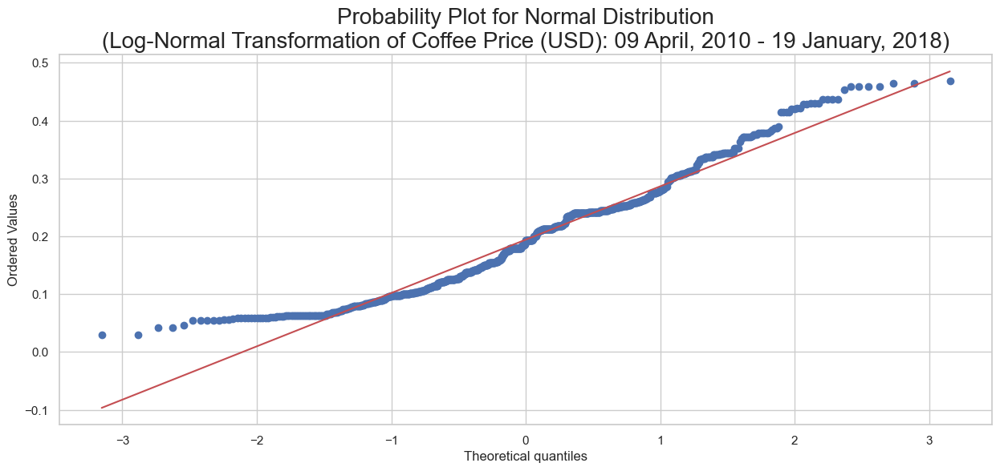

In [92]:
# Check if data points lay on the red color straight line. 
myfcf_sta.prob_plot(df, col, start_date, end_date)

##### Histogram 

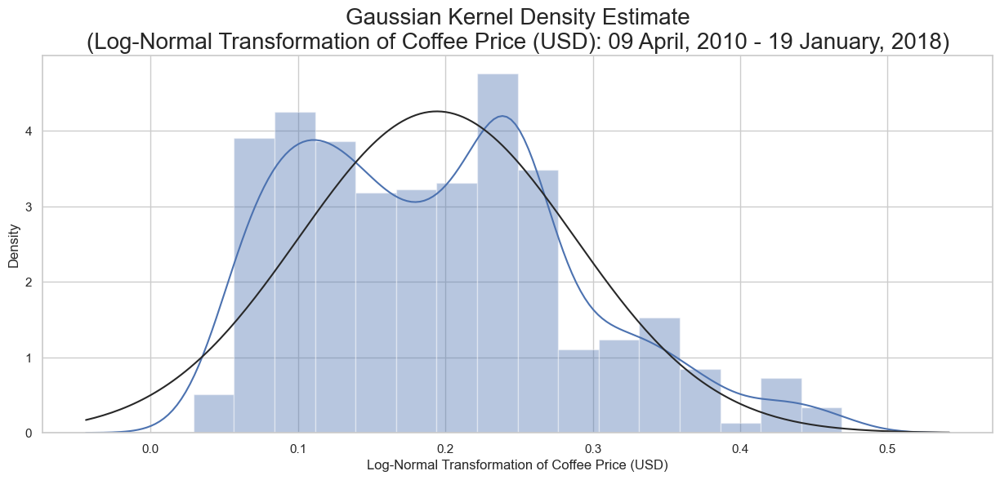

In [93]:
# Check the distribution based on skewness. 
myfcf_sta.kde_norm_distplot(df, col, start_date, end_date)

Hence, log-normal tranformed sample is not normally distributed.

#### After Square Root Transformation

##### Overview

In [94]:
# Select transformation category. 
trans_cat = 'Square Root'

# Add a square root transformation of coffee price (usd) column in new_cfpq_a30_df. 
new_cfpq_a30_df = cfpq_a30_df 

# Compute the values after square root transformation. 
sqrt_cfq = np.sqrt(new_cfpq_a30_df['Coffee Price (USD)'])

# Create a square root transformation of coffee price (usd) column in new_cfpq_a30_df. 
new_cfpq_a30_df['Square Root Transformation of Coffee Price (USD)'] = sqrt_cfq 

# Display head of new_cfpq_a30_df. 
new_cfpq_a30_df.head()

,Species,Origin,Date,Total Quality Score,Total Quality Score Classification,Coffee Price (USD),Year,Box-Cox Transformation of Total Quality Score,Yeo-Johnson Transformation of Total Quality Score,Log-Normal Transformation of Total Quality Score,Square Root Transformation of Total Quality Score,Box-Cox Transformation of Coffee Price (USD),Yeo-Johnson Transformation of Coffee Price (USD),Log-Normal Transformation of Coffee Price (USD),Square Root Transformation of Coffee Price (USD)
0,Arabica,Guatemala,2010-04-30,84.33,Very Good,1.3528,2010,1.004028e+26,1.004028e+26,-1.925982,1.685230,0.257373,0.257373,0.131234,1.163099
1,Arabica,United States (Hawaii),2010-05-17,85.08,Excellent,1.3255,2010,1.137509e+26,1.137509e+26,-1.929827,1.445683,0.242553,0.242553,0.122380,1.151304
2,Arabica,United States (Hawaii),2010-05-24,81.83,Very Good,1.3225,2010,6.569047e+25,6.569047e+25,-1.912913,2.310844,0.240885,0.240885,0.121396,1.150000
3,Arabica,United States (Hawaii),2010-05-24,81.42,Very Good,1.3225,2010,6.119981e+25,6.119981e+25,-1.910731,2.397916,0.240885,0.240885,0.121396,1.150000
4,Arabica,Mexico,2010-05-26,83.38,Very Good,1.3370,2010,8.558249e+25,8.558249e+25,-1.921062,1.946792,0.248873,0.248873,0.126131,1.156287


##### Normality Test

To test $H_0$: Distribution is normal
<br>Against $H_1$: Distribution is not normal

###### Shapiro–Wilk Test

In [95]:
# Check if p-value is greater than the alpha level. 
# Input alpha for print_mult_shap_wilk_test func.
df = new_cfpq_a30_df
col = 'Square Root Transformation of Coffee Price (USD)'
alpha_lt = [0.05, 0.025, 0.01]

# Run print_mult_shap_wilk_test func. 
myfcf_sta.print_mult_shap_wilk_test(df, col, alpha_lt, start_date, end_date)

Shapiro–Wilk Test at 5.0% level of significance,
Shapiro–Wilk Test for Square Root Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=0.94, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 2.5% level of significance,
Shapiro–Wilk Test for Square Root Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=0.94, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 1.0% level of significance,
Shapiro–Wilk Test for Square Root Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=0.94, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




###### D'Agostino-Pearson Test

In [96]:
# Run print_mult_normal_test func. 
myfcf_sta.print_mult_normal_test(df, col, alpha_lt, start_date, end_date)

D'Agostino-Pearson Test at 5.0% level of significance,
D'Agostino-Pearson Test for Square Root Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=74.34, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 2.5% level of significance,
D'Agostino-Pearson Test for Square Root Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=74.34, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 1.0% level of significance,
D'Agostino-Pearson Test for Square Root Transformation of Coffee Price (USD) (09 April, 2010 - 19 January, 2018)
stat=74.34, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




##### Probability Plot

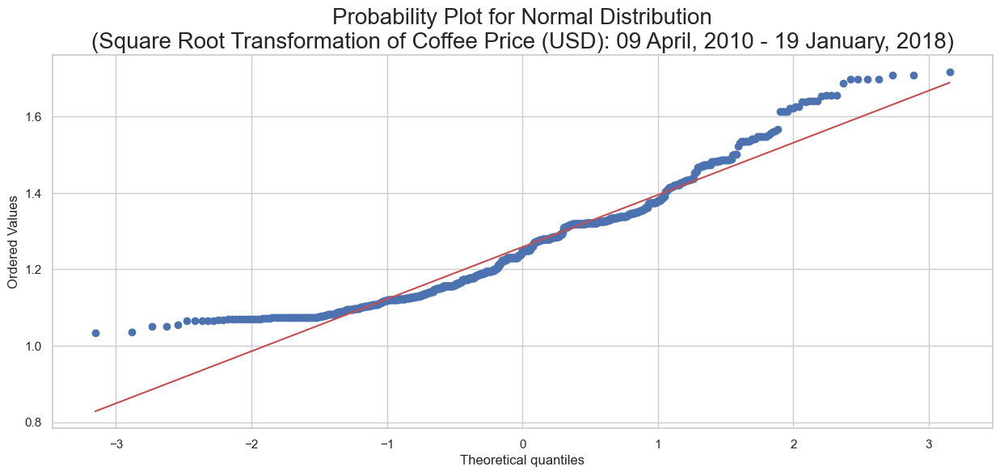

In [97]:
# Check if data points lay on the red color straight line. 
myfcf_sta.prob_plot(df, col, start_date, end_date)

##### Histogram

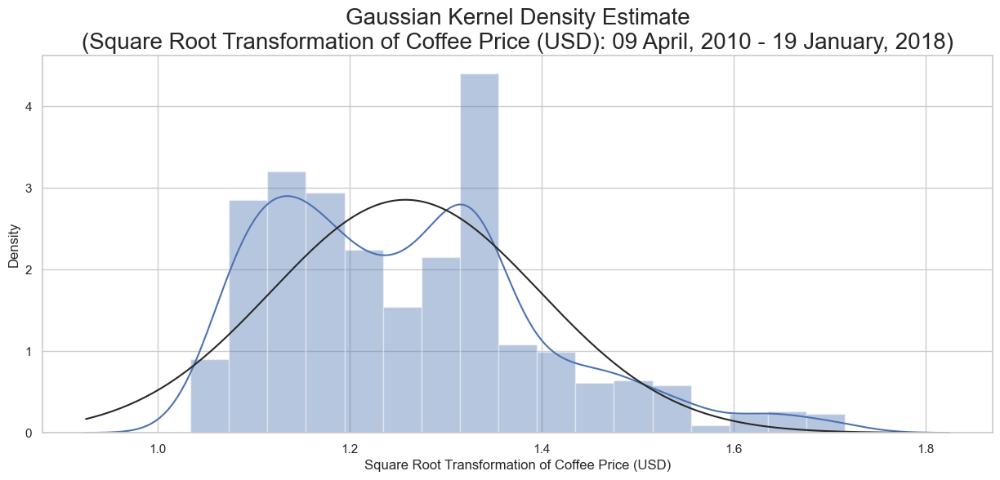

In [98]:
# Check the distribution based on skewness. 
myfcf_sta.kde_norm_distplot(df, col, start_date, end_date)

Hence, square root transformed sample is not normally distributed. 

### Data Visualizations

#### Boxplot

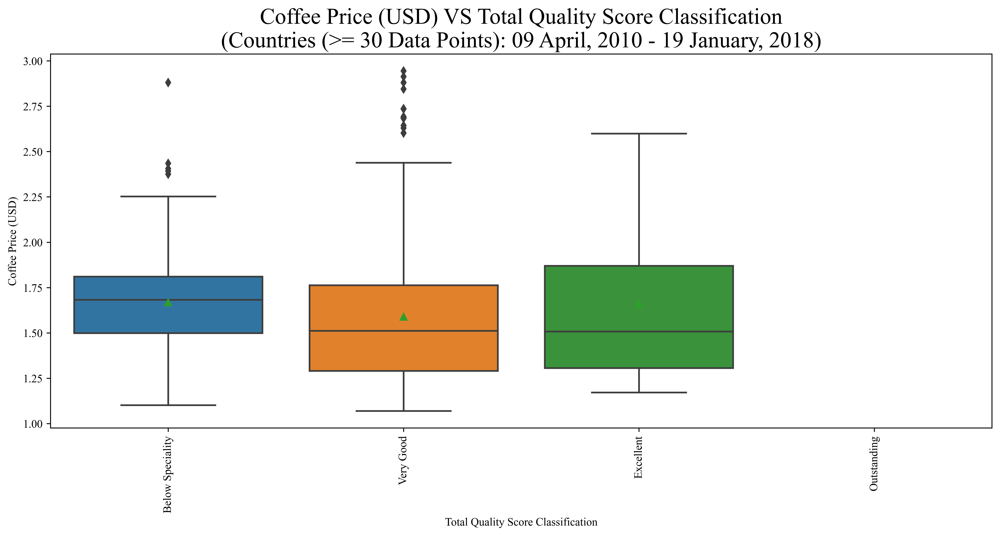

In [99]:
# Create a boxplot for countries with >= 30 data points.
# Inputs for cfpq_boxplot func. 
df = cfpq_a30_df
x = 'Total Quality Score Classification'
y = 'Coffee Price (USD)' 
hue = None
curr_mean_cfp = None
pop_mean_cfp = None
samp_mean_cfp = None

# Run cfpq_boxplot func. 
myfcf_gra.cfpq_boxplot(df, x, y, hue, curr_mean_cfp, pop_mean_cfp, samp_mean_cfp, start_date, end_date)

#### Histogram

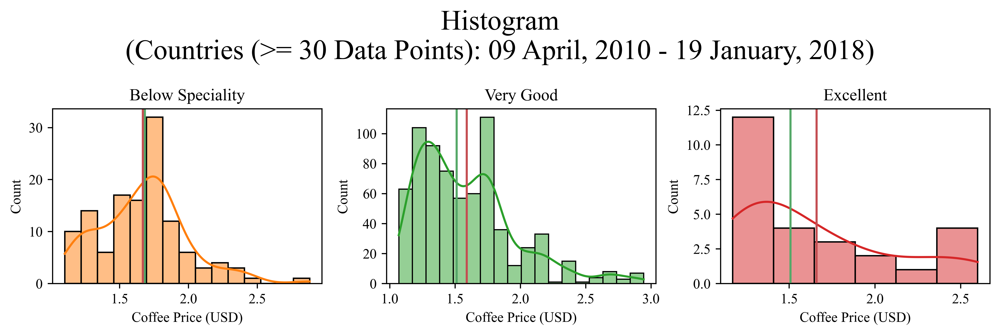

Note: Green line: Median; Red line: Mean


In [100]:
# Create a histrogram for countries with >= 30 data points.
# Inputs for ctry_a30_histplot func.
df1 = bs_df
df2 = vg_df
df3 = exc_df 
y = 'Coffee Price (USD)' 
sub_ttl_lt = ['Below Speciality', 'Very Good', 'Excellent']

# Run ctry_a30_histplot func.
myfcf_gra.ctry_a30_histplot_3df(df1, df2, df3, y, sub_ttl_lt, start_date, end_date)

### Non-parametric Tests

#### Perform Kruskal–Wallis H test

To test $H_0$: $μ_1$ = $μ_2$ = $μ_3$ = $μ_4$ = $μ_5$ = $μ_6$ = $μ_7$ = $μ_8$ = $μ_9$
<br>Against $H_1$: $μ_1$ ≠ $μ_2$ = $μ_3$ = $μ_4$ = $μ_5$ = $μ_6$ = $μ_7$ = $μ_8$ = $μ_9$

In [101]:
# Perform kruskal-wallis test for countries with >= 30 data points.
# Inputs for print_mult_krus_wall_test_3df func. 
df1 = bs_df
df2 = vg_df
df3 = exc_df 
x = 'Total Quality Score Classification'
y = 'Coffee Price (USD)' 
alpha_lt = [0.05, 0.025, 0.01]

# Run print_mult_krus_wall_test_3df func. 
myfcf_sta.print_mult_krus_wall_test_3df(df1, df2, df3, x, y, alpha_lt, start_date, end_date)

Kruskal-Wallis H Test at 5.0% level of significance,
Kruskal-Wallis H Test for Coffee Price (USD) and Total Quality Score Classification (09 April, 2010 - 19 January, 2018)
stat=856.00, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that coffee price (USD) is systematically higher or different in some total quality score classification than in others.


Kruskal-Wallis H Test at 2.5% level of significance,
Kruskal-Wallis H Test for Coffee Price (USD) and Total Quality Score Classification (09 April, 2010 - 19 January, 2018)
stat=856.00, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that coffee price (USD) is systematically higher or different in some total quality score classification than in others.


Kruskal-Wallis H Test at 1.0% level of significance,
Kruskal-Wallis H Test for Coffee Price (USD) and Total Quality Score Classification (09 April, 2010 - 19 January, 2018)
stat=856.00, 

Hence, based on the findings, there is significant evidence, at 1.0% to 5.0% level of significance, that coffee price (USD) is systematically higher or different in some total quality score classification than in others.

#### Perform Mann-Whitney U Test

To test $H_0$: $μ_1$ = $μ_2$ 
<br>Against $H_1$: $μ_1$ ≠ $μ_2$ 

In [102]:
# Print out mann-whitney u test results at various significant level. 
# Inputs for print_mult_mann_whit_test func. 
df = cfpq_a30_df
x = 'Total Quality Score Classification'
y = 'Coffee Price (USD)' 
alpha_lt = [0.05, 0.025, 0.01] # alpha: level of significance. 

# Run print_mult_mann_whit_test func. 
myfcf_sta.print_mult_mann_whit_test(df, x, y, alpha_lt, start_date, end_date)

Mann-Whitney U Test at 5.0% level of significance,
Mann-Whitney U Test for Coffee Price (USD) and Total Quality Score Classification (Very Good and Excellent) (09 April, 2010 - 19 January, 2018)
stat=8692.50, p=0.647
Do not reject Ho and conclude that there is no significant evidence, at 5.0% level of significance, that mean of Coffee Price (USD) for Very Good and mean of Coffee Price (USD) for Excellent is equal.
Mann-Whitney U Test for Coffee Price (USD) and Total Quality Score Classification (Very Good and Below Speciality) (09 April, 2010 - 19 January, 2018)
stat=35598.00, p=0.001
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that mean of Coffee Price (USD) for Very Good and mean of Coffee Price (USD) for Below Speciality is not equal.
Mann-Whitney U Test for Coffee Price (USD) and Total Quality Score Classification (Excellent and Below Speciality) (09 April, 2010 - 19 January, 2018)
stat=1451.50, p=0.394
Do not reject Ho and conclude tha

Hence, based on the findings, there is significant evidence, at 1.0% to 5.0% level of significance, that mean of Coffee Price (USD) for Very Good and mean of Coffee Price (USD) for Below Speciality is not equal, and that the mean of Coffee Price (USD) of Below Speciality is distinctly different from the rest.

## Project Phase 3

### Project Objective

Check whether sample coffee price (USD) mean  is equal, larger, or smaller than the population coffee price (USD) mean. <br>

Note: The sample data is based on coffee price (USD) from 30 April, 2010 to 19 January, 2018, and the population data is based on coffee price (USD) from 20 August, 1973 to 13 October, 2021.<br>

### Problem Solving Steps

<ol>
    <li>Ensure that the population is normally distributed.
        <ul>
            <li>If the population is not normally distributed, perform box-cox transformation on population. To create a new population, select a start date from one of the earliest date with the highest p-value (p-value > 0.05). p-value is obtained using D'Agostino-Pearson test.</li>
        </ul>
    </li>
    <li>Perform 1 sample Z test on the box-cox transformed versions of the previous sample and new population to test whether the sample mean is equal, greater, or smaller than the new population mean.</li>
    <li>Perform inverse box-cox transform to find the new population mean and sample mean.</li>
</ol>

### Criteria for 1 Sample Z-Test

- The population from which the sample is drawn is normally distributed. <br>
- The sample size is greater than 30. <br>
- A single sample is drawn. <br>
- We are testing for population mean. <br>
- The population standard deviation is know. <br>

### Normality Check

#### Overview

In [103]:
# Inputs for normality check.
df = cfp_df
col = 'Coffee Price (USD)'

In [104]:
# Find the start and end dates of the cfp_df. 
# Inputs for start_end_dates_tp func. 
df = cfp_df

# Run start_end_dates_tp func. 
start_date, end_date = myfcf_wra.start_end_dates_tp(df)

# Print start and end dates of cfq_df. 
print('Start Date: ' + start_date)
print('End Date: ' + end_date)  

Start Date: 1973-08-20
End Date: 2021-10-13


#### Normality Test

To test $H_0$: Distribution is normal
<br>Against $H_1$: Distribution is not normal

##### Shapiro–Wilk Test

In [105]:
# Check if p-value is greater than the alpha level. 
# Input alpha for print_mult_shap_wilk_test func.
alpha_lt = [0.05, 0.025, 0.01]

# Run print_mult_shap_wilk_test func. 
myfcf_sta.print_mult_shap_wilk_test(df, col, alpha_lt, start_date, end_date)

Shapiro–Wilk Test at 5.0% level of significance,
Shapiro–Wilk Test for Coffee Price (USD) (20 August, 1973 - 13 October, 2021)
stat=0.95, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 2.5% level of significance,
Shapiro–Wilk Test for Coffee Price (USD) (20 August, 1973 - 13 October, 2021)
stat=0.95, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 1.0% level of significance,
Shapiro–Wilk Test for Coffee Price (USD) (20 August, 1973 - 13 October, 2021)
stat=0.95, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




##### D'Agostino-Pearson Test

In [106]:
# Run print_mult_normal_test func. 
myfcf_sta.print_mult_normal_test(df, col, alpha_lt, start_date, end_date)

D'Agostino-Pearson Test at 5.0% level of significance,
D'Agostino-Pearson Test for Coffee Price (USD) (20 August, 1973 - 13 October, 2021)
stat=1410.66, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 2.5% level of significance,
D'Agostino-Pearson Test for Coffee Price (USD) (20 August, 1973 - 13 October, 2021)
stat=1410.66, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 1.0% level of significance,
D'Agostino-Pearson Test for Coffee Price (USD) (20 August, 1973 - 13 October, 2021)
stat=1410.66, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




#### Probability Plot

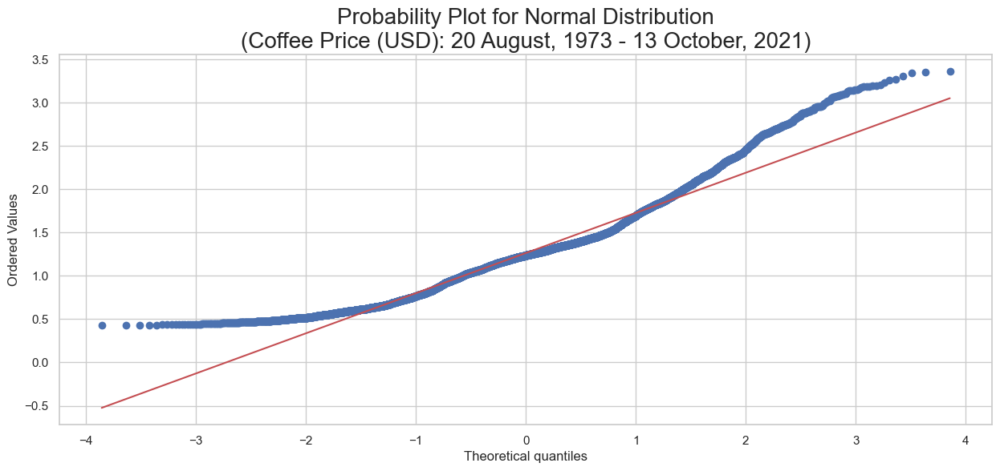

In [107]:
# Check if data points lay on the red color straight line. 
myfcf_sta.prob_plot(df, col, start_date, end_date) 

#### Histogram

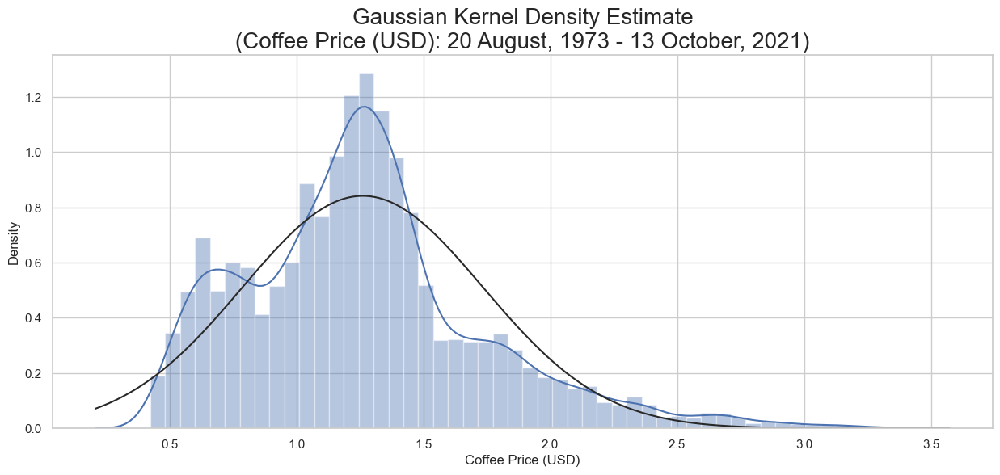

In [108]:
# Check the distribution based on skewness. 
myfcf_sta.kde_norm_distplot(df, col, start_date, end_date)

Hence, population is not normally distributed. 

### Box-Cox Transformation

To ensure the chosen population is close to normal distribution, elect a start date from one of the earliest date with the highest p-value (p-value > 0.05). p-value is obtained using D'Agostino-Pearson test. <br>

#### Before Box-Cox Transformation

##### Overview

In [109]:
# Create a dataframe for box-cox transformation. 
# Inputs for box_cox_df func. 
df = cfp_df 
col = 'Coffee Price (USD)'

# Run box_cox_df func. 
box_cox_df = myfcf_sta.box_cox_df(df, col)

# Display head of box_cox_df. 
box_cox_df.head() 

,Start Date,p-value,Lambda,Box-Cox,Skew
0,1973-08-20,0.151825,0.251609,"[-0.37624777437276524, -0.37961300427646727, -...",-0.0
1,1973-08-21,0.155173,0.251729,"[-0.37960406327274243, -0.39725526463400107, -...",-0.0
2,1973-08-22,0.158594,0.251847,"[-0.397245618533816, -0.38432193895272426, -0....",-0.0
3,1973-08-23,0.162162,0.251955,"[-0.38431372271507014, -0.3863450271239629, -0...",-0.0
4,1973-08-24,0.165721,0.252070,"[-0.3863361224115001, -0.39586059880214997, -0...",-0.0


In [110]:
# Filter for the top five p-values based on D'Agostino's K-squared test. 
box_cox_df[box_cox_df['p-value'] > 0.05].sort_values(by=['p-value', 'Start Date'], ascending=False).head()

,Start Date,p-value,Lambda,Box-Cox,Skew
3114,1986-11-02,0.997134,0.164045,"[0.9206148046864553, 0.9063795039685426, 1.017...",-0.0
92,1974-07-01,0.996280,0.274006,"[-0.3426534987070336, -0.35020777748541937, -0...",-0.0
4618,1992-10-02,0.995401,0.255766,"[-0.3474271948743407, -0.3330904335039328, -0....",-0.0
3092,1986-10-01,0.995397,0.165669,"[1.0686870409921603, 0.9102239122810306, 0.921...",-0.0
3112,1986-07-02,0.995397,0.165669,"[1.0686870409921603, 0.9102239122810306, 0.921...",-0.0


In [111]:
# Select index 92 to be the start date of coffee price (usd) population. 
box_cox_strt_dt = box_cox_df.iloc[92]['Start Date']

# Display box_cox_strt_dt. 
box_cox_strt_dt 

'1974-07-01'

The start date of the original Coffee Price (USD) population is August 20, 1973. However, July 1, 1974 is used instead, because they are just one year apart.

In [112]:
# Create new_cf_price_df using the start date related to the chosen p-value.
# Inputs for new_cf_price_df func. 
df = cfp_df 
strt_dt = box_cox_strt_dt

# Run new_cfp_df func. 
new_cfp_df = myfcf_sta.new_cfp_df(df, strt_dt)

# Display head of new_cfp_df. 
new_cfp_df.head()

,Date,Coffee Price (USD)
92,1974-07-01,0.6978
93,1974-08-01,0.6920
94,1974-09-01,0.6903
95,1974-10-01,0.6958
96,1974-11-01,0.7085


In [113]:
# Find the start and end dates of the new_cf_price_df.
# Inputs for start_end_dates_tp func. 
df = new_cfp_df 
col = 'Coffee Price (USD)' 

# Run start_end_dates_tp func. 
start_date, end_date = myfcf_wra.start_end_dates_tp(df)

##### Normality Test

###### Shapiro–Wilk Test

In [114]:
# Check if p-value is greater than the alpha level. 
# Input alpha for print_mult_shap_wilk_test func.
alpha_lt = [0.05, 0.025, 0.01]

# Run print_mult_shap_wilk_test func. 
myfcf_sta.print_mult_shap_wilk_test(df, col, alpha_lt, start_date, end_date)

Shapiro–Wilk Test at 5.0% level of significance,
Shapiro–Wilk Test for Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=0.95, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 2.5% level of significance,
Shapiro–Wilk Test for Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=0.95, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 1.0% level of significance,
Shapiro–Wilk Test for Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=0.95, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




###### D'Agostino-Pearson Test

In [115]:
# Run print_mult_normal_test func. 
myfcf_sta.print_mult_normal_test(df, col, alpha_lt, start_date, end_date)

D'Agostino-Pearson Test at 5.0% level of significance,
D'Agostino-Pearson Test for Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=1387.30, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 2.5% level of significance,
D'Agostino-Pearson Test for Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=1387.30, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


D'Agostino-Pearson Test at 1.0% level of significance,
D'Agostino-Pearson Test for Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=1387.30, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




##### Probability Plot

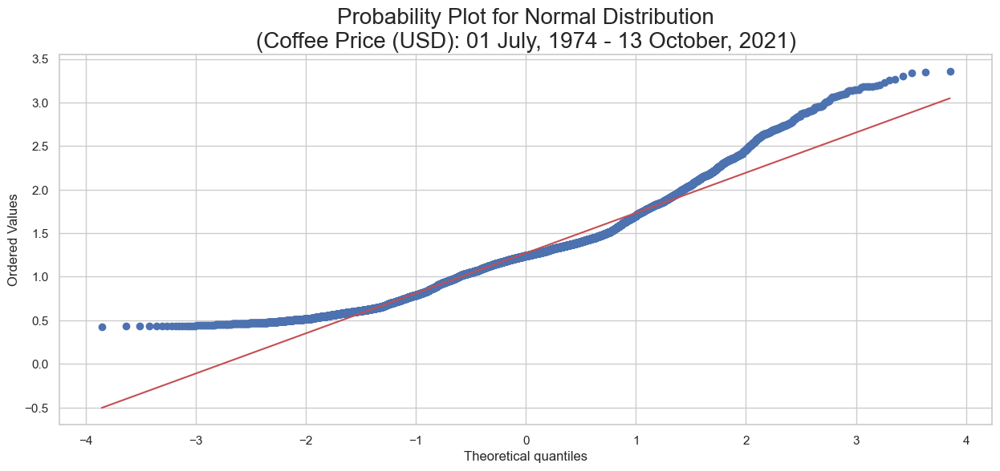

In [116]:
# Check if data points lay on the red color straight line. 
myfcf_sta.prob_plot(df, col, start_date, end_date)

##### Histogram

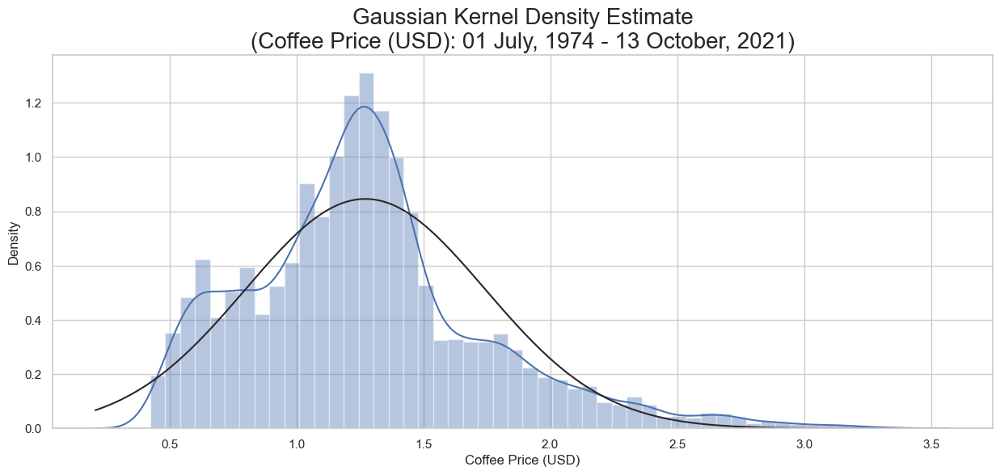

In [117]:
# Check the distribution based on skewness. 
myfcf_sta.kde_norm_distplot(df, col, start_date, end_date)

Hence, population is not normally distributed. 

#### After Box-Cox Transformation

##### Overview

In [118]:
# Inputs for normality check.
df = new_cfp_df

In [119]:
# Select index 92 for the box-transformed coffee price (usd) population. 
box_cox_arr = box_cox_df.iloc[92]['Box-Cox']

# Create a column 'Box-Cox Transformation of Coffee Price (USD)' within new_cfp_df. 
new_cfp_df['Box-Cox Transformation of Coffee Price (USD)'] = box_cox_arr

# Display head of new_cfp_df.
new_cfp_df.head()

,Date,Coffee Price (USD),Box-Cox Transformation of Coffee Price (USD)
92,1974-07-01,0.6978,-0.342653
93,1974-08-01,0.6920,-0.350208
94,1974-09-01,0.6903,-0.352431
95,1974-10-01,0.6958,-0.345253
96,1974-11-01,0.7085,-0.328836


##### Normality Test

To test $H_0$: Distribution is normal
<br>Against $H_1$: Distribution is not normal

###### Shapiro–Wilk Test

In [120]:
# Check if p-value is greater than the alpha level. 
# Input alpha for print_mult_shap_wilk_test func.
col = 'Box-Cox Transformation of Coffee Price (USD)'
alpha_lt = [0.05, 0.025, 0.01]

# Run print_mult_shap_wilk_test func. 
myfcf_sta.print_mult_shap_wilk_test(df, col, alpha_lt, start_date, end_date)

Shapiro–Wilk Test at 5.0% level of significance,
Shapiro–Wilk Test for Box-Cox Transformation of Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=0.99, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 2.5% level of significance,
Shapiro–Wilk Test for Box-Cox Transformation of Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=0.99, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that the population is not normally-distributed.


Shapiro–Wilk Test at 1.0% level of significance,
Shapiro–Wilk Test for Box-Cox Transformation of Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=0.99, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that the population is not normally-distributed.




###### D’Agostino-Pearson Test

In [121]:
# Run print_mult_normal_test func. 
myfcf_sta.print_mult_normal_test(df, col, alpha_lt, start_date, end_date)

D'Agostino-Pearson Test at 5.0% level of significance,
D'Agostino-Pearson Test for Box-Cox Transformation of Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=0.01, p=0.996
Do not reject Ho and conclude that there is no significant evidence, at 5.0% level of significance, that the population is normally-distributed.


D'Agostino-Pearson Test at 2.5% level of significance,
D'Agostino-Pearson Test for Box-Cox Transformation of Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=0.01, p=0.996
Do not reject Ho and conclude that there is no significant evidence, at 2.5% level of significance, that the population is normally-distributed.


D'Agostino-Pearson Test at 1.0% level of significance,
D'Agostino-Pearson Test for Box-Cox Transformation of Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=0.01, p=0.996
Do not reject Ho and conclude that there is no significant evidence, at 1.0% level of significance, that the population is normally-distributed.




##### Probability Plot

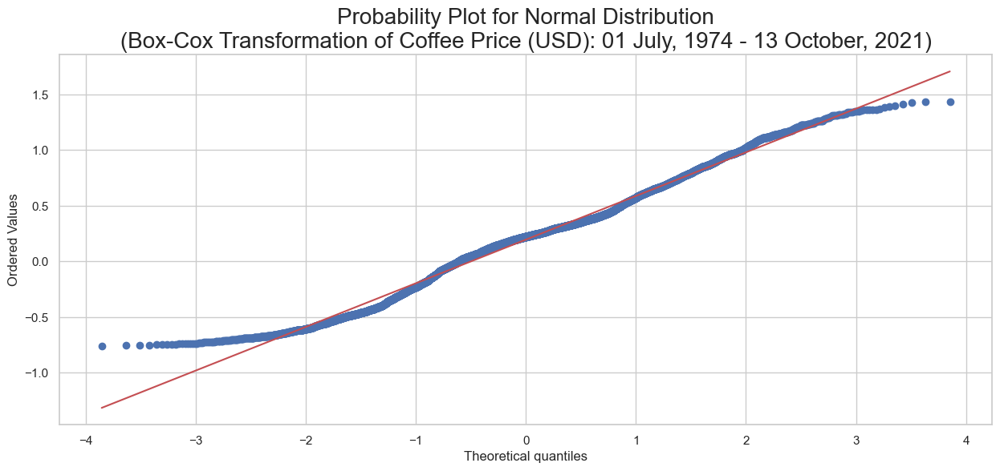

In [122]:
# Check if data points lay on the red color straight line. 
myfcf_sta.prob_plot(df, col, start_date, end_date)

##### Histogram

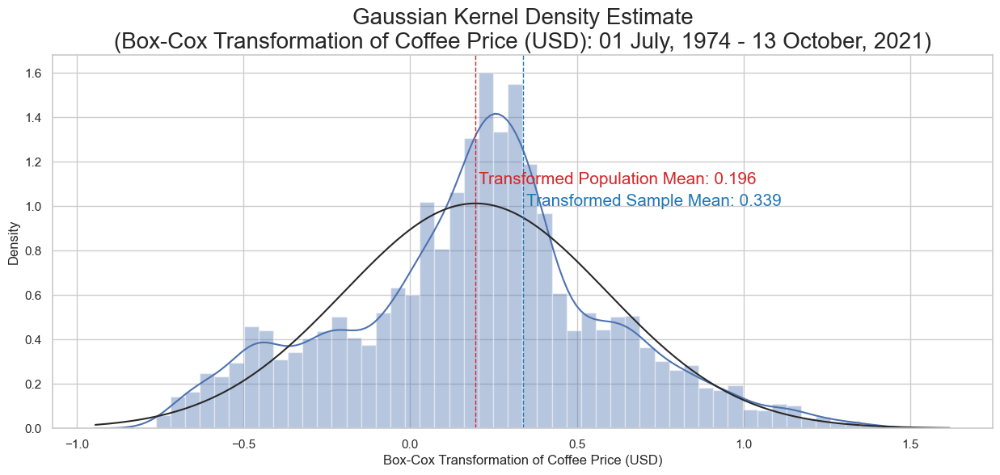

In [123]:
# Inputs for trans_hist func. 
pop_df = new_cfp_df
samp_df = new_cfpq_a30_df 
col = 'Box-Cox Transformation of Coffee Price (USD)' 

# Run trans_hist func. 
myfcf_sta.trans_hist(pop_df, samp_df, col, trans_cat, start_date, end_date)

Hence, box-cox transformed Coffee Price (USD) population from July 1, 1974 onwards is normally distributed. 

### Parametric Testing

#### Perform 1 Sample Z-Test

In [124]:
# Inputs for box_cox_pop_samp_mean_tp func.  
pop_df = new_cfp_df
samp_df = new_cfpq_a30_df
col = 'Coffee Price (USD)'
trans_cat = 'Box-Cox'

# Run box_cox_pop_samp_mean_tp func. 
box_cox_pop_mean, box_cox_samp_mean = myfcf_sta.box_cox_pop_samp_mean_tp(pop_df, samp_df, col, trans_cat)

#### Two-Tail Z Test

To test $H_0$: $μ$ = $μ_0$
<br>Against $H_1$: $μ$ ≠ $μ_0$

In [125]:
# Inputs for print_mult_one_sample_ztest func. 
samp_df = new_cfpq_a30_df 
col = 'Box-Cox Transformation of Coffee Price (USD)'
pop_mean = box_cox_pop_mean
sign = 'two-sided'
alpha_lt = [0.05, 0.025, 0.01] 

# Run print_mult_one_sample_ztest func. 
myfcf_sta.print_mult_one_sample_ztest(samp_df, col, pop_mean, sign, alpha_lt, start_date, end_date)

1-sample Z Test at 5.0% level of significance,
1-Sample Z-Test for Box-Cox Transformation of Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=21.69, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that transformed sample mean is not equal to the transformed population mean.


1-sample Z Test at 2.5% level of significance,
1-Sample Z-Test for Box-Cox Transformation of Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=21.69, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that transformed sample mean is not equal to the transformed population mean.


1-sample Z Test at 1.0% level of significance,
1-Sample Z-Test for Box-Cox Transformation of Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=21.69, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that transformed sample mean is not equal to the transformed populati

#### One-Tail Z Test

To test $H_0$: $μ$ = $μ_0$
<br>Against $H_1$: $μ$ > $μ_0$

In [126]:
# Inputs for print_mult_one_sample_ztest func. 
samp_df = new_cfpq_a30_df 
col = 'Box-Cox Transformation of Coffee Price (USD)'
pop_mean = box_cox_pop_mean
sign = 'larger'
alpha_lt = [0.05, 0.025, 0.01] 

# Run print_mult_one_sample_ztest func. 
myfcf_sta.print_mult_one_sample_ztest(samp_df, col, pop_mean, sign, alpha_lt, start_date, end_date)

1-sample Z Test at 5.0% level of significance,
1-Sample Z-Test for Box-Cox Transformation of Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=21.69, p=0.000
Reject Ho and conclude that there is significant evidence, at 5.0% level of significance, that transformed sample mean is larger than the transformed population mean.


1-sample Z Test at 2.5% level of significance,
1-Sample Z-Test for Box-Cox Transformation of Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=21.69, p=0.000
Reject Ho and conclude that there is significant evidence, at 2.5% level of significance, that transformed sample mean is larger than the transformed population mean.


1-sample Z Test at 1.0% level of significance,
1-Sample Z-Test for Box-Cox Transformation of Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=21.69, p=0.000
Reject Ho and conclude that there is significant evidence, at 1.0% level of significance, that transformed sample mean is larger than the transformed population 

To test $H_0$: $μ$ = $μ_0$
<br>Against $H_1$: $μ$ < $μ_0$

In [127]:
# Inputs for print_mult_one_sample_ztest func. 
samp_df = new_cfpq_a30_df 
col = 'Box-Cox Transformation of Coffee Price (USD)'
pop_mean = box_cox_pop_mean
sign = 'smaller'
alpha_lt = [0.05, 0.025, 0.01] 

# Run print_mult_one_sample_ztest func. 
myfcf_sta.print_mult_one_sample_ztest(samp_df, col, pop_mean, sign, alpha_lt, start_date, end_date)

1-sample Z Test at 5.0% level of significance,
1-Sample Z-Test for Box-Cox Transformation of Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=21.69, p=1.000
Do not reject Ho and conclude that there is no significant evidence, at 5.0% level of significance, that transformed sample mean is smaller than the transformed population mean.


1-sample Z Test at 2.5% level of significance,
1-Sample Z-Test for Box-Cox Transformation of Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=21.69, p=1.000
Do not reject Ho and conclude that there is no significant evidence, at 2.5% level of significance, that transformed sample mean is smaller than the transformed population mean.


1-sample Z Test at 1.0% level of significance,
1-Sample Z-Test for Box-Cox Transformation of Coffee Price (USD) (01 July, 1974 - 13 October, 2021)
stat=21.69, p=1.000
Do not reject Ho and conclude that there is no significant evidence, at 1.0% level of significance, that transformed sample mean is smaller

Hence, based on the findings, there is significant evidence, at 1.0% to 5.0% level of significance, that the transformed sample mean is larger than the transformed population mean.

### Inverse Box-Cox Transformation

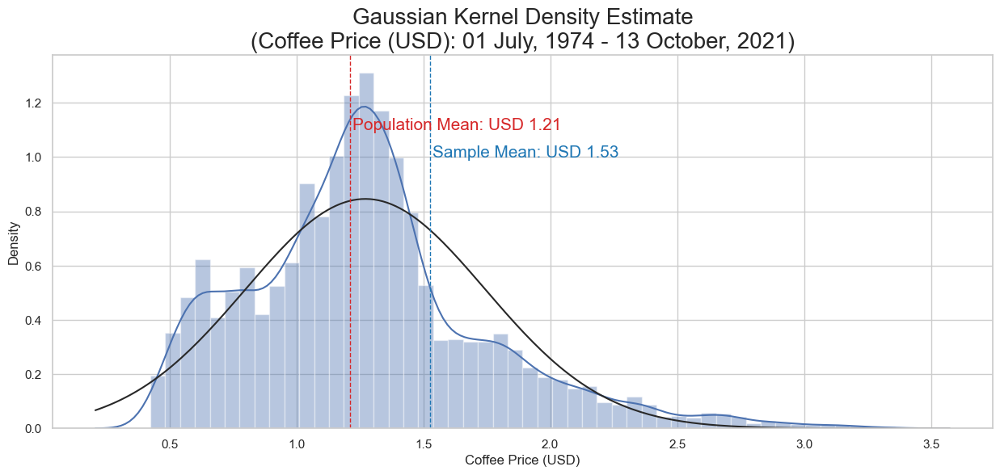

In [128]:
# Inputs for trans_hist func. 
pop_df = new_cfp_df
samp_df = new_cfpq_a30_df 
col = 'Coffee Price (USD)' 

# Run trans_hist func. 
myfcf_sta.trans_hist(pop_df, samp_df, col, trans_cat, start_date, end_date)

In [129]:
# Inputs for print_mean_pop_samp func. 
pop_df = new_cfp_df
samp_df = new_cfpq_a30_df 

# Run print_mean_pop_samp func. 
myfcf_sta.print_mean_pop_samp(pop_df, samp_df)

Box-Cox Transformation:
Population mean of box-cox transformed coffee price (USD): 0.196
Sample mean of box-cox transformed coffee price (USD): 0.339


After Inverse Box-Cox Transformation:
Population mean of coffee price: USD 1.21
Sample mean of coffee price: USD 1.53


Hence, based on the findings, there is significant evidence, at 1.0% to 5.0% level of significance, that the sample mean of Coffee Price (USD) is larger than the population mean of Coffee Price (USD).

## Project Phase 4

### Project Objective

Evaluate the feasibility of selling premium coffee in the current environment. <br>

Note: The population data is based on coffee price (USD) from July 1, 1974 to 13 October, 2021.<br>

### Problem Solving Steps

<ol>
    <li>Create boxplots of Coffee Price (USD) to check where the current Coffee Price (USD) lies.</li>
</ol>   

### Coffee Price (USD)

In [130]:
# Find sample mean of coffee price and sample mean of transformed coffee price. 
samp_mean_cfp, samp_mean_trans_cfp = myfcf_sta.mean_cfp_trans_tp(samp_df) 

# Find population mean of coffee price and population mean of transformed coffee price. 
pop_mean_cfp, pop_mean_trans_cfp = myfcf_sta.mean_cfp_trans_tp(pop_df) 

# Find current coffee price. 
curr_cfp = new_cfp_df['Coffee Price (USD)'].tail(1).values[0]

In [131]:
# Find the start and end dates of the new_cfp_df. 
# Inputs for start_end_dates_tp func. 
df = new_cfp_df

# Run start_end_dates_tp func. 
start_date, end_date = myfcf_wra.start_end_dates_tp(df)

#### Data Visualizations

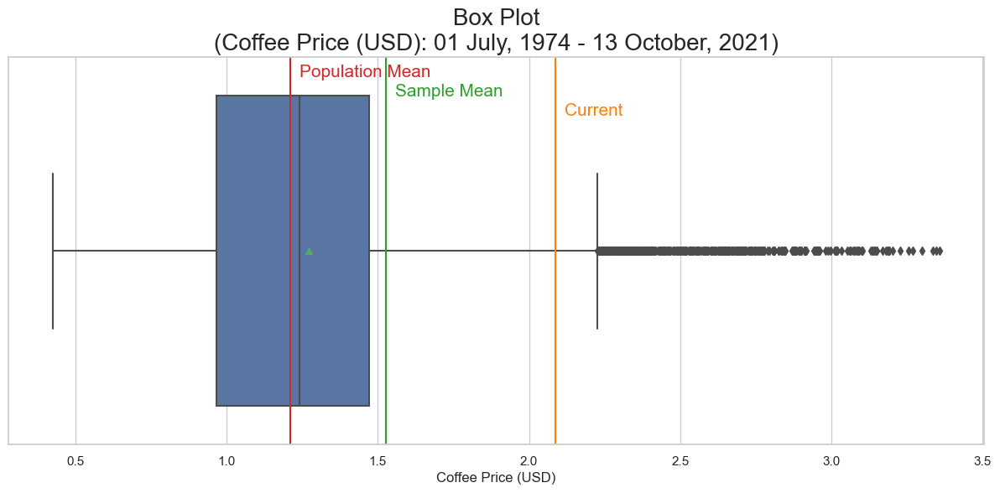

In [132]:
# Inputs for cfp_h_boxplot func. 
df = new_cfp_df
col = 'Coffee Price (USD)'

# Run cfp_h_boxplot func. 
myfcf_gra.cfp_h_boxplot(df, col, curr_cfp, pop_mean_cfp, samp_mean_cfp, start_date, end_date)

#### Data Analysis

In [133]:
# Inputs for print_pct_abv_bel_cfp func.  
df = new_cfp_df
cfp = curr_cfp
cat_cfp = 'Current Coffee Price'
ttl_txt = 'Coffee price from 01 July, 1974 to 13 October, 2021'

# Run print_pct_abv_bel_cfp func. 
myfcf_sta.print_pct_abv_bel_cfp(df, cfp, cat_cfp, ttl_txt)

Coffee price from 01 July, 1974 to 13 October, 2021
6.23% of the data points are above USD2.09 (Current Coffee Price)
93.77% of the data points are above USD2.09 (Current Coffee Price)


### Coffee Price (USD) VS Total Quality Score Classification

In [134]:
# Find the start and end dates of the new_cfpq_a30_df. 
# Inputs for start_end_dates_tp func. 
df = new_cfpq_a30_df 

# Run start_end_dates_tp func. 
start_date, end_date = myfcf_wra.start_end_dates_tp(df)

#### Data Visualizations

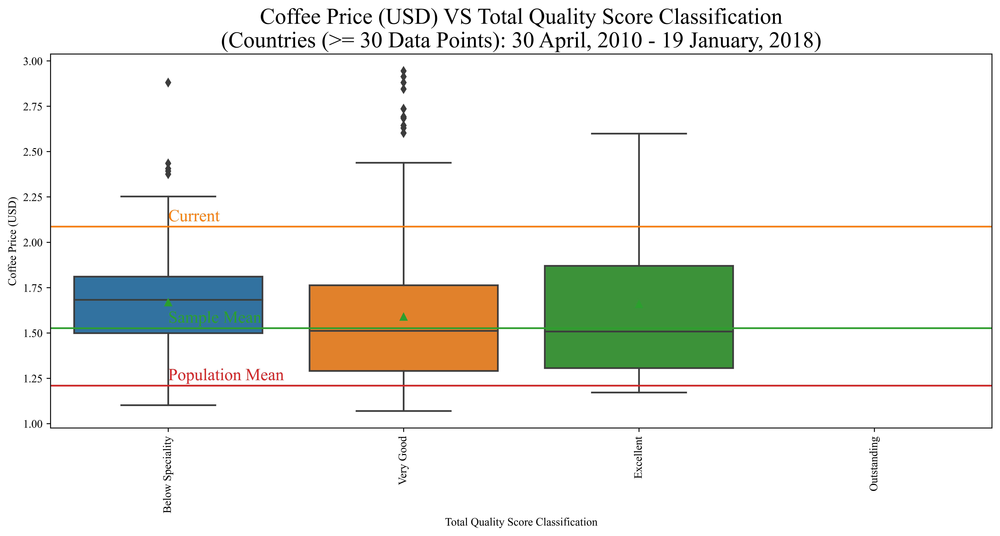

In [135]:
# Create a boxplot for countries with >= 30 data points.
# Inputs for cfpq_boxplot func. 
df = new_cfpq_a30_df 
x = 'Total Quality Score Classification'
y = 'Coffee Price (USD)' 
hue = None
curr_cfp = new_cfp_df['Coffee Price (USD)'].tail(1).values[0]

# Run cfpq_boxplot func. 
myfcf_gra.cfpq_boxplot(df, x, y, hue, curr_cfp, pop_mean_cfp, samp_mean_cfp, start_date, end_date)

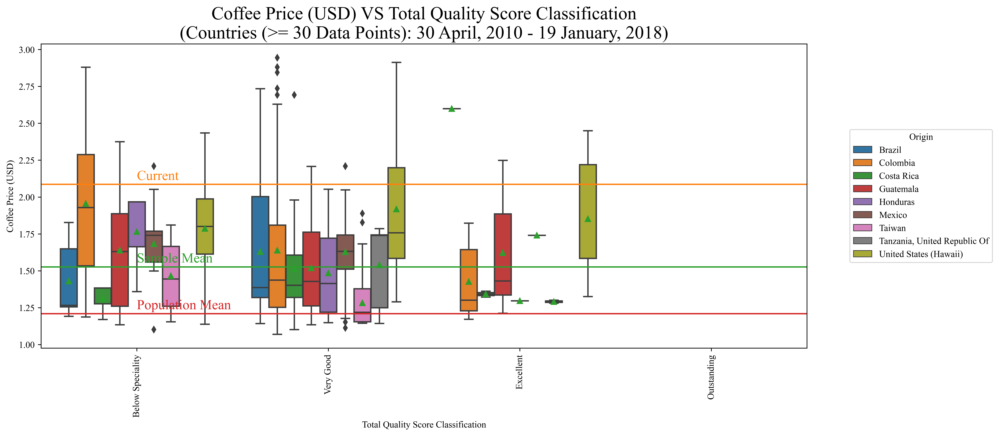

In [136]:
# Create a boxplot for countries with >= 30 data points.
# Inputs for cfpq_boxplot func. 
df = new_cfpq_a30_df 
x = 'Total Quality Score Classification'
y = 'Coffee Price (USD)' 
hue = 'Origin'
curr_cfp = new_cfp_df['Coffee Price (USD)'].tail(1).values[0]

# Run cfpq_boxplot func. 
myfcf_gra.cfpq_boxplot(df, x, y, hue, curr_cfp, pop_mean_cfp, samp_mean_cfp, start_date, end_date)

### Feasibility of Purchase Coffee Beans

The current coffee future price is extremely high, because only 6.23% of the historical data points are above the current price, and it is way above the sample mean and population mean prices. Hence, it is not a wise decision to purchase coffee beans at this point in time.

If coffee prices move closer towards the sample mean of Coffee Price (USD), Columbian coffee with quality of Excellent and Very Good can be considered good purchases.

## Findings

Based on our findings with Ethiopia excluded (not much coffee future contracts are done in Ethiopia <a href=https://www.trabocca.com/coffee-knowledge/coffee-supply-chains/coffee-futures-the-basics-for-coffee-roasters/> [4]</a>), the mean of Total Quality Score among the countries are not similar (apart from Ethopian coffee, Colombian coffee is the leader in quality coffee), and the mean of Coffee Price (USD) among the Total Quality Score are not similar (Below Speciality coffee is the cheapest), and the ideal coffee purchase price is USD 1.21. 


## Conclusion

Besides a strong coffee demand, there is a deficit in global coffee stockpile. These are driving coffee future price (USD 2.09) above its sample coffee price. Hence, we have decided not to venture into the business of selling premium coffee, because of high business risk due to the ongoing Covid-19 situation, as customers might turn to inferior goods when they loss their jobs, or when their disposable income gets shrunk by rising inflation.

## Limitations

The accuracy of our statistical models depends whether the Coffee Price (USD) distribution is within USD 0.43 to USD 3.36 and Total Quality Score distribution is within 70.67 to 87.17, and be deemed inaccurate if there are any deviation from these distributions.

## Recommendations

We might relook into entering the premium coffee business, if strong coffee demand remains and the current coffee future prices are somewhat closer to the coffee sample price when there is no deficit in global coffee stockpile. The premium coffee that we would consider purchasing would be Columbian coffee with quality of Excellent and Very Good. 